## UPDATED SOLO PROJECT BUT JUST ANALYSIS

In [211]:
import numpy as np
import sunpy
import astropy
import numpy
from IPython.core.pylabtools import figsize
from asdf.commands.diff import print_in_tree
from matplotlib import pyplot as plt
# import cdflib
# import sunpy_soar
from matplotlib.pyplot import legend
from sunpy.net import Fido, attrs as a
from sunpy.sun.constants import density
import pandas as pd

# Set display options to show all columns
pd.set_option('display.max_columns', None)


## DATA MANIPULATION

In [212]:
SWA_pickle_files = ['./Date_Ranges_SOLO_YR1/SOLO_SWA_date_range1-25.pkl','./Date_Ranges_SOLO_YR1/SOLO_SWA_date_range26-51.pkl','./Date_Ranges_SOLO_YR1/SOLO_SWA_date_range52-77.pkl','./Date_Ranges_SOLO_YR1/SOLO_SWA_date_range78-103.pkl','./Date_Ranges_SOLO_YR1/SOLO_SWA_date_range104-129.pkl','./Date_Ranges_SOLO_YR1/SOLO_SWA_date_range130-134.pkl']
MAG_pickle_files = ['./Date_Ranges_SOLO_YR1/SOLO_MAG_date_range1-25.pkl','./Date_Ranges_SOLO_YR1/SOLO_MAG_date_range26-51.pkl','./Date_Ranges_SOLO_YR1/SOLO_MAG_date_range52-77.pkl','./Date_Ranges_SOLO_YR1/SOLO_MAG_date_range78-103.pkl','./Date_Ranges_SOLO_YR1/SOLO_MAG_date_range104-129.pkl','./Date_Ranges_SOLO_YR1/SOLO_MAG_date_range130-134.pkl']


In [213]:
# Convert the timeseries to a dataframe
import pickle

SWA_timeseries_df = None
# Unpickling (loading) an object
all_SWA_dfs = []
for path in SWA_pickle_files:
            # Use pandas to read the pickled file
    a_SWA_df = pd.read_pickle(path)
    all_SWA_dfs.append(a_SWA_df)
SWA_timeseries_df = pd.concat(all_SWA_dfs,sort=True)

MAG_timeseries_df = None
all_MAG_dfs = []
for path in MAG_pickle_files:
            # Use pandas to read the pickled file
    a_MAG_df = pd.read_pickle(path)
    all_MAG_dfs.append(a_MAG_df)
MAG_timeseries_df = pd.concat(all_MAG_dfs,sort=True)



display(SWA_timeseries_df.head())
MAG_timeseries_df.head()

,Distance,Half_interval,Info,N,P_RTN_0,P_RTN_1,P_RTN_2,P_RTN_3,P_RTN_4,P_RTN_5,P_SRF_0,P_SRF_1,P_SRF_2,P_SRF_3,P_SRF_4,P_SRF_5,SCET,T,TxTyTz_RTN_0,TxTyTz_RTN_1,TxTyTz_RTN_2,TxTyTz_SRF_0,TxTyTz_SRF_1,TxTyTz_SRF_2,V_RTN_0,V_RTN_1,V_RTN_2,V_SOLO_RTN_0,V_SOLO_RTN_1,V_SOLO_RTN_2,V_SRF_0,V_SRF_1,V_SRF_2,name,quality_factor,total_count,unrecovered_count
Epoch,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2021-08-21 00:08:01.118751,0.65,0.5,0,26.741230,1.369987e-16,1.428941e-16,1.039994e-16,-3.057749e-17,6.547376e-18,3.094860e-18,1.369986e-16,1.395958e-16,1.072978e-16,-2.590593e-17,-1.751383e-17,1.126889e-17,682819600.5,29.866898,31.975582,33.351582,24.273535,31.975565,32.581749,25.043381,437.473389,-26.718201,6.084368,-9.220928,40.506252,1.396734,-446.694244,60.586525,29.503029,Date_Range1,0.0,10343.0,0.0
2021-08-21 00:08:05.118758,0.65,0.5,0,26.076748,1.206066e-16,1.406463e-16,1.020220e-16,-2.247051e-17,3.485177e-18,3.781086e-18,1.206066e-16,1.378621e-16,1.048062e-16,-1.953381e-17,-1.164045e-17,1.068102e-17,682819604.5,28.983057,28.866968,33.663433,24.418768,28.866959,32.997040,25.085175,439.720306,-22.816080,3.323184,-9.220916,40.506268,1.396736,-448.941162,58.001167,25.482334,Date_Range1,0.0,10288.0,0.0
2021-08-21 00:08:09.118765,0.65,0.5,0,25.579350,1.385972e-16,1.397011e-16,9.777712e-17,-3.160848e-17,7.177762e-18,1.653420e-18,1.385971e-16,1.349782e-16,1.025001e-16,-2.662613e-17,-1.848421e-17,1.335786e-17,682819608.5,30.587759,33.818031,34.087402,23.857845,33.818020,32.935001,25.010258,432.573883,-27.319345,2.573995,-9.220904,40.506283,1.396738,-441.794739,62.457554,26.472490,Date_Range1,0.0,9850.0,0.0
2021-08-21 00:08:13.118772,0.65,0.5,0,25.094852,1.309822e-16,1.382379e-16,9.690929e-17,-3.178418e-17,8.530045e-18,4.017915e-19,1.309822e-16,1.327297e-16,1.024175e-16,-2.628304e-17,-1.980398e-17,1.405233e-17,682819612.5,30.353735,32.577007,34.381580,24.102619,32.577003,33.011612,25.472588,436.548035,-27.892700,1.240144,-9.220893,40.506298,1.396740,-445.768921,63.488171,25.449915,Date_Range1,0.0,9887.0,0.0
2021-08-21 00:08:17.118779,0.65,0.5,0,26.132803,1.366498e-16,1.469071e-16,1.052585e-16,-3.267473e-17,1.265891e-17,-4.567090e-18,1.366498e-16,1.379055e-16,1.142601e-16,-2.556387e-17,-2.396612e-17,1.774069e-17,682819616.5,30.954201,32.636707,35.086510,25.139381,32.636715,32.936615,27.289270,437.345337,-25.834433,1.337073,-9.220881,40.506313,1.396742,-446.566254,61.543022,24.769398,Date_Range1,0.0,10362.0,0.0


,B_RTN_0,B_RTN_1,B_RTN_2,Distance,QUALITY_BITMASK,QUALITY_FLAG,VECTOR_RANGE,VECTOR_TIME_RESOLUTION,name
EPOCH,,,,,,,,,
2021-08-21 00:08:29.999999776,-13.179045,14.118096,0.086142,0.65,164,2,3,0.016667,Date_Range1
2021-08-21 00:09:29.999996200,-13.549139,13.454594,1.530531,0.65,160,2,3,0.016667,Date_Range1
2021-08-21 00:10:30.000002682,-14.307286,13.455720,2.443442,0.65,160,2,3,0.016667,Date_Range1
2021-08-21 00:11:29.999999105,-12.954463,10.547703,9.633520,0.65,160,2,3,0.016667,Date_Range1
2021-08-21 00:12:29.999995529,-14.416012,9.818862,8.968830,0.65,160,2,3,0.016667,Date_Range1


In [214]:
print('SWA:', SWA_timeseries_df.columns)
print('MAG:', MAG_timeseries_df.columns)

SWA: Index(['Distance', 'Half_interval', 'Info', 'N', 'P_RTN_0', 'P_RTN_1',
       'P_RTN_2', 'P_RTN_3', 'P_RTN_4', 'P_RTN_5', 'P_SRF_0', 'P_SRF_1',
       'P_SRF_2', 'P_SRF_3', 'P_SRF_4', 'P_SRF_5', 'SCET', 'T', 'TxTyTz_RTN_0',
       'TxTyTz_RTN_1', 'TxTyTz_RTN_2', 'TxTyTz_SRF_0', 'TxTyTz_SRF_1',
       'TxTyTz_SRF_2', 'V_RTN_0', 'V_RTN_1', 'V_RTN_2', 'V_SOLO_RTN_0',
       'V_SOLO_RTN_1', 'V_SOLO_RTN_2', 'V_SRF_0', 'V_SRF_1', 'V_SRF_2', 'name',
       'quality_factor', 'total_count', 'unrecovered_count'],
      dtype='object')
MAG: Index(['B_RTN_0', 'B_RTN_1', 'B_RTN_2', 'Distance', 'QUALITY_BITMASK',
       'QUALITY_FLAG', 'VECTOR_RANGE', 'VECTOR_TIME_RESOLUTION', 'name'],
      dtype='object')


### Some small statistics for each date range

In [215]:
SWA_timeseries_df.reset_index()

,Epoch,Distance,Half_interval,Info,N,P_RTN_0,P_RTN_1,P_RTN_2,P_RTN_3,P_RTN_4,P_RTN_5,P_SRF_0,P_SRF_1,P_SRF_2,P_SRF_3,P_SRF_4,P_SRF_5,SCET,T,TxTyTz_RTN_0,TxTyTz_RTN_1,TxTyTz_RTN_2,TxTyTz_SRF_0,TxTyTz_SRF_1,TxTyTz_SRF_2,V_RTN_0,V_RTN_1,V_RTN_2,V_SOLO_RTN_0,V_SOLO_RTN_1,V_SOLO_RTN_2,V_SRF_0,V_SRF_1,V_SRF_2,name,quality_factor,total_count,unrecovered_count
0,2021-08-21 00:08:01.118751,0.65,0.5,0,26.741230,1.369987e-16,1.428941e-16,1.039994e-16,-3.057749e-17,6.547376e-18,3.094860e-18,1.369986e-16,1.395958e-16,1.072978e-16,-2.590593e-17,-1.751383e-17,1.126889e-17,682819600.5,29.866898,31.975582,33.351582,24.273535,31.975565,32.581749,25.043381,437.473389,-26.718201,6.084368,-9.220928,40.506252,1.396734,-446.694244,60.586525,29.503029,Date_Range1,0.0,10343.0,0.0
1,2021-08-21 00:08:05.118758,0.65,0.5,0,26.076748,1.206066e-16,1.406463e-16,1.020220e-16,-2.247051e-17,3.485177e-18,3.781086e-18,1.206066e-16,1.378621e-16,1.048062e-16,-1.953381e-17,-1.164045e-17,1.068102e-17,682819604.5,28.983057,28.866968,33.663433,24.418768,28.866959,32.997040,25.085175,439.720306,-22.816080,3.323184,-9.220916,40.506268,1.396736,-448.941162,58.001167,25.482334,Date_Range1,0.0,10288.0,0.0
2,2021-08-21 00:08:09.118765,0.65,0.5,0,25.579350,1.385972e-16,1.397011e-16,9.777712e-17,-3.160848e-17,7.177762e-18,1.653420e-18,1.385971e-16,1.349782e-16,1.025001e-16,-2.662613e-17,-1.848421e-17,1.335786e-17,682819608.5,30.587759,33.818031,34.087402,23.857845,33.818020,32.935001,25.010258,432.573883,-27.319345,2.573995,-9.220904,40.506283,1.396738,-441.794739,62.457554,26.472490,Date_Range1,0.0,9850.0,0.0
3,2021-08-21 00:08:13.118772,0.65,0.5,0,25.094852,1.309822e-16,1.382379e-16,9.690929e-17,-3.178418e-17,8.530045e-18,4.017915e-19,1.309822e-16,1.327297e-16,1.024175e-16,-2.628304e-17,-1.980398e-17,1.405233e-17,682819612.5,30.353735,32.577007,34.381580,24.102619,32.577003,33.011612,25.472588,436.548035,-27.892700,1.240144,-9.220893,40.506298,1.396740,-445.768921,63.488171,25.449915,Date_Range1,0.0,9887.0,0.0
4,2021-08-21 00:08:17.118779,0.65,0.5,0,26.132803,1.366498e-16,1.469071e-16,1.052585e-16,-3.267473e-17,1.265891e-17,-4.567090e-18,1.366498e-16,1.379055e-16,1.142601e-16,-2.556387e-17,-2.396612e-17,1.774069e-17,682819616.5,30.954201,32.636707,35.086510,25.139381,32.636715,32.936615,27.289270,437.345337,-25.834433,1.337073,-9.220881,40.506313,1.396742,-446.566254,61.543022,24.769398,Date_Range1,0.0,10362.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3766233,2025-05-14 23:59:54.729239,0.74,0.5,1,10.946076,3.915681e-17,4.267099e-17,4.507512e-17,2.956777e-18,5.448101e-18,4.790137e-19,3.915681e-17,4.259161e-17,4.515450e-17,2.284400e-18,-5.762447e-18,-1.799778e-19,800582104.5,24.119890,22.327097,24.330875,25.701700,22.327101,24.285610,25.746960,637.353821,-11.448981,37.776844,13.498549,26.298491,-3.166483,-623.854797,42.376358,36.139763,Date_Range134,0.0,5340.0,0.0
3766234,2025-05-14 23:59:55.729241,0.74,0.5,1,10.697098,3.961488e-17,4.404338e-17,4.499709e-17,1.140193e-18,3.440813e-18,6.461821e-19,3.961487e-17,4.390363e-17,4.513686e-17,7.207698e-19,-3.552417e-18,-5.145075e-19,800582105.5,25.022121,23.114040,25.697931,26.254389,23.114033,25.616388,26.335941,631.091003,-19.316486,34.539440,13.498544,26.298487,-3.166485,-617.591919,49.800488,31.985376,Date_Range134,0.0,5180.0,0.0
3766235,2025-05-14 23:59:56.729241,0.74,0.5,1,10.188207,3.395720e-17,3.825433e-17,4.215286e-17,1.173169e-18,1.591415e-18,1.554560e-18,3.395721e-17,3.794104e-17,4.246614e-17,9.745658e-19,-1.720214e-18,-1.047471e-18,800582106.5,23.353678,20.802599,23.435070,25.823359,20.802603,23.243147,26.015282,630.593201,-17.627209,35.446499,13.498544,26.298487,-3.166485,-617.094116,48.231739,33.087852,Date_Range134,0.0,4942.0,0.0
3766236,2025-05-14 23:59:57.729243,0.74,0.5,1,10.800016,3.758555e-17,4.252848e-17,4.460383e-17,3.266872e-18,4.052821e-18,-6.180652e-20,3.758556e-17,4.257275e-17,4.455954e-17,2.75

In [216]:
SWA_index = SWA_timeseries_df.sort_index(ascending=True).reset_index()
print('SWA Epoch range:', SWA_index['Epoch'].min(), ' to ', SWA_index['Epoch'].max())
# Calculate seconds diff between current measurement before the previous one
SWA_index["Seconds_diff"]= SWA_index.groupby('name')['Epoch'].diff().dt.total_seconds()
# Calculate statistics
SWA_stats = SWA_index.groupby("name").agg( minDateTime=('Epoch', 'min'), maxDateTime=('Epoch', 'max'), 
                                          avgMeasurementFrequencySeconds=('Seconds_diff', 'mean') ,stdMeasurementFrequencySeconds=('Seconds_diff', 'std') ,
                                          countMeasurements=('Epoch', 'count') , totalDurationHours = ( 'Epoch' , lambda x: (x.max() - x.min()).total_seconds() / 3600 )  , totalDurationDays = ( 'Epoch' , lambda x: (x.max() - x.min()).total_seconds() / 86400 )  ,  )
SWA_stats

SWA Epoch range: 2021-08-21 00:08:01.118751  to  2025-05-14 23:59:58.729245


,minDateTime,maxDateTime,avgMeasurementFrequencySeconds,stdMeasurementFrequencySeconds,countMeasurements,totalDurationHours,totalDurationDays
name,,,,,,,
Date_Range1,2021-08-21 00:08:01.118751,2021-08-21 14:59:57.209554,4.034079,3.855526,13267,14.865581,0.619399
Date_Range10,2022-02-22 12:00:00.416783,2022-02-22 22:59:56.484898,2.023201,3.764791,19572,10.998908,0.458288
Date_Range100,2025-01-04 12:00:00.768820,2025-01-05 03:59:59.874064,1.074730,2.385343,53595,15.999751,0.666656
Date_Range101,2025-01-09 03:00:00.500412,2025-01-09 13:59:59.572826,1.085888,2.879450,36468,10.999742,0.458323
Date_Range102,2025-01-16 13:00:00.672237,2025-01-16 23:59:59.744651,1.061865,0.426343,37293,10.999742,0.458323
...,...,...,...,...,...,...,...
Date_Range95,2024-10-18 16:00:00.428673,2024-10-18 23:59:58.482222,1.063836,0.432939,27071,7.999459,0.333311
Date_Range96,2024-10-28 00:00:00.920547,2024-10-28 12:00:00.000498,1.069284,0.450613,40401,11.999744,0.499989
Date_Range97,2024-12-14 12:00:00.455998,2024-12-14 23:59:59.535181,1.078494,2.747720,40056,11.999744,0.499989


In [217]:
MAG_index = MAG_timeseries_df.sort_index(ascending=True).reset_index()
print('MAG Epoch range:', MAG_index['EPOCH'].min(), ' to ', MAG_index['EPOCH'].max())
# Calculate seconds diff between current measurement before the previous one
MAG_index["Seconds_diff"]= MAG_index.groupby('name')['EPOCH'].diff().dt.total_seconds()
# Calculate statistics
MAG_stats = MAG_index.groupby("name").agg( minDateTime=('EPOCH', 'min'), maxDateTime=('EPOCH', 'max'), 
                                          avgMeasurementFrequencySeconds=('Seconds_diff', 'mean') ,stdMeasurementFrequencySeconds=('Seconds_diff', 'std') ,
                                          countMeasurements=('EPOCH', 'count') , totalDurationHours = ( 'EPOCH' , lambda x: (x.max() - x.min()).total_seconds() / 3600 )  , totalDurationDays = ( 'EPOCH' , lambda x: (x.max() - x.min()).total_seconds() / 86400 )  ,  )
MAG_stats

MAG Epoch range: 2021-08-21 00:08:29.999999776  to  2025-05-14 23:59:30.000001788


,minDateTime,maxDateTime,avgMeasurementFrequencySeconds,stdMeasurementFrequencySeconds,countMeasurements,totalDurationHours,totalDurationDays
name,,,,,,,
Date_Range1,2021-08-21 00:08:29.999999776,2021-08-21 14:59:30.000001788,60.000000,0.000005,892,14.850000,0.618750
Date_Range10,2022-02-22 12:00:29.999998211,2022-02-22 22:59:29.999995082,29.977255,30.011370,1320,10.983333,0.457639
Date_Range100,2025-01-04 12:00:29.999998211,2025-01-05 03:59:29.999998435,60.000000,0.000005,960,15.983333,0.665972
Date_Range101,2025-01-09 03:00:29.999998211,2025-01-09 13:59:29.999995082,60.000000,0.000005,660,10.983333,0.457639
Date_Range102,2025-01-16 13:00:30.000004917,2025-01-16 23:59:30.000001788,60.000000,0.000005,660,10.983333,0.457639
...,...,...,...,...,...,...,...
Date_Range95,2024-10-18 16:00:30.000004917,2024-10-18 23:58:29.999995306,60.000000,0.000005,479,7.966667,0.331944
Date_Range96,2024-10-28 00:00:29.999998211,2024-10-28 11:59:30.000001788,60.000000,0.000005,720,11.983333,0.499306
Date_Range97,2024-12-14 12:00:29.999998211,2024-12-14 23:59:30.000001788,60.000000,0.000005,720,11.983333,0.499306


# MAIN CODE

In [218]:
# # Check if the column 'TxTyTz_RTN_0' exists in the DataFrame
# if 'TxTyTz_RTN_0' in SWA_timeseries_df.columns:
#     print("Column 'TxTyTz_RTN_0' exists in the DataFrame.")
# else:
#     print("Column 'TxTyTz_RTN_0' does not exist in the DataFrame.")
#
# # Display the first few rows of the DataFrame
# display(SWA_timeseries_df)


In [219]:
#rename columns to more manageable names
renameDict = {'V_RTN_0':'VR', 'V_RTN_1':'VT', 'V_RTN_2':'VN', # VELOCITY COLUMNS 
              'B_RTN_0':'BR', 'B_RTN_1':'BT', 'B_RTN_2':'BN', # MAGNETIC FIELD COLUMNS
              'TxTyTz_RTN_0':'T_R', 'TxTyTz_RTN_1':'T_T', 'TxTyTz_RTN_2':'T_N', # TEMPERATURE COLUMNS
              'P_RTN_0':'P_RR','P_RTN_1':'P_TT','P_RTN_2':'P_NN','P_RTN_3':'P_RT','P_RTN_4':'P_RN','P_RTN_5':'P_TN' # PRESSURE TENSOR COLUMNS
    }
MAG_timeseries_df.rename(columns=renameDict, inplace=True)
SWA_timeseries_df.rename(columns=renameDict, inplace=True)

constant_columns = ["Distance", "name"]

#filter the columns we want to work with and make copies of the dataframes
SWA_df = SWA_timeseries_df[['VR', 'VT', 'VN', 'N','T_R','T_T','T_N','T','P_RR','P_TT','P_NN','P_RT','P_RN','P_TN'] + constant_columns].copy()
MAG_df = MAG_timeseries_df[['BR', 'BT', 'BN'] + constant_columns].copy()

#display just the first few 5 rows of each dataframe-- tail for the last 5 rows
display(SWA_df.head())
display(MAG_df.head())


,VR,VT,VN,N,T_R,T_T,T_N,T,P_RR,P_TT,P_NN,P_RT,P_RN,P_TN,Distance,name
Epoch,,,,,,,,,,,,,,,,
2021-08-21 00:08:01.118751,437.473389,-26.718201,6.084368,26.741230,31.975582,33.351582,24.273535,29.866898,1.369987e-16,1.428941e-16,1.039994e-16,-3.057749e-17,6.547376e-18,3.094860e-18,0.65,Date_Range1
2021-08-21 00:08:05.118758,439.720306,-22.816080,3.323184,26.076748,28.866968,33.663433,24.418768,28.983057,1.206066e-16,1.406463e-16,1.020220e-16,-2.247051e-17,3.485177e-18,3.781086e-18,0.65,Date_Range1
2021-08-21 00:08:09.118765,432.573883,-27.319345,2.573995,25.579350,33.818031,34.087402,23.857845,30.587759,1.385972e-16,1.397011e-16,9.777712e-17,-3.160848e-17,7.177762e-18,1.653420e-18,0.65,Date_Range1
2021-08-21 00:08:13.118772,436.548035,-27.892700,1.240144,25.094852,32.577007,34.381580,24.102619,30.353735,1.309822e-16,1.382379e-16,9.690929e-17,-3.178418e-17,8.530045e-18,4.017915e-19,0.65,Date_Range1
2021-08-21 00:08:17.118779,437.345337,-25.834433,1.337073,26.132803,32.636707,35.086510,25.139381,30.954201,1.366498e-16,1.469071e-16,1.052585e-16,-3.267473e-17,1.265891e-17,-4.567090e-18,0.65,Date_Range1


,BR,BT,BN,Distance,name
EPOCH,,,,,
2021-08-21 00:08:29.999999776,-13.179045,14.118096,0.086142,0.65,Date_Range1
2021-08-21 00:09:29.999996200,-13.549139,13.454594,1.530531,0.65,Date_Range1
2021-08-21 00:10:30.000002682,-14.307286,13.455720,2.443442,0.65,Date_Range1
2021-08-21 00:11:29.999999105,-12.954463,10.547703,9.633520,0.65,Date_Range1
2021-08-21 00:12:29.999995529,-14.416012,9.818862,8.968830,0.65,Date_Range1


In [220]:
TEST_T=((SWA_df['T_R'][0]+SWA_df['T_T'][0]+SWA_df['T_N'][0])/3) # average T
TEST_T

/var/folders/zf/t66c7g1x79bdp307579w0vv80000gn/T/ipykernel_23782/1752669009.py:1: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



np.float32(29.8669)

In [221]:
def eV_to_K(T_eV):
    return T_eV * 11604.518

SWA_df['T'] = SWA_df['T'].apply(eV_to_K)
SWA_df['T_R'] = SWA_df['T_R'].apply(eV_to_K)
SWA_df['T_T'] = SWA_df['T_T'].apply(eV_to_K)
SWA_df['T_N'] = SWA_df['T_N'].apply(eV_to_K)

SWA_df.head()


,VR,VT,VN,N,T_R,T_T,T_N,T,P_RR,P_TT,P_NN,P_RT,P_RN,P_TN,Distance,name
Epoch,,,,,,,,,,,,,,,,
2021-08-21 00:08:01.118751,437.473389,-26.718201,6.084368,26.741230,371061.218305,387029.028698,281682.671218,346590.950606,1.369987e-16,1.428941e-16,1.039994e-16,-3.057749e-17,6.547376e-18,3.094860e-18,0.65,Date_Range1
2021-08-21 00:08:05.118758,439.720306,-22.816080,3.323184,26.076748,334987.251559,390647.915060,283368.031971,336334.406908,1.206066e-16,1.406463e-16,1.020220e-16,-2.247051e-17,3.485177e-18,3.781086e-18,0.65,Date_Range1
2021-08-21 00:08:09.118765,432.573883,-27.319345,2.573995,25.579350,392441.953073,395567.874071,276858.795299,354956.200103,1.385972e-16,1.397011e-16,9.777712e-17,-3.160848e-17,7.177762e-18,1.653420e-18,0.65,Date_Range1
2021-08-21 00:08:13.118772,436.548035,-27.892700,1.240144,25.094852,378040.467526,398981.668072,279699.278019,352240.463828,1.309822e-16,1.382379e-16,9.690929e-17,-3.178418e-17,8.530045e-18,4.017915e-19,0.65,Date_Range1
2021-08-21 00:08:17.118779,437.345337,-25.834433,1.337073,26.132803,378733.257392,407162.033424,291730.404066,359208.579717,1.366498e-16,1.469071e-16,1.052585e-16,-3.267473e-17,1.265891e-17,-4.567090e-18,0.65,Date_Range1


In [222]:
def P_to_T(P,N):
    return P/(N*1.38*10**-23)

#remember P is in J/cm^3, N is in cm^-3, kB=1.38e-23 J/K so T = P/(N*kB) is in K

SWA_df['T_RR'] = P_to_T(SWA_df['P_RR'],SWA_df['N'])
SWA_df['T_RT'] = P_to_T(SWA_df['P_RT'],SWA_df['N'])
SWA_df['T_RN'] = P_to_T(SWA_df['P_RN'],SWA_df['N'])
SWA_df['T_TT'] = P_to_T(SWA_df['P_TT'],SWA_df['N'])
SWA_df['T_TN'] = P_to_T(SWA_df['P_TN'],SWA_df['N'])
SWA_df['T_NN'] = P_to_T(SWA_df['P_NN'],SWA_df['N'])

SWA_df.head()

,VR,VT,VN,N,T_R,T_T,T_N,T,P_RR,P_TT,P_NN,P_RT,P_RN,P_TN,Distance,name,T_RR,T_RT,T_RN,T_TT,T_TN,T_NN
Epoch,,,,,,,,,,,,,,,,,,,,,,
2021-08-21 00:08:01.118751,437.473389,-26.718201,6.084368,26.741230,371061.218305,387029.028698,281682.671218,346590.950606,1.369987e-16,1.428941e-16,1.039994e-16,-3.057749e-17,6.547376e-18,3.094860e-18,0.65,Date_Range1,371241.00000,-82859.328125,17742.173828,387216.5000,8386.495117,281819.15625
2021-08-21 00:08:05.118758,439.720306,-22.816080,3.323184,26.076748,334987.251559,390647.915060,283368.031971,336334.406908,1.206066e-16,1.406463e-16,1.020220e-16,-2.247051e-17,3.485177e-18,3.781086e-18,0.65,Date_Range1,335149.53125,-62442.511719,9684.837891,390837.1250,10507.128906,283505.31250
2021-08-21 00:08:09.118765,432.573883,-27.319345,2.573995,25.579350,392441.953073,395567.874071,276858.795299,354956.200103,1.385972e-16,1.397011e-16,9.777712e-17,-3.160848e-17,7.177762e-18,1.653420e-18,0.65,Date_Range1,392632.09375,-89543.695312,20333.890625,395759.5000,4683.975586,276992.90625
2021-08-21 00:08:13.118772,436.548035,-27.892700,1.240144,25.094852,378040.467526,398981.668072,279699.278019,352240.463828,1.309822e-16,1.382379e-16,9.690929e-17,-3.178418e-17,8.530045e-18,4.017915e-19,0.65,Date_Range1,378223.62500,-91779.835938,24631.314453,399175.0000,1160.210938,279834.75000
2021-08-21 00:08:17.118779,437.345337,-25.834433,1.337073,26.132803,378733.257392,407162.033424,291730.404066,359208.579717,1.366498e-16,1.469071e-16,1.052585e-16,-3.267473e-17,1.265891e-17,-4.567090e-18,0.65,Date_Range1,378916.75000,-90603.898438,35101.953125,407359.3125,-12664.104492,291871.75000


In [223]:
# List of original pressure tensor columns
pressure_cols = ['P_RR', 'P_RT', 'P_RN', 'P_TT', 'P_TN', 'P_NN']

# Convert J/cm^3 → nPa (multiply by 1e15) as 1J/cm^3 = 10^6 J/m^3 = 10^6 Pa = 10^15 nPa
for col in pressure_cols:
    SWA_df[col + '_nPa'] = SWA_df[col] * 1e15

SWA_df.head()


,VR,VT,VN,N,T_R,T_T,T_N,T,P_RR,P_TT,P_NN,P_RT,P_RN,P_TN,Distance,name,T_RR,T_RT,T_RN,T_TT,T_TN,T_NN,P_RR_nPa,P_RT_nPa,P_RN_nPa,P_TT_nPa,P_TN_nPa,P_NN_nPa
Epoch,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2021-08-21 00:08:01.118751,437.473389,-26.718201,6.084368,26.741230,371061.218305,387029.028698,281682.671218,346590.950606,1.369987e-16,1.428941e-16,1.039994e-16,-3.057749e-17,6.547376e-18,3.094860e-18,0.65,Date_Range1,371241.00000,-82859.328125,17742.173828,387216.5000,8386.495117,281819.15625,0.136999,-0.030577,0.006547,0.142894,0.003095,0.103999
2021-08-21 00:08:05.118758,439.720306,-22.816080,3.323184,26.076748,334987.251559,390647.915060,283368.031971,336334.406908,1.206066e-16,1.406463e-16,1.020220e-16,-2.247051e-17,3.485177e-18,3.781086e-18,0.65,Date_Range1,335149.53125,-62442.511719,9684.837891,390837.1250,10507.128906,283505.31250,0.120607,-0.022471,0.003485,0.140646,0.003781,0.102022
2021-08-21 00:08:09.118765,432.573883,-27.319345,2.573995,25.579350,392441.953073,395567.874071,276858.795299,354956.200103,1.385972e-16,1.397011e-16,9.777712e-17,-3.160848e-17,7.177762e-18,1.653420e-18,0.65,Date_Range1,392632.09375,-89543.695312,20333.890625,395759.5000,4683.975586,276992.90625,0.138597,-0.031608,0.007178,0.139701,0.001653,0.097777
2021-08-21 00:08:13.118772,436.548035,-27.892700,1.240144,25.094852,378040.467526,398981.668072,279699.278019,352240.463828,1.309822e-16,1.382379e-16,9.690929e-17,-3.178418e-17,8.530045e-18,4.017915e-19,0.65,Date_Range1,378223.62500,-91779.835938,24631.314453,399175.0000,1160.210938,279834.75000,0.130982,-0.031784,0.008530,0.138238,0.000402,0.096909
2021-08-21 00:08:17.118779,437.345337,-25.834433,1.337073,26.132803,378733.257392,407162.033424,291730.404066,359208.579717,1.366498e-16,1.469071e-16,1.052585e-16,-3.267473e-17,1.265891e-17,-4.567090e-18,0.65,Date_Range1,378916.75000,-90603.898438,35101.953125,407359.3125,-12664.104492,291871.75000,0.136650,-0.032675,0.012659,0.146907,-0.004567,0.105258


In [224]:
import numpy as np
MAG_df['|B|'] = np.linalg.norm(MAG_df[['BR', 'BT', 'BN']], axis=1)
SWA_df['|V|'] = np.linalg.norm(SWA_df[['VR', 'VT', 'VN']], axis=1)


MAG_df.head()

,BR,BT,BN,Distance,name,|B|
EPOCH,,,,,,
2021-08-21 00:08:29.999999776,-13.179045,14.118096,0.086142,0.65,Date_Range1,19.313604
2021-08-21 00:09:29.999996200,-13.549139,13.454594,1.530531,0.65,Date_Range1,19.155882
2021-08-21 00:10:30.000002682,-14.307286,13.455720,2.443442,0.65,Date_Range1,19.792049
2021-08-21 00:11:29.999999105,-12.954463,10.547703,9.633520,0.65,Date_Range1,19.284109
2021-08-21 00:12:29.999995529,-14.416012,9.818862,8.968830,0.65,Date_Range1,19.613041


In [225]:
SWA_df.head()

,VR,VT,VN,N,T_R,T_T,T_N,T,P_RR,P_TT,P_NN,P_RT,P_RN,P_TN,Distance,name,T_RR,T_RT,T_RN,T_TT,T_TN,T_NN,P_RR_nPa,P_RT_nPa,P_RN_nPa,P_TT_nPa,P_TN_nPa,P_NN_nPa,|V|
Epoch,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2021-08-21 00:08:01.118751,437.473389,-26.718201,6.084368,26.741230,371061.218305,387029.028698,281682.671218,346590.950606,1.369987e-16,1.428941e-16,1.039994e-16,-3.057749e-17,6.547376e-18,3.094860e-18,0.65,Date_Range1,371241.00000,-82859.328125,17742.173828,387216.5000,8386.495117,281819.15625,0.136999,-0.030577,0.006547,0.142894,0.003095,0.103999,438.330750
2021-08-21 00:08:05.118758,439.720306,-22.816080,3.323184,26.076748,334987.251559,390647.915060,283368.031971,336334.406908,1.206066e-16,1.406463e-16,1.020220e-16,-2.247051e-17,3.485177e-18,3.781086e-18,0.65,Date_Range1,335149.53125,-62442.511719,9684.837891,390837.1250,10507.128906,283505.31250,0.120607,-0.022471,0.003485,0.140646,0.003781,0.102022,440.324402
2021-08-21 00:08:09.118765,432.573883,-27.319345,2.573995,25.579350,392441.953073,395567.874071,276858.795299,354956.200103,1.385972e-16,1.397011e-16,9.777712e-17,-3.160848e-17,7.177762e-18,1.653420e-18,0.65,Date_Range1,392632.09375,-89543.695312,20333.890625,395759.5000,4683.975586,276992.90625,0.138597,-0.031608,0.007178,0.139701,0.001653,0.097777,433.443359
2021-08-21 00:08:13.118772,436.548035,-27.892700,1.240144,25.094852,378040.467526,398981.668072,279699.278019,352240.463828,1.309822e-16,1.382379e-16,9.690929e-17,-3.178418e-17,8.530045e-18,4.017915e-19,0.65,Date_Range1,378223.62500,-91779.835938,24631.314453,399175.0000,1160.210938,279834.75000,0.130982,-0.031784,0.008530,0.138238,0.000402,0.096909,437.439972
2021-08-21 00:08:17.118779,437.345337,-25.834433,1.337073,26.132803,378733.257392,407162.033424,291730.404066,359208.579717,1.366498e-16,1.469071e-16,1.052585e-16,-3.267473e-17,1.265891e-17,-4.567090e-18,0.65,Date_Range1,378916.75000,-90603.898438,35101.953125,407359.3125,-12664.104492,291871.75000,0.136650,-0.032675,0.012659,0.146907,-0.004567,0.105258,438.109741


In [226]:
#import plotly for interactive plots
import plotly.tools as tls
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objects as go

In [227]:
# # Loop through each date range in the daterange dictionary
# for key in all_Date_Range_info:
#     start_date = all_Date_Range_info[key]['time_range'].start.value  # Get the start date
#     end_date = all_Date_Range_info[key]['time_range'].end.value      # Get the end date
#     name = all_Date_Range_info[key]['name']                          # Get the name of the range
# 
#     # Filter the dataframes for the current date range
#     SWA_filtered = SWA_df[start_date:end_date]
#     MAG_filtered = MAG_df[start_date:end_date]
# 
#     # Create subplots for plotting                       1st number is the width, 2nd is the height
#     fig, ax = plt.subplots(3, 1, layout='tight', sharex=True, figsize=(8, 8))
# 
#     # Plotting for Proton Velocity Moments
#     ax[0].set_title(f'Radial Velocity: {name}')
#     ax[0].plot(SWA_filtered.VR, color='red', label='VR')# ,linewidth=0.2)
#     ax[0].tick_params(top=False, bottom=True, left=True, right=False, labelbottom=True, labeltop=False, labelleft=True, labelright=False)
#     ax[0].legend()
# 
#     # Plotting for Magnetic Fields
#     ax[1].set_title(f'Magnetic Fields: {name}')
#     ax[1].plot(MAG_filtered.BT, color='green', label='BT', linewidth=0.2)
#     ax[1].plot(MAG_filtered.BN, color='orange', label='BN', linewidth=0.2)
#     ax[1].plot(MAG_filtered['|B|'], color='black', label='|B|', linewidth=0.2)
#     ax[1].plot(MAG_filtered.BR, color='red', label='BR', linewidth=0.2)
#     ax[1].tick_params(top=False, bottom=True, left=True, right=False, labelbottom=True, labeltop=False, labelleft=True, labelright=False)
#     ax[1].legend()
# 
#     # Plotting for Density
#     ax[2].set_title(f'Density: {name}')
#     ax[2].plot(SWA_filtered.N, color='blue', label='N')
#     ax[2].tick_params(top=False, bottom=True, left=True, right=False, labelbottom=True, labeltop=False, labelleft=True, labelright=False)
#     ax[2].legend()
# 
#     fig.tight_layout( )
#     plt.subplots_adjust(hspace=0.3)  # Increase the space between the subplots
#     # Format the dates nicely
#     fig.autofmt_xdate()
# 
#     for an_ax in ax:
#         an_ax.get_legend().remove()
#     # Show each figure
#     # fig.show()
#     plotly_fig = tls.mpl_to_plotly(fig)
#     legend = go.layout.Legend(
#         x=1,
#         y=0.5
#     )
#     plotly_fig.update_layout(showlegend=True,legend=legend)
#     plotly_fig.update_xaxes(matches='x')
#     iplot(plotly_fig)
#     #break

# TASK 2.2

In [228]:
SWA_df.index

DatetimeIndex(['2021-08-21 00:08:01.118751', '2021-08-21 00:08:05.118758',
               '2021-08-21 00:08:09.118765', '2021-08-21 00:08:13.118772',
               '2021-08-21 00:08:17.118779', '2021-08-21 00:08:21.118786',
               '2021-08-21 00:08:25.118792', '2021-08-21 00:08:29.118799',
               '2021-08-21 00:08:33.118806', '2021-08-21 00:08:37.118813',
               ...
               '2025-05-14 23:59:43.729217', '2025-05-14 23:59:44.729219',
               '2025-05-14 23:59:45.729220', '2025-05-14 23:59:46.729222',
               '2025-05-14 23:59:50.729231', '2025-05-14 23:59:54.729239',
               '2025-05-14 23:59:55.729241', '2025-05-14 23:59:56.729241',
               '2025-05-14 23:59:57.729243', '2025-05-14 23:59:58.729245'],
              dtype='datetime64[ns]', name='Epoch', length=3766238, freq=None)

In [229]:
# We want to create a new dataframe that will contain the specific data from the different date ranges
# Loop through each date range in the daterange dictionary
import pandas as pd


# OLD WAY TO DO IT - NOW THIS IS DONE IN SAVE_FILES SCRIPT!!
# SWA_df = pd.DataFrame()
# MAG_df = pd.DataFrame()
# for key in all_Date_Range_info:
#     start_date = all_Date_Range_info[key]['time_range'].start.value  # Get the start date
#     end_date = all_Date_Range_info[key]['time_range'].end.value      # Get the end date
#     name = all_Date_Range_info[key]['name']                          # Get the name of the range
#     distance = all_Date_Range_info[key]['distance']                  # Get the distance of the range

#     # Filter the dataframes for the current date range
#     SWA_filtered = SWA_df.sort_index()[start_date:end_date].copy()
#     SWA_filtered['Distance'] = distance
#     SWA_filtered['name'] = name

#     MAG_filtered = MAG_df.sort_index()[start_date:end_date].copy()
#     MAG_filtered['Distance'] = distance
#     MAG_filtered['name'] = name

#     SWA_df = pd.concat([SWA_df, SWA_filtered])
#     MAG_df = pd.concat([MAG_df, MAG_filtered])




In [230]:
SWA_df = SWA_df.reset_index().drop_duplicates().set_index('Epoch').sort_index()
MAG_df = MAG_df.reset_index().drop_duplicates().set_index('EPOCH').sort_index()

In [231]:
print(SWA_df.name.value_counts())
MAG_df.name.value_counts()

name
Date_Range130    80390
Date_Range127    77003
Date_Range128    70239
Date_Range129    63471
Date_Range132    63471
                 ...  
Date_Range43      7060
Date_Range49      7052
Date_Range47      6284
Date_Range68      6284
Date_Range27      4350
Name: count, Length: 134, dtype: int64


name
Date_Range61     2100
Date_Range48     2040
Date_Range70     1800
Date_Range8      1440
Date_Range3      1440
                 ... 
Date_Range110     350
Date_Range27      290
Date_Range111     270
Date_Range124     240
Date_Range119     210
Name: count, Length: 134, dtype: int64

In [232]:
MAG_df['|B_transv|'] = np.linalg.norm(MAG_df[['BT', 'BN']], axis=1)
MAG_df.head()

,BR,BT,BN,Distance,name,|B|,|B_transv|
EPOCH,,,,,,,
2021-08-21 00:08:29.999999776,-13.179045,14.118096,0.086142,0.65,Date_Range1,19.313604,14.118360
2021-08-21 00:09:29.999996200,-13.549139,13.454594,1.530531,0.65,Date_Range1,19.155882,13.541368
2021-08-21 00:10:30.000002682,-14.307286,13.455720,2.443442,0.65,Date_Range1,19.792049,13.675775
2021-08-21 00:11:29.999999105,-12.954463,10.547703,9.633520,0.65,Date_Range1,19.284109,14.284913
2021-08-21 00:12:29.999995529,-14.416012,9.818862,8.968830,0.65,Date_Range1,19.613041,13.298494


In [233]:
AU_M   = 1.495978707e11     # m
KM_TO_M = 1e3               # m to m
CM3_TO_M3 = 1e6             # cm^-3 to m^-3
m_p = 1.6726219e-27         # kg


SWA_df['mass_flux'] = SWA_df['N']* CM3_TO_M3 * SWA_df['|V|']*KM_TO_M*((SWA_df['Distance']*AU_M)**2)*m_p
print(SWA_df)


                                    VR         VT         VN          N  \
Epoch                                                                     
2021-08-21 00:08:01.118751  437.473389 -26.718201   6.084368  26.741230   
2021-08-21 00:08:05.118758  439.720306 -22.816080   3.323184  26.076748   
2021-08-21 00:08:09.118765  432.573883 -27.319345   2.573995  25.579350   
2021-08-21 00:08:13.118772  436.548035 -27.892700   1.240144  25.094852   
2021-08-21 00:08:17.118779  437.345337 -25.834433   1.337073  26.132803   
...                                ...        ...        ...        ...   
2025-05-14 23:59:54.729239  637.353821 -11.448981  37.776844  10.946076   
2025-05-14 23:59:55.729241  631.091003 -19.316486  34.539440  10.697098   
2025-05-14 23:59:56.729241  630.593201 -17.627209  35.446499  10.188207   
2025-05-14 23:59:57.729243  633.294373 -14.713834  35.602718  10.800016   
2025-05-14 23:59:58.729245  627.194397 -24.238518  30.672318  10.790687   

                        

In [234]:
# Calculate mean values for SWA and MAG data

import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import linregress

SWA_df_mean = SWA_df.groupby('name')[['VR','VN','VT','|V|','N','Distance','mass_flux','T_R','T_T','T_N','T','P_RR','P_RT','P_RN','P_TT','P_TN','P_NN','P_RR_nPa','P_RT_nPa','P_RN_nPa','P_TT_nPa','P_TN_nPa','P_NN_nPa','T_RR','T_RT','T_RN','T_TT','T_TN','T_NN']].mean()
MAG_df_mean = MAG_df.groupby('name')[['BR','BT','BN','|B|','|B_transv|']].mean()

print(SWA_df_mean.reset_index().name.value_counts())
MAG_df_mean.reset_index().name.value_counts()

name
Date_Range1      1
Date_Range10     1
Date_Range100    1
Date_Range101    1
Date_Range102    1
                ..
Date_Range95     1
Date_Range96     1
Date_Range97     1
Date_Range98     1
Date_Range99     1
Name: count, Length: 134, dtype: int64


name
Date_Range1      1
Date_Range10     1
Date_Range100    1
Date_Range101    1
Date_Range102    1
                ..
Date_Range95     1
Date_Range96     1
Date_Range97     1
Date_Range98     1
Date_Range99     1
Name: count, Length: 134, dtype: int64

In [235]:
# Add absolute values for magnetic field components
MAG_df_mean['abs_BR'] = np.abs(MAG_df_mean['BR'])
MAG_df_mean['abs_BT'] = np.abs(MAG_df_mean['BT'])
MAG_df_mean['abs_BN'] = np.abs(MAG_df_mean['BN'])

# Merge SWA and MAG mean data
mean_values_df = pd.merge(SWA_df_mean, MAG_df_mean, on='name').rename(columns=lambda x: x + '_mean')
mean_values_df

,VR_mean,VN_mean,VT_mean,|V|_mean,N_mean,Distance_mean,mass_flux_mean,T_R_mean,T_T_mean,T_N_mean,T_mean,P_RR_mean,P_RT_mean,P_RN_mean,P_TT_mean,P_TN_mean,P_NN_mean,P_RR_nPa_mean,P_RT_nPa_mean,P_RN_nPa_mean,P_TT_nPa_mean,P_TN_nPa_mean,P_NN_nPa_mean,T_RR_mean,T_RT_mean,T_RN_mean,T_TT_mean,T_TN_mean,T_NN_mean,BR_mean,BT_mean,BN_mean,|B|_mean,|B_transv|_mean,abs_BR_mean,abs_BT_mean,abs_BN_mean
name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Date_Range1,496.116516,-8.610609,-30.829149,498.375977,20.537035,0.65,1.603998e+08,257520.092613,247265.501825,248000.564108,250928.719429,7.637191e-17,-2.634947e-18,2.893411e-19,7.263337e-17,1.410537e-18,7.194673e-17,0.076372,-0.002635,0.000289,0.072633,0.001411,0.071947,257644.875000,-6109.813965,531.442688,247385.296875,2772.211914,248120.703125,-6.752596,2.362416,1.315146,11.299715,7.982371,6.752596,2.362416,1.315146
Date_Range10,536.230225,-18.924515,-15.096873,537.689575,8.857089,0.66,7.779941e+07,197220.701377,230159.770422,226642.377378,218007.616344,2.485079e-17,4.462695e-19,1.297913e-18,2.865244e-17,2.599186e-19,2.828052e-17,0.024851,0.000446,0.001298,0.028652,0.000260,0.028281,197316.250000,4139.970215,11054.771484,230271.296875,2219.331299,226752.203125,7.774230,-1.968433,-1.850190,9.802388,4.870840,7.774230,1.968433,1.850190
Date_Range100,643.526001,-1.960100,-15.400931,644.386169,4.383032,0.95,9.541181e+07,211791.157157,247038.536489,235469.863339,231433.185690,1.282320e-17,-2.379211e-19,8.392936e-20,1.495811e-17,1.980159e-19,1.427478e-17,0.012823,-0.000238,0.000084,0.014958,0.000198,0.014275,211893.765625,-4250.473633,1571.303833,247158.234375,3069.940430,235583.953125,2.977524,-1.478319,0.062605,5.149031,3.609801,2.977524,1.478319,0.062605
Date_Range101,506.569641,0.149152,-19.299078,507.894104,9.482888,0.95,1.629433e+08,184794.037356,210169.856613,194056.690861,196340.194942,2.607250e-17,-1.392702e-18,4.122819e-19,2.958033e-17,2.004292e-19,2.758408e-17,0.026073,-0.001393,0.000412,0.029580,0.000200,0.027584,184883.562500,-12424.969727,2212.691650,210271.687500,2028.375977,194150.718750,3.431523,-5.097324,-0.004434,8.165782,6.861506,3.431523,5.097324,0.004434
Date_Range102,556.190063,-19.915075,-45.952396,559.844177,6.555274,0.93,1.188903e+08,232254.421569,254058.978065,217370.895149,234561.431605,2.190439e-17,-2.426981e-19,1.640350e-19,2.370142e-17,-3.137719e-19,2.030148e-17,0.021904,-0.000243,0.000164,0.023701,-0.000314,0.020301,232366.937500,-3207.817383,2434.669189,254182.078125,-3978.915039,217476.203125,-3.501194,2.009113,0.944730,7.240846,5.784932,3.501194,2.009113,0.944730
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Date_Range95,492.456177,-5.913337,-36.187111,494.903259,35.407501,0.46,1.388447e+08,397797.773686,353480.100780,313034.189417,354770.687887,1.940282e-16,-1.163947e-17,4.965428e-18,1.727405e-16,4.817775e-18,1.528760e-16,0.194028,-0.011639,0.004965,0.172740,0.004818,0.152876,397990.500000,-23975.404297,11169.344727,353651.343750,9378.922852,313185.843750,16.219503,-9.363791,1.298169,22.605946,14.243398,16.219503,9.363791,1.298169
Date_Range96,574.481750,-3.321916,-30.560373,580.577637,3.463761,0.59,2.621825e+07,175055.959813,334242.963195,284018.205562,264439.042878,8.489281e-18,2.867310e-18,9.552044e-19,1.621568e-17,-8.836068e-20,1.370587e-17,0.008489,0.002867,0.000955,0.016216,-0.000088,0.013706,175140.781250,58652.027344,14810.755859,334404.906250,629.221313,284155.812500,-14.476784,5.863312,0.416833,17.220404,8.537735,14.476784,5.863312,0.416833
Date_Range97,470.783844,29.039148,-25.061211,473.194489,11.019399,0.93,1.697102e+08,164877.236717,207579.724738,162047.543214,178168.168231,2.640306e-17,-6.280286e-19,1.943666e-18,3.345260e-17,-1.154298e-18,2.579206e-17,0.026403,-0.000628,0.001944,0.033453,-0.001154,0.025792,164957.125000,-6496.757812,12493.983398,207680.296875,-8724.545898,162126.062500,1.451525,-5.829437,1.656464,8.215106,6.736874,1.451525,5.829437

In [236]:
print(mean_values_df.columns.tolist())

['VR_mean', 'VN_mean', 'VT_mean', '|V|_mean', 'N_mean', 'Distance_mean', 'mass_flux_mean', 'T_R_mean', 'T_T_mean', 'T_N_mean', 'T_mean', 'P_RR_mean', 'P_RT_mean', 'P_RN_mean', 'P_TT_mean', 'P_TN_mean', 'P_NN_mean', 'P_RR_nPa_mean', 'P_RT_nPa_mean', 'P_RN_nPa_mean', 'P_TT_nPa_mean', 'P_TN_nPa_mean', 'P_NN_nPa_mean', 'T_RR_mean', 'T_RT_mean', 'T_RN_mean', 'T_TT_mean', 'T_TN_mean', 'T_NN_mean', 'BR_mean', 'BT_mean', 'BN_mean', '|B|_mean', '|B_transv|_mean', 'abs_BR_mean', 'abs_BT_mean', 'abs_BN_mean']


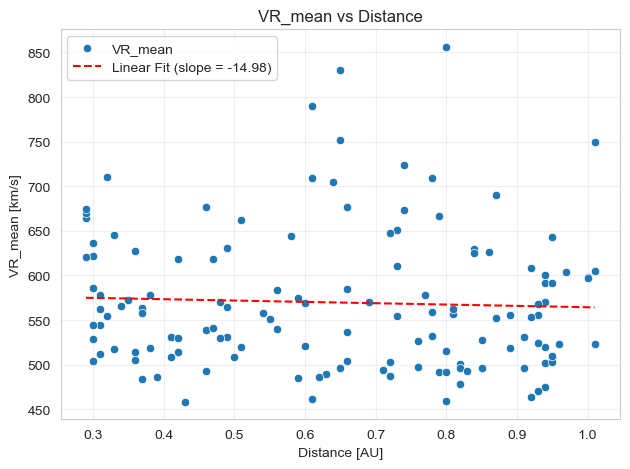

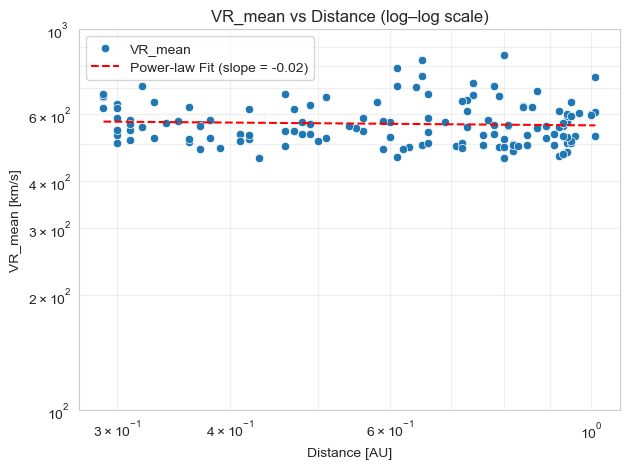

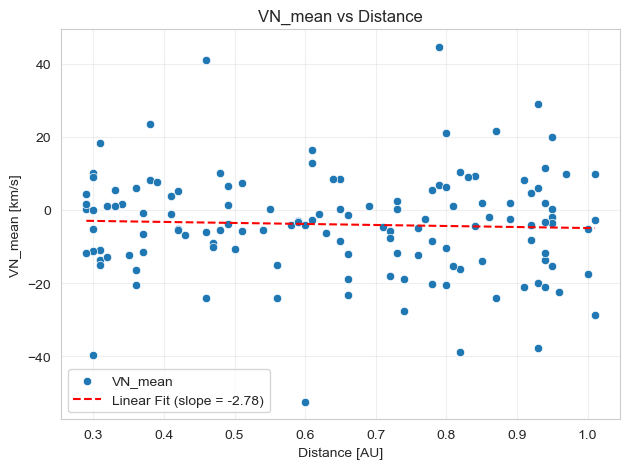

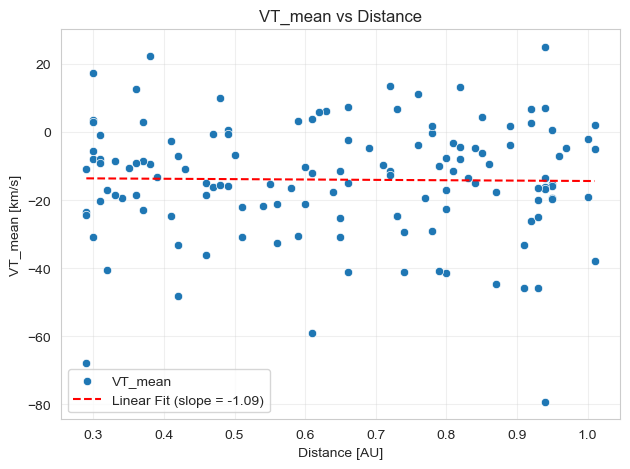

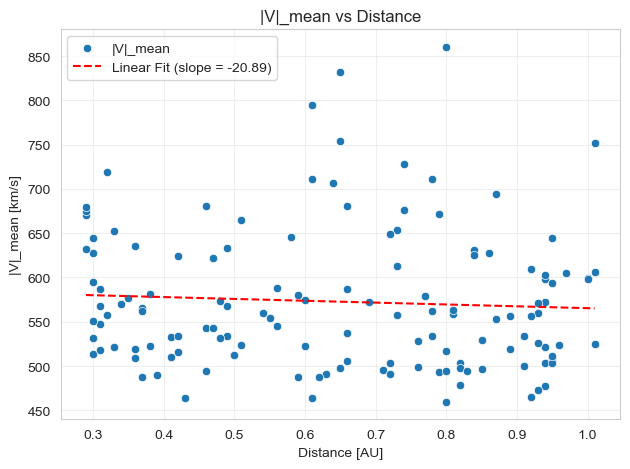

...

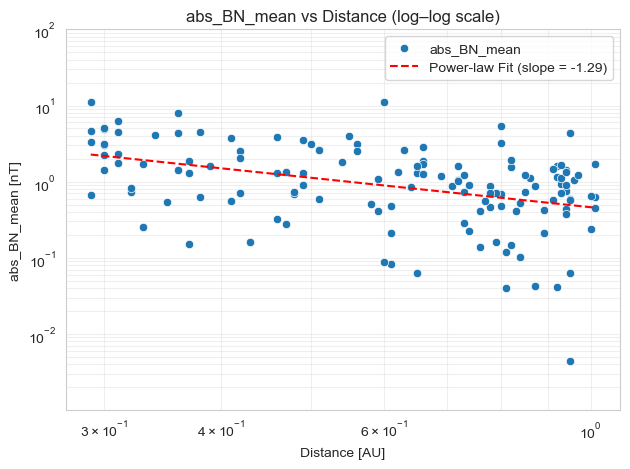

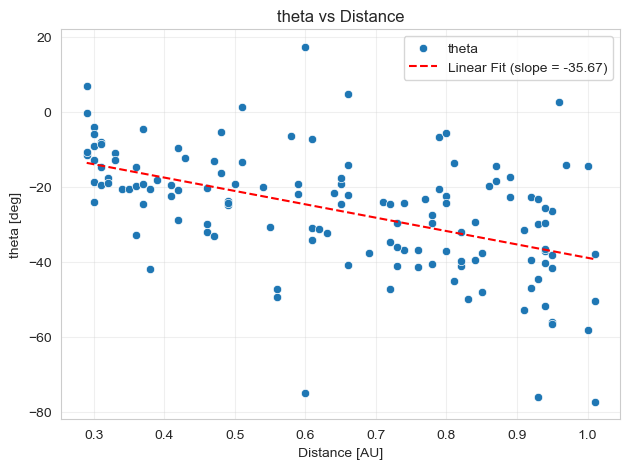

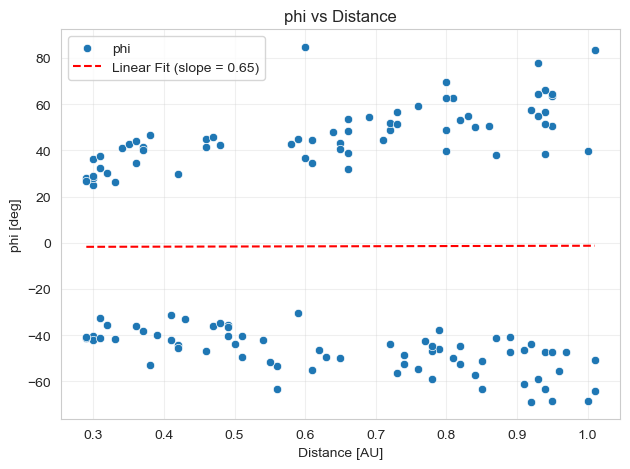

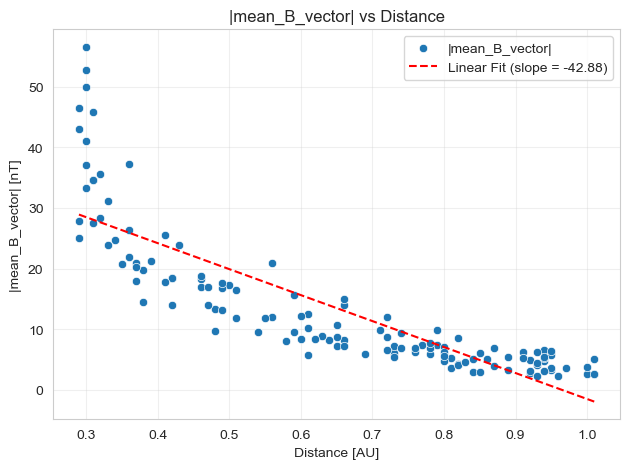

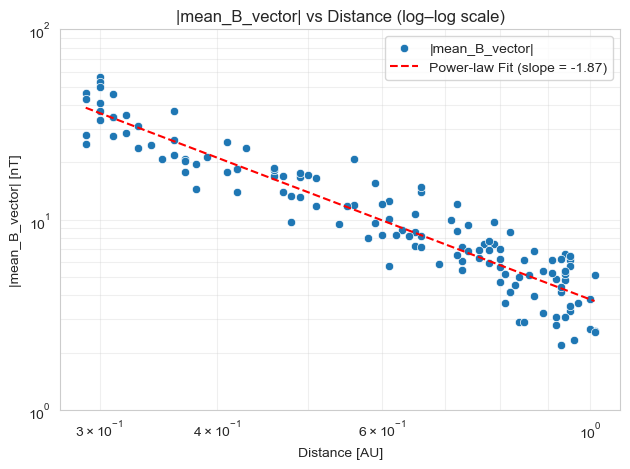

In [237]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import linregress

# ----------------------------------------------------
# Angles + |B|
# ----------------------------------------------------
mean_values_df['theta'] = np.degrees(
    np.arctan(mean_values_df['BT_mean'] / mean_values_df['BR_mean'])
)

mean_values_df['phi'] = np.degrees(
    np.arctan(mean_values_df['|B_transv|_mean'] / mean_values_df['BR_mean'])
)

mean_values_df['|mean_B_vector|'] = np.linalg.norm(
    mean_values_df[['BR_mean', 'BT_mean', 'BN_mean']], axis=1
)

# ----------------------------------------------------
# Units
# ----------------------------------------------------
UNITS = {
    'VR_mean': 'km/s', 'VN_mean': 'km/s', 'VT_mean': 'km/s', '|V|_mean': 'km/s',
    'N_mean': r'cm$^{-3}$',
    'Distance_mean': 'AU',
    'mass_flux_mean': 'kg/s',

    'T_mean': 'K','T_R_mean': 'K', 'T_T_mean': 'K', 'T_N_mean': 'K',
    'T_RR_mean': 'K', 'T_RT_mean': 'K', 'T_RN_mean': 'K',
    'T_TT_mean': 'K', 'T_TN_mean': 'K', 'T_NN_mean': 'K',

    'P_RR_mean': 'J/cm$^{3}$',
    'P_RT_mean': 'J/cm$^{3}$',
    'P_RN_mean': 'J/cm$^{3}$',
    'P_TT_mean': 'J/cm$^{3}$',
    'P_TN_mean': 'J/cm$^{3}$',
    'P_NN_mean': 'J/cm$^{3}$',

    'P_RR_nPa_mean': 'nPa',
    'P_RT_nPa_mean': 'nPa',
    'P_RN_nPa_mean': 'nPa',
    'P_TT_nPa_mean': 'nPa',
    'P_TN_nPa_mean': 'nPa',
    'P_NN_nPa_mean': 'nPa',

    'BR_mean': 'nT', 'BT_mean': 'nT', 'BN_mean': 'nT',
    '|B|_mean': 'nT', '|B_transv|_mean': 'nT',
    'abs_BR_mean': 'nT', 'abs_BT_mean': 'nT', 'abs_BN_mean': 'nT',
    '|mean_B_vector|': 'nT',

    'theta': 'deg',
    'phi': 'deg',
}

# ----------------------------------------------------
# Main plotting function
# ----------------------------------------------------
def redo_data_plots(df):

    skip_log_plots = ['VN_mean', 'VT_mean', 'BR_mean',
                      'BT_mean', 'BN_mean', 'theta', 'phi']

    columns = [c for c in df.columns if c != 'Distance_mean']

    for col in columns:

        x = df['Distance_mean'].values
        y = df[col].values

        # =========================================================
        # 1) LINEAR PLOT
        # =========================================================
        mask_lin = np.isfinite(x) & np.isfinite(y)
        if mask_lin.sum() < 2:
            print(f"Skipping linear plot for {col} due to insufficient data.")
            continue

        x_lin = x[mask_lin]
        y_lin = y[mask_lin]

        slope_lin, intercept_lin, _, _, _ = linregress(x_lin, y_lin)

        x_fit_lin = np.linspace(x_lin.min(), x_lin.max(), 200)
        y_fit_lin = slope_lin * x_fit_lin + intercept_lin

        plt.figure()
        sns.scatterplot(x=x_lin, y=y_lin, label=col)
        plt.plot(x_fit_lin, y_fit_lin, 'r--',
                 label=f'Linear Fit (slope = {slope_lin:.2f})')

        plt.title(f'{col} vs Distance')
        plt.xlabel(f"Distance [{UNITS['Distance_mean']}]")
        plt.ylabel(f"{col} [{UNITS.get(col, '')}]")
        plt.grid(True, which='both', alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.show()

        # =========================================================
        # 2) LOG–LOG PLOT
        # =========================================================
        if col in skip_log_plots:
            continue


        mask_log = (x > 0) & (y > 0) & np.isfinite(x) & np.isfinite(y)
        if mask_log.sum() < 2:
            continue

        x_log = x[mask_log]
        y_log = y[mask_log]

        logx = np.log10(x_log)
        logy = np.log10(y_log)

        slope_pow, intercept_pow, _, _, _ = linregress(logx, logy)

        x_fit_log = np.logspace(np.log10(x_log.min()),
                                np.log10(x_log.max()), 200)
        y_fit_log = 10**intercept_pow * x_fit_log**slope_pow

        plt.figure()
        sns.scatterplot(x=x_log, y=y_log, label=col)
        plt.plot(x_fit_log, y_fit_log, 'r--',
                 label=f'Power-law Fit (slope = {slope_pow:.2f})')

        plt.xscale('log')
        plt.yscale('log')

        # FORCE PRETTY Y-AXIS RANGE (≥ 3 ROUND LOG NUMBERS)
        ymin = y_log.min()
        ymax = y_log.max()

        log_ymin = np.floor(np.log10(ymin))
        log_ymax = np.ceil(np.log10(ymax))

        # Expand if less than 2 digits
        if (log_ymax - log_ymin) < 1:
            log_ymid = 0.5 * (log_ymin + log_ymax)
            log_ymin = np.floor(log_ymid - 1)
            log_ymax = np.ceil(log_ymid + 1)

        plt.ylim(10**log_ymin, 10**log_ymax)

        plt.title(f'{col} vs Distance (log–log scale)')
        plt.xlabel(f"Distance [{UNITS['Distance_mean']}]")
        plt.ylabel(f"{col} [{UNITS.get(col, '')}]")
        plt.grid(True, which='both', alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.show()

# ----------------------------------------------------
# Run it
# ----------------------------------------------------
redo_data_plots(mean_values_df)


In [238]:
mean_values_df

,VR_mean,VN_mean,VT_mean,|V|_mean,N_mean,Distance_mean,mass_flux_mean,T_R_mean,T_T_mean,T_N_mean,T_mean,P_RR_mean,P_RT_mean,P_RN_mean,P_TT_mean,P_TN_mean,P_NN_mean,P_RR_nPa_mean,P_RT_nPa_mean,P_RN_nPa_mean,P_TT_nPa_mean,P_TN_nPa_mean,P_NN_nPa_mean,T_RR_mean,T_RT_mean,T_RN_mean,T_TT_mean,T_TN_mean,T_NN_mean,BR_mean,BT_mean,BN_mean,|B|_mean,|B_transv|_mean,abs_BR_mean,abs_BT_mean,abs_BN_mean,theta,phi,|mean_B_vector|
name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Date_Range1,496.116516,-8.610609,-30.829149,498.375977,20.537035,0.65,1.603998e+08,257520.092613,247265.501825,248000.564108,250928.719429,7.637191e-17,-2.634947e-18,2.893411e-19,7.263337e-17,1.410537e-18,7.194673e-17,0.076372,-0.002635,0.000289,0.072633,0.001411,0.071947,257644.875000,-6109.813965,531.442688,247385.296875,2772.211914,248120.703125,-6.752596,2.362416,1.315146,11.299715,7.982371,6.752596,2.362416,1.315146,-19.282539,-49.770828,7.273800
Date_Range10,536.230225,-18.924515,-15.096873,537.689575,8.857089,0.66,7.779941e+07,197220.701377,230159.770422,226642.377378,218007.616344,2.485079e-17,4.462695e-19,1.297913e-18,2.865244e-17,2.599186e-19,2.828052e-17,0.024851,0.000446,0.001298,0.028652,0.000260,0.028281,197316.250000,4139.970215,11054.771484,230271.296875,2219.331299,226752.203125,7.774230,-1.968433,-1.850190,9.802388,4.870840,7.774230,1.968433,1.850190,-14.208655,32.068649,8.230224
Date_Range100,643.526001,-1.960100,-15.400931,644.386169,4.383032,0.95,9.541181e+07,211791.157157,247038.536489,235469.863339,231433.185690,1.282320e-17,-2.379211e-19,8.392936e-20,1.495811e-17,1.980159e-19,1.427478e-17,0.012823,-0.000238,0.000084,0.014958,0.000198,0.014275,211893.765625,-4250.473633,1571.303833,247158.234375,3069.940430,235583.953125,2.977524,-1.478319,0.062605,5.149031,3.609801,2.977524,1.478319,0.062605,-26.404066,50.482670,3.324905
Date_Range101,506.569641,0.149152,-19.299078,507.894104,9.482888,0.95,1.629433e+08,184794.037356,210169.856613,194056.690861,196340.194942,2.607250e-17,-1.392702e-18,4.122819e-19,2.958033e-17,2.004292e-19,2.758408e-17,0.026073,-0.001393,0.000412,0.029580,0.000200,0.027584,184883.562500,-12424.969727,2212.691650,210271.687500,2028.375977,194150.718750,3.431523,-5.097324,-0.004434,8.165782,6.861506,3.431523,5.097324,0.004434,-56.051521,63.429806,6.144761
Date_Range102,556.190063,-19.915075,-45.952396,559.844177,6.555274,0.93,1.188903e+08,232254.421569,254058.978065,217370.895149,234561.431605,2.190439e-17,-2.426981e-19,1.640350e-19,2.370142e-17,-3.137719e-19,2.030148e-17,0.021904,-0.000243,0.000164,0.023701,-0.000314,0.020301,232366.937500,-3207.817383,2434.669189,254182.078125,-3978.915039,217476.203125,-3.501194,2.009113,0.944730,7.240846,5.784932,3.501194,2.009113,0.944730,-29.848782,-58.816559,4.145770
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Date_Range95,492.456177,-5.913337,-36.187111,494.903259,35.407501,0.46,1.388447e+08,397797.773686,353480.100780,313034.189417,354770.687887,1.940282e-16,-1.163947e-17,4.965428e-18,1.727405e-16,4.817775e-18,1.528760e-16,0.194028,-0.011639,0.004965,0.172740,0.004818,0.152876,397990.500000,-23975.404297,11169.344727,353651.343750,9378.922852,313185.843750,16.219503,-9.363791,1.298169,22.605946,14.243398,16.219503,9.363791,1.298169,-29.998554,41.288464,18.773335
Date_Range96,574.481750,-3.321916,-30.560373,580.577637,3.463761,0.59,2.621825e+07,175055.959813,334242.963195,284018.205562,264439.042878,8.489281e-18,2.867310e-18,9.552044e-19,1.621568e-17,-8.836068e-20,1.370587e-17,0.008489,0.002867,0.000955,0.016216,-0.000088,0.013706,175140.781250,58652.027344,14810.755859,334404.906250,629.221313,284155.812500,-14.476784,5.863312,0.416833,17.220404,8.537735,14.476784,5.863312,0.416833,-22.048676,-30.530128,15.624642
Date_Range97,470.783844,29.039148,-25.061211,473.194489,11.019399,0.93,1.697102e+08,164877.236717,207579.724738,162047.543214,178168.168231,2.640306e-17,-6.280286e-

In [239]:
#merge sw_df_extra and MAG_df with mean_values_df respectively as we need all together to calculate deltas
SWA_df_wmean = pd.merge(SWA_df.reset_index(), mean_values_df[['|V|_mean','VR_mean','VN_mean','VT_mean','N_mean','T_R_mean','T_T_mean','T_N_mean','T_mean','T_RR_mean','T_RT_mean','T_RN_mean','T_TT_mean','T_TN_mean','T_NN_mean']].reset_index(), on='name', how='left')

MAG_df_wmean = pd.merge(MAG_df.reset_index(), mean_values_df[['|B|_mean', 'BR_mean', 'BT_mean', 'BN_mean','|B_transv|_mean','|mean_B_vector|','Distance_mean']].reset_index(), on='name', how='left')
SWA_df_wmean

,Epoch,VR,VT,VN,N,T_R,T_T,T_N,T,P_RR,P_TT,P_NN,P_RT,P_RN,P_TN,Distance,name,T_RR,T_RT,T_RN,T_TT,T_TN,T_NN,P_RR_nPa,P_RT_nPa,P_RN_nPa,P_TT_nPa,P_TN_nPa,P_NN_nPa,|V|,mass_flux,|V|_mean,VR_mean,VN_mean,VT_mean,N_mean,T_R_mean,T_T_mean,T_N_mean,T_mean,T_RR_mean,T_RT_mean,T_RN_mean,T_TT_mean,T_TN_mean,T_NN_mean
0,2021-08-21 00:08:01.118751,437.473389,-26.718201,6.084368,26.741230,371061.218305,387029.028698,281682.671218,346590.950606,1.369987e-16,1.428941e-16,1.039994e-16,-3.057749e-17,6.547376e-18,3.094860e-18,0.65,Date_Range1,371241.000000,-82859.328125,17742.173828,387216.50000,8386.495117,281819.15625,0.136999,-0.030577,0.006547,0.142894,0.003095,0.103999,438.330750,1.853782e+08,498.375977,496.116516,-8.610609,-30.829149,20.537035,257520.092613,247265.501825,248000.564108,250928.719429,257644.87500,-6109.813965,531.442688,247385.296875,2772.211914,248120.703125
1,2021-08-21 00:08:05.118758,439.720306,-22.816080,3.323184,26.076748,334987.251559,390647.915060,283368.031971,336334.406908,1.206066e-16,1.406463e-16,1.020220e-16,-2.247051e-17,3.485177e-18,3.781086e-18,0.65,Date_Range1,335149.531250,-62442.511719,9684.837891,390837.12500,10507.128906,283505.31250,0.120607,-0.022471,0.003485,0.140646,0.003781,0.102022,440.324402,1.815940e+08,498.375977,496.116516,-8.610609,-30.829149,20.537035,257520.092613,247265.501825,248000.564108,250928.719429,257644.87500,-6109.813965,531.442688,247385.296875,2772.211914,248120.703125
2,2021-08-21 00:08:09.118765,432.573883,-27.319345,2.573995,25.579350,392441.953073,395567.874071,276858.795299,354956.200103,1.385972e-16,1.397011e-16,9.777712e-17,-3.160848e-17,7.177762e-18,1.653420e-18,0.65,Date_Range1,392632.093750,-89543.695312,20333.890625,395759.50000,4683.975586,276992.90625,0.138597,-0.031608,0.007178,0.139701,0.001653,0.097777,433.443359,1.753465e+08,498.375977,496.116516,-8.610609,-30.829149,20.537035,257520.092613,247265.501825,248000.564108,250928.719429,257644.87500,-6109.813965,531.442688,247385.296875,2772.211914,248120.703125
3,2021-08-21 00:08:13.118772,436.548035,-27.892700,1.240144,25.094852,378040.467526,398981.668072,279699.278019,352240.463828,1.309822e-16,1.382379e-16,9.690929e-17,-3.178418e-17,8.530045e-18,4.017915e-19,0.65,Date_Range1,378223.625000,-91779.835938,24631.314453,399175.00000,1160.210938,279834.75000,0.130982,-0.031784,0.008530,0.138238,0.000402,0.096909,437.439972,1.736115e+08,498.375977,496.116516,-8.610609,-30.829149,20.537035,257520.092613,247265.501825,248000.564108,250928.719429,257644.87500,-6109.813965,531.442688,247385.296875,2772.211914,248120.703125
4,2021-08-21 00:08:17.118779,437.345337,-25.834433,1.337073,26.132803,378733.257392,407162.033424,291730.404066,359208.579717,1.366498e-16,1.469071e-16,1.052585e-16,-3.267473e-17,1.265891e-17,-4.567090e-18,0.65,Date_Range1,378916.750000,-90603.898438,35101.953125,407359.31250,-12664.104492,291871.75000,0.136650,-0.032675,0.012659,0.146907,-0.004567,0.105258,438.109741,1.810690e+08,498.375977,496.116516,-8.610609,-30.829149,20.537035,257520.092613,247265.501825,248000.564108,250928.719429,257644.87500,-6109.813965,531.442688,247385.296875,2772.211914,248120.703125
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3167022,2025-05-14 23:59:54.729239,637.353821,-11.448981,37.776844,10.946076,259095.198317,282348.081497,298255.842724,279899.700135,3.915681e-17,4.267099e-17,4.507512e-17,2.956777e-18,5.448101e-18,4.790137e-19,0.74,Date_Range134,259220.718750,19574.064453,36066.792969,282484.84375,3171.103027,298400.31250,0.039157,0.002957,0.005448,0.042671,0.000479,0.045075,638.575073,1.432790e+08,676.099243,673.243225,-18.827131,-29.493057,11.638987,374687.370151,354265.263013,396925.902852,375292.845380,374868.90625,14743.368164,9422.628906,354436.906250,6557.079590,397118.187500
3167023,2025-05-14 23:59:55.729241,631.091003,-19.316486,34.539440,10.697098,268227.297582,29821

In [240]:
MAG_df_wmean

,EPOCH,BR,BT,BN,Distance,name,|B|,|B_transv|,|B|_mean,BR_mean,BT_mean,BN_mean,|B_transv|_mean,|mean_B_vector|,Distance_mean
0,2021-08-21 00:08:29.999999776,-13.179045,14.118096,0.086142,0.65,Date_Range1,19.313604,14.118360,11.299715,-6.752596,2.362416,1.315146,7.982371,7.273800,0.65
1,2021-08-21 00:09:29.999996200,-13.549139,13.454594,1.530531,0.65,Date_Range1,19.155882,13.541368,11.299715,-6.752596,2.362416,1.315146,7.982371,7.273800,0.65
2,2021-08-21 00:10:30.000002682,-14.307286,13.455720,2.443442,0.65,Date_Range1,19.792049,13.675775,11.299715,-6.752596,2.362416,1.315146,7.982371,7.273800,0.65
3,2021-08-21 00:11:29.999999105,-12.954463,10.547703,9.633520,0.65,Date_Range1,19.284109,14.284913,11.299715,-6.752596,2.362416,1.315146,7.982371,7.273800,0.65
4,2021-08-21 00:12:29.999995529,-14.416012,9.818862,8.968830,0.65,Date_Range1,19.613041,13.298494,11.299715,-6.752596,2.362416,1.315146,7.982371,7.273800,0.65
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
111912,2025-05-14 23:55:29.999995976,-7.750103,5.254740,6.910071,0.74,Date_Range134,11.637245,8.681093,13.482927,-7.522831,5.636755,-0.227423,9.756806,9.403069,0.74
111913,2025-05-14 23:56:30.000002458,-8.614252,5.152640,6.119097,0.74,Date_Range134,11.755781,7.999566,13.482927,-7.522831,5.636755,-0.227423,9.756806,9.403069,0.74
111914,2025-05-14 23:57:29.999998882,-9.546777,3.361250,6.075851,0.74,Date_Range134,11.804869,6.943628,13.482927,-7.522831,5.636755,-0.227423,9.756806,9.403069,0.74
111915,2025-05-14 23:58:29.999995306,-8.314919,3.223910,7.852269,0.74,Date_Range134,11.882322,8.488329,13.482927,-7.522831,5.636755,-0.227423,9.756806,9.403069,0.74


In [241]:
MAG_df_wmean['B0_vector'] = MAG_df_wmean.apply(lambda row: np.array([row['BR_mean'], row['BT_mean'], row['BN_mean']]),axis=1) #Vector of B_0

MAG_df_wmean['B_0_unit_vector']=MAG_df_wmean['B0_vector']/MAG_df_wmean['|mean_B_vector|'] #remember mean_B_vector is B0_vector


MAG_df_wmean['B_vector'] = MAG_df_wmean.apply(lambda row: np.array([row['BR'], row['BT'], row['BN']]),axis=1) #B_total vector

MAG_df_wmean['B_//_0'] = MAG_df_wmean.apply(lambda row: np.dot(row['B_vector'], row['B_0_unit_vector']),axis=1) #scalar B_//_0

MAG_df_wmean['dot_product_check'] = MAG_df_wmean.apply(
    lambda row: (row['B_vector'][0] * row['B_0_unit_vector'][0] +row['B_vector'][1] * row['B_0_unit_vector'][1] +row['B_vector'][2] * row['B_0_unit_vector'][2]),axis=1)

MAG_df_wmean['B_//_0_vector'] = MAG_df_wmean.apply(lambda row: row['B_//_0'] * row['B_0_unit_vector'],axis=1) #vector B_//_0

MAG_df_wmean['B_perp_0_vector'] = (MAG_df_wmean['B_vector'] - MAG_df_wmean['B_//_0_vector']) #vector B_perp_0_


MAG_df_wmean['|B_perp_0|'] = MAG_df_wmean['B_perp_0_vector'].apply(np.linalg.norm) #magnitude of B_perp_0



MAG_df_wmean['B_parallel_0_mean'] = (MAG_df_wmean.groupby('name')['B_//_0'].transform('mean')) #scalar mean B_//_0
MAG_df_wmean['|B_perp_0|_mean'] = (MAG_df_wmean.groupby('name')['|B_perp_0|'].transform('mean')) #mean magnitude of B_perp_0



# Angle between the background magnetic field B0 and the radial direction,
# computed using |BR| so the angle is independent of field polarity
# independent of whether the field points outward or inward


MAG_df_wmean['cos_theta_PS'] = (MAG_df_wmean['BR_mean'].abs() / MAG_df_wmean['|mean_B_vector|'])

# numerical safety
#cos_theta = cos_theta_axis.clip(-1, 1)

MAG_df_wmean['theta_PS_observed'] = np.degrees(np.arccos(MAG_df_wmean['cos_theta_PS']))



# Angle between the background magnetic field B0 and the tangential direction,
# computed using |BT_mean| so the angle is independent of polarity
MAG_df_wmean['phi_PS'] = 90 - MAG_df_wmean['theta_PS_observed']


MAG_df_wmean['theta_PS_theory']= np.degrees(np.arctan(MAG_df_wmean['Distance_mean']*AU_M*2.865e-6/ (400*KM_TO_M))) #Parker spiral angle theory
print(AU_M)
MAG_df_wmean

149597870700.0


,EPOCH,BR,BT,BN,Distance,name,|B|,|B_transv|,|B|_mean,BR_mean,BT_mean,BN_mean,|B_transv|_mean,|mean_B_vector|,Distance_mean,B0_vector,B_0_unit_vector,B_vector,B_//_0,dot_product_check,B_//_0_vector,B_perp_0_vector,|B_perp_0|,B_parallel_0_mean,|B_perp_0|_mean,cos_theta_PS,theta_PS_observed,phi_PS,theta_PS_theory
0,2021-08-21 00:08:29.999999776,-13.179045,14.118096,0.086142,0.65,Date_Range1,19.313604,14.118360,11.299715,-6.752596,2.362416,1.315146,7.982371,7.273800,0.65,"[-6.752595901489258, 2.3624157905578613, 1.315...","[-0.9283449579511042, 0.3247842488641701, 0.18...","[-13.179044723510742, 14.118096351623535, 0.08...",16.835610,16.835610,"[-15.62925366409893, 5.467940950317855, 3.0439...","[2.4502089405881886, 8.65015540130568, -2.9578...",9.464539,7.27380,7.158425,0.928345,21.821720,68.178284,34.856115
1,2021-08-21 00:09:29.999996200,-13.549139,13.454594,1.530531,0.65,Date_Range1,19.155882,13.541368,11.299715,-6.752596,2.362416,1.315146,7.982371,7.273800,0.65,"[-6.752595901489258, 2.3624157905578613, 1.315...","[-0.9283449579511042, 0.3247842488641701, 0.18...","[-13.549139022827148, 13.454593658447266, 1.53...",17.224844,17.224844,"[-15.990597184534618, 5.594358057301077, 3.114...","[2.4414581617074695, 7.860235601146188, -1.583...",8.381677,7.27380,7.158425,0.928345,21.821720,68.178284,34.856115
2,2021-08-21 00:10:30.000002682,-14.307286,13.455720,2.443442,0.65,Date_Range1,19.792049,13.675775,11.299715,-6.752596,2.362416,1.315146,7.982371,7.273800,0.65,"[-6.752595901489258, 2.3624157905578613, 1.315...","[-0.9283449579511042, 0.3247842488641701, 0.18...","[-14.307286262512207, 13.455719947814941, 2.44...",18.094092,18.094092,"[-16.79755886732782, 5.8766760057785445, 3.271...","[2.490272604815612, 7.579043942036397, -0.8280...",8.020541,7.27380,7.158425,0.928345,21.821720,68.178284,34.856115
3,2021-08-21 00:11:29.999999105,-12.954463,10.547703,9.633520,0.65,Date_Range1,19.284109,14.284913,11.299715,-6.752596,2.362416,1.315146,7.982371,7.273800,0.65,"[-6.752595901489258, 2.3624157905578613, 1.315...","[-0.9283449579511042, 0.3247842488641701, 0.18...","[-12.954463005065918, 10.54770278930664, 9.633...",17.193736,17.193736,"[-15.961717664452364, 5.584254471174888, 3.108...","[3.0072546593864455, 4.963448318131753, 6.5247...",8.732256,7.27380,7.158425,0.928345,21.821720,68.178284,34.856115
4,2021-08-21 00:12:29.999995529,-14.416012,9.818862,8.968830,0.65,Date_Range1,19.613041,13.298494,11.299715,-6.752596,2.362416,1.315146,7.982371,7.273800,0.65,"[-6.752595901489258, 2.3624157905578613, 1.315...","[-0.9283449579511042, 0.3247842488641701, 0.18...","[-14.416011810302734, 9.818861961364746, 8.968...",18.193661,18.193661,"[-16.889993516793787, 5.909014543235662, 3.289...","[2.4739817064910525, 3.9098474181290843, 5.679...",7.325438,7.27380,7.158425,0.928345,21.821720,68.178284,34.856115
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
111912,2025-05-14 23:55:29.999995976,-7.750103,5.254740,6.910071,0.74,Date_Range134,11.637245,8.681093,13.482927,-7.522831,5.636755,-0.227423,9.756806,9.403069,0.74,"[-7.522831439971924, 5.636754512786865, -0.227...","[-0.8000399702510175, 0.5994589867799992, -0.0...","[-7.75010347366333, 5.254739761352539, 6.91007...",9.183267,9.183267,"[-7.346980332747612, 5.504991687827316, -0.222...","[-0.4031231409157181, -0.25025192647477734, 7....",7.147943,9.40307,8.340053,0.800040,36.866081,53.133919,38.411114
111913,2025-05-14 23:56:30.000002458,-8.614252,5.152640,6.119097,0.74,Date_Range134,11.755781,7.999566,13.482927,-7.522831,5.636755,-0.227423,9.756806,9.403069,0.74,"[-7.522831439971924, 5.636754512786865, -0.227...","[-0.8000399702510175, 0.5994589867799992, -0.0...","[-8.614252090454102, 5.152640342712402, 6.1190...",9.832546,9.832546,"[-7.866429887575164, 5.894208121254444, -0.237...","[-0.7478222028789379, -0.7415677785420414, 6.3...",6.443557,9.40307,8.340053,0.800040,36.866081,53.133919,38.411114
111914,2025-05-14 23:57:29.

# Parker Spiral Angles

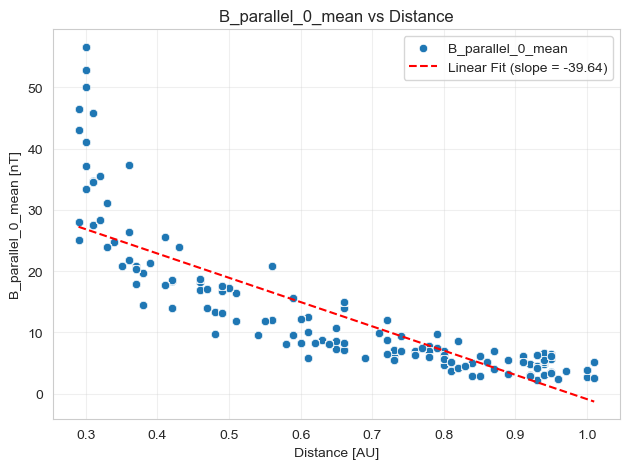

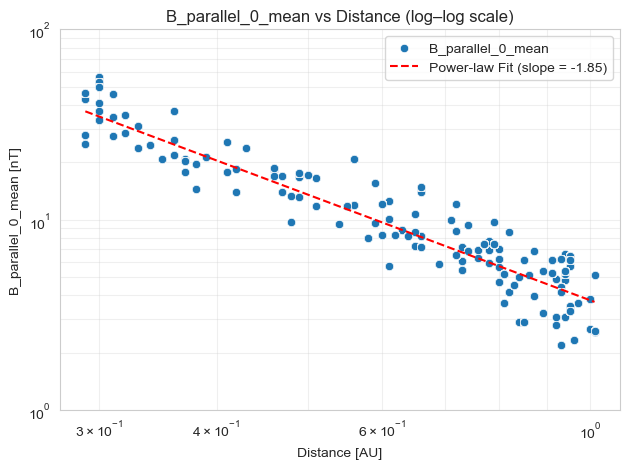

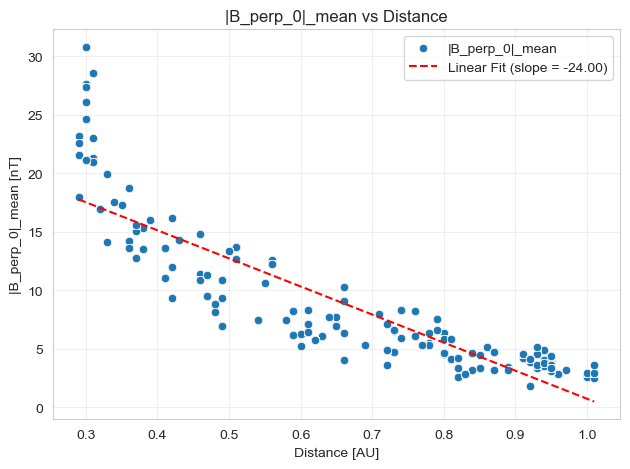

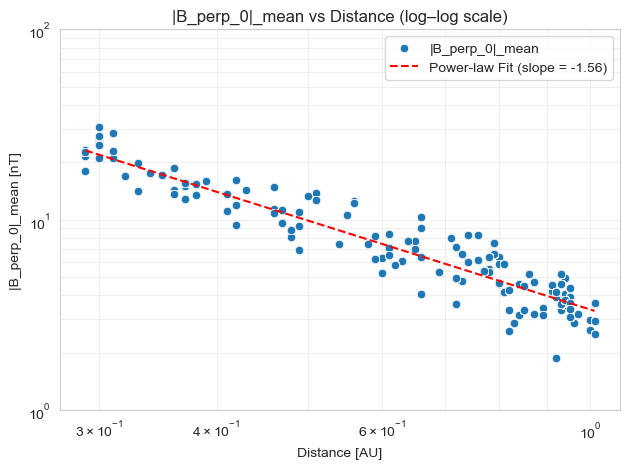

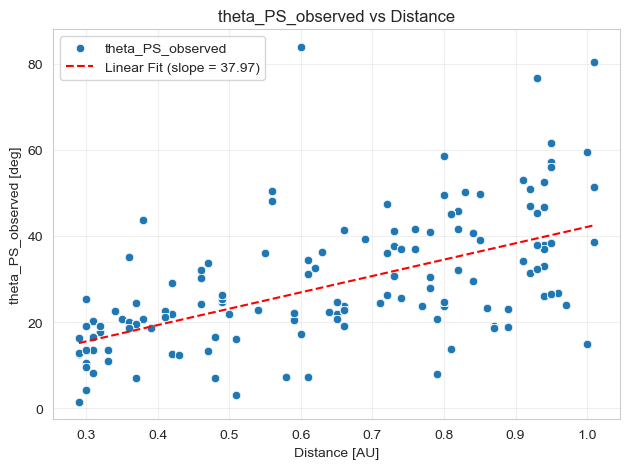

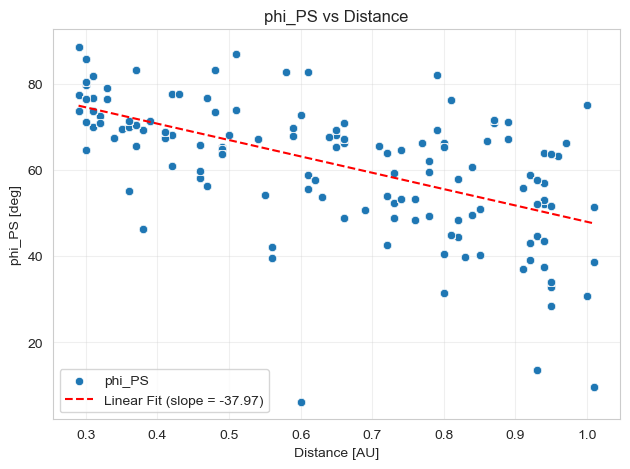

In [242]:
#  Radial Scalling of B_PARALLEL_0_mean AND |B_PERP_0|_mean and Parker Spiral Angles

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import linregress


UNITS = {'Distance_mean': 'AU','B_parallel_0_mean': 'nT', '|B_perp_0|_mean': 'nT','theta_PS_observed': 'deg','phi_PS': 'deg'}

# ----------------------------------------------------
# Main plotting function
# ----------------------------------------------------
def redo_data_plots(df):

        columns = ['B_parallel_0_mean','|B_perp_0|_mean','theta_PS_observed','phi_PS']
        skip_log_plots = ['theta_PS_observed', 'phi_PS']

        for col in columns:

            x = df['Distance_mean'].values
            y = df[col].values

            # =========================================================
            # 1) LINEAR PLOT
            # =========================================================
            mask_lin = np.isfinite(x) & np.isfinite(y)
            if mask_lin.sum() < 2:
                continue

            x_lin = x[mask_lin]
            y_lin = y[mask_lin]

            slope_lin, intercept_lin, _, _, _ = linregress(x_lin, y_lin)

            x_fit_lin = np.linspace(x_lin.min(), x_lin.max(), 200)
            y_fit_lin = slope_lin * x_fit_lin + intercept_lin

            plt.figure()
            sns.scatterplot(x=x_lin, y=y_lin, label=col)
            plt.plot(x_fit_lin, y_fit_lin, 'r--',
                     label=f'Linear Fit (slope = {slope_lin:.2f})')

            plt.title(f'{col} vs Distance')
            plt.xlabel(f"Distance [{UNITS['Distance_mean']}]")
            plt.ylabel(f"{col} [{UNITS.get(col, '')}]")
            plt.grid(True, which='both', alpha=0.3)
            plt.legend()
            plt.tight_layout()
            plt.show()

            # =========================================================
            # 2) LOG–LOG PLOT
            # =========================================================
            if col in skip_log_plots:
                continue

            mask_log = (x > 0) & (y > 0) & np.isfinite(x) & np.isfinite(y)
            if mask_log.sum() < 2:
                continue

            x_log = x[mask_log]
            y_log = y[mask_log]

            logx = np.log10(x_log)
            logy = np.log10(y_log)

            slope_pow, intercept_pow, _, _, _ = linregress(logx, logy)

            x_fit_log = np.logspace(np.log10(x_log.min()),
                                    np.log10(x_log.max()), 200)
            y_fit_log = 10**intercept_pow * x_fit_log**slope_pow

            plt.figure()
            sns.scatterplot(x=x_log, y=y_log, label=col)
            plt.plot(x_fit_log, y_fit_log, 'r--',
                     label=f'Power-law Fit (slope = {slope_pow:.2f})')

            plt.xscale('log')
            plt.yscale('log')

            # FORCE PRETTY Y-AXIS RANGE (≥ 3 ROUND LOG NUMBERS)
            ymin = y_log.min()
            ymax = y_log.max()

            log_ymin = np.floor(np.log10(ymin))
            log_ymax = np.ceil(np.log10(ymax))

            # Expand if less than 2 decades
            if (log_ymax - log_ymin) < 1:
                log_ymid = 0.5 * (log_ymin + log_ymax)
                log_ymin = np.floor(log_ymid - 1)
                log_ymax = np.ceil(log_ymid + 1)

            plt.ylim(10**log_ymin, 10**log_ymax)

            plt.title(f'{col} vs Distance (log–log scale)')
            plt.xlabel(f"Distance [{UNITS['Distance_mean']}]")
            plt.ylabel(f"{col} [{UNITS.get(col, '')}]")
            plt.grid(True, which='both', alpha=0.3)
            plt.legend()
            plt.tight_layout()
            plt.show()

# ----------------------------------------------------
# Run it
 # ----------------------------------------------------
redo_data_plots(MAG_df_wmean)


# Calculate deltas 

In [243]:
SWA_df_wmean['delta_|V|'] = SWA_df_wmean['|V|'] - SWA_df_wmean['|V|_mean']
SWA_df_wmean['delta_VR'] = SWA_df_wmean['VR'] - SWA_df_wmean['VR_mean']
SWA_df_wmean['delta_VN'] = SWA_df_wmean['VN'] - SWA_df_wmean['VN_mean']
SWA_df_wmean['delta_VT'] = SWA_df_wmean['VT'] - SWA_df_wmean['VT_mean']
SWA_df_wmean['delta_N'] = SWA_df_wmean['N'] - SWA_df_wmean['N_mean']
SWA_df_wmean['delta_T_R'] = SWA_df_wmean['T_R'] - SWA_df_wmean['T_R_mean']
SWA_df_wmean['delta_T_T'] = SWA_df_wmean['T_T'] - SWA_df_wmean['T_T_mean']
SWA_df_wmean['delta_T_N'] = SWA_df_wmean['T_N'] - SWA_df_wmean['T_N_mean']
SWA_df_wmean['delta_T'] = SWA_df_wmean['T'] - SWA_df_wmean['T_mean']

SWA_df_wmean['delta_T_RR'] = SWA_df_wmean['T_RR'] - SWA_df_wmean['T_RR_mean']
SWA_df_wmean['delta_T_RT'] = SWA_df_wmean['T_RT'] - SWA_df_wmean['T_RT_mean']
SWA_df_wmean['delta_T_RN'] = SWA_df_wmean['T_RN'] - SWA_df_wmean['T_RN_mean']
SWA_df_wmean['delta_T_TT'] = SWA_df_wmean['T_TT'] - SWA_df_wmean['T_TT_mean']
SWA_df_wmean['delta_T_TN'] = SWA_df_wmean['T_TN'] - SWA_df_wmean['T_TN_mean']
SWA_df_wmean['delta_T_NN'] = SWA_df_wmean['T_NN'] - SWA_df_wmean['T_NN_mean']


MAG_df_wmean['delta_|B|'] = MAG_df_wmean['|B|'] - MAG_df_wmean['|B|_mean'] #check if this needs RMS
MAG_df_wmean['delta_BR'] = MAG_df_wmean['BR'] - MAG_df_wmean['BR_mean']
MAG_df_wmean['delta_BT'] = MAG_df_wmean['BT'] - MAG_df_wmean['BT_mean']
MAG_df_wmean['delta_BN'] = MAG_df_wmean['BN'] - MAG_df_wmean['BN_mean']
MAG_df_wmean['delta_|B_transv|'] = MAG_df_wmean['|B_transv|'] -MAG_df_wmean['|B_transv|_mean']
MAG_df_wmean['delta_B_parallel_0'] = MAG_df_wmean['B_//_0'] - MAG_df_wmean['B_parallel_0_mean'] #potential issue here?
MAG_df_wmean['delta_|B_perp_0|'] = MAG_df_wmean['|B_perp_0|'] #- MAG_df_wmean['|B_perp_0|_mean'] #inconsistent here? check if this needs RMS\






MAG_df_wmean['squared_delta_BR'] = MAG_df_wmean['delta_BR'] ** 2
MAG_df_wmean['squared_delta_BT'] = MAG_df_wmean['delta_BT'] ** 2
MAG_df_wmean['squared_delta_BN'] = MAG_df_wmean['delta_BN'] ** 2
MAG_df_wmean['squared_delta_|B|'] = MAG_df_wmean['delta_|B|'] ** 2
MAG_df_wmean['squared_delta_|B_transv|'] = MAG_df_wmean['delta_|B_transv|'] ** 2
MAG_df_wmean['squared_delta_B_parallel_0'] = MAG_df_wmean['delta_B_parallel_0'] ** 2
MAG_df_wmean['squared_delta_|B_perp_0|'] = MAG_df_wmean['delta_|B_perp_0|'] ** 2 #not needed?
MAG_df_wmean['squared_|delta_B_vector|'] = MAG_df_wmean['delta_BR']**2 + MAG_df_wmean['delta_BT']**2 + MAG_df_wmean['delta_BN']**2


SWA_df_wmean['squared_delta_|V|'] = SWA_df_wmean['delta_|V|'] ** 2
SWA_df_wmean['squared_delta_VR'] = SWA_df_wmean['delta_VR'] ** 2
SWA_df_wmean['squared_delta_VN'] = SWA_df_wmean['delta_VN'] ** 2
SWA_df_wmean['squared_delta_VT'] = SWA_df_wmean['delta_VT'] ** 2
SWA_df_wmean['squared_delta_N'] = SWA_df_wmean['delta_N'] ** 2
SWA_df_wmean['squared_delta_T_R'] = SWA_df_wmean['delta_T_R'] ** 2
SWA_df_wmean['squared_delta_T_T'] = SWA_df_wmean['delta_T_T'] ** 2
SWA_df_wmean['squared_delta_T_N'] = SWA_df_wmean['delta_T_N'] ** 2
SWA_df_wmean['squared_delta_T'] = SWA_df_wmean['delta_T'] ** 2
SWA_df_wmean['squared_delta_T_RR'] = SWA_df_wmean['delta_T_RR'] ** 2
SWA_df_wmean['squared_delta_T_RT'] = SWA_df_wmean['delta_T_RT'] ** 2
SWA_df_wmean['squared_delta_T_RN'] = SWA_df_wmean['delta_T_RN'] ** 2
SWA_df_wmean['squared_delta_T_TT'] = SWA_df_wmean['delta_T_TT'] ** 2
SWA_df_wmean['squared_delta_T_TN'] = SWA_df_wmean['delta_T_TN'] ** 2
SWA_df_wmean['squared_delta_T_NN'] = SWA_df_wmean['delta_T_NN'] ** 2




SWA_delta_means = SWA_df_wmean.groupby('name')[['delta_|V|','delta_VR','delta_VN','delta_VT','delta_N', 'squared_delta_|V|','squared_delta_VR','squared_delta_VN','squared_delta_VT', 'squared_delta_N','delta_T_R','delta_T_T','delta_T_N','delta_T','delta_T_RR','delta_T_RT','delta_T_RN','delta_T_TT','delta_T_TN','delta_T_NN']].mean()
MAG_delta_means = MAG_df_wmean.groupby('name')[['delta_|B|', 'squared_delta_BR', 'squared_delta_BT', 'squared_delta_BN', 'squared_delta_|B|','delta_|B_transv|','squared_delta_|B_transv|','squared_delta_B_parallel_0','squared_delta_|B_perp_0|','squared_|delta_B_vector|']].mean()
#new dataframe
all_delta_means = pd.merge(SWA_delta_means, MAG_delta_means, on='name', how='left')
all_delta_means.rename(columns=lambda x: "mean_"+x, inplace=True)
#new columns
all_delta_means['root_mean_squared_delta_BR'] = np.sqrt(all_delta_means['mean_squared_delta_BR'])
all_delta_means['root_mean_squared_delta_BT'] = np.sqrt(all_delta_means['mean_squared_delta_BT'])
all_delta_means['root_mean_squared_delta_BN'] = np.sqrt(all_delta_means['mean_squared_delta_BN'])
all_delta_means['root_mean_squared_delta_N'] = np.sqrt(all_delta_means['mean_squared_delta_N'])
all_delta_means['root_mean_squared_delta_|V|'] = np.sqrt(all_delta_means['mean_squared_delta_|V|'])
all_delta_means['root_mean_squared_delta_VR'] = np.sqrt(all_delta_means['mean_squared_delta_VR'])
all_delta_means['root_mean_squared_delta_VN'] = np.sqrt(all_delta_means['mean_squared_delta_VN'])
all_delta_means['root_mean_squared_delta_VT'] = np.sqrt(all_delta_means['mean_squared_delta_VT'])
all_delta_means['root_mean_squared_delta_|B|'] = np.sqrt(all_delta_means['mean_squared_delta_|B|'])
all_delta_means['root_mean_squared_delta_|B_transv|'] = np.sqrt(all_delta_means['mean_squared_delta_|B_transv|'])
all_delta_means['root_mean_squared_delta_B_parallel_0'] = np.sqrt(all_delta_means['mean_squared_delta_B_parallel_0'])
all_delta_means['root_mean_squared_delta_|B_perp_0|'] = np.sqrt(all_delta_means['mean_squared_delta_|B_perp_0|'])
all_delta_means['root_mean_squared_|delta_B_vector|'] = np.sqrt(all_delta_means['mean_squared_|delta_B_vector|'])



all_delta_means['Distance'] = mean_values_df['Distance_mean']
all_delta_means

,mean_delta_|V|,mean_delta_VR,mean_delta_VN,mean_delta_VT,mean_delta_N,mean_squared_delta_|V|,mean_squared_delta_VR,mean_squared_delta_VN,mean_squared_delta_VT,mean_squared_delta_N,mean_delta_T_R,mean_delta_T_T,mean_delta_T_N,mean_delta_T,mean_delta_T_RR,mean_delta_T_RT,mean_delta_T_RN,mean_delta_T_TT,mean_delta_T_TN,mean_delta_T_NN,mean_delta_|B|,mean_squared_delta_BR,mean_squared_delta_BT,mean_squared_delta_BN,mean_squared_delta_|B|,mean_delta_|B_transv|,mean_squared_delta_|B_transv|,mean_squared_delta_B_parallel_0,mean_squared_delta_|B_perp_0|,mean_squared_|delta_B_vector|,root_mean_squared_delta_BR,root_mean_squared_delta_BT,root_mean_squared_delta_BN,root_mean_squared_delta_N,root_mean_squared_delta_|V|,root_mean_squared_delta_VR,root_mean_squared_delta_VN,root_mean_squared_delta_VT,root_mean_squared_delta_|B|,root_mean_squared_delta_|B_transv|,root_mean_squared_delta_B_parallel_0,root_mean_squared_delta_|B_perp_0|,root_mean_squared_|delta_B_vector|,Distance
name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Date_Range1,-8.303946e-07,0.000020,3.605661e-07,1.608171e-06,-3.935605e-07,616.675476,625.619080,474.038361,739.435059,30.827419,2.880329e-11,-8.983205e-12,2.060543e-11,-8.636601e-12,-0.014990,-0.000477,0.000014,0.003995,0.000246,0.016136,-2.769077e-07,17.421690,34.165417,30.573158,7.384876,1.897726e-07,8.330944,22.599514,59.560748,82.160263,4.173930,5.845119,5.529300,5.552245,24.832951,25.012379,21.772423,27.192554,2.717513,2.886338,4.753895,7.717561,9.064230,0.65
Date_Range10,-3.373274e-05,-0.000013,5.695149e-07,3.605758e-08,-7.939977e-07,321.545074,299.106598,362.564728,641.024780,1.850509,2.205241e-12,3.182507e-11,1.162845e-12,-2.077655e-11,0.003865,0.000089,-0.000172,-0.015339,-0.000050,-0.018574,-5.635348e-08,5.673463,15.169092,7.751904,0.244240,-1.762853e-07,6.493843,4.835356,23.759102,28.594458,2.381903,3.894752,2.784224,1.360334,17.931679,17.294699,19.041132,25.318468,0.494207,2.548302,2.198944,4.874331,5.347379,0.66
Date_Range100,-8.321940e-06,-0.000026,2.035644e-08,-3.873418e-07,-1.820069e-07,231.517776,233.037445,357.278839,508.014954,0.085725,2.735961e-11,-1.917014e-11,1.232467e-11,2.120379e-11,0.003443,-0.000127,-0.000028,-0.008793,0.000083,-0.005705,9.859602e-08,3.297288,6.918149,5.468141,0.226054,-8.742015e-08,1.544977,2.610534,13.073043,15.683578,1.815844,2.630237,2.338406,0.292789,15.215708,15.265564,18.901821,22.539186,0.475451,1.242971,1.615715,3.615666,3.960250,0.95
Date_Range101,-9.941560e-06,0.000019,4.184158e-08,1.417567e-06,6.055262e-08,208.141693,199.283646,526.691711,453.279999,11.034060,1.132694e-11,1.634676e-11,1.414371e-11,-1.704108e-11,0.006671,-0.000033,0.000077,-0.004546,0.000125,-0.008402,7.513798e-08,5.064409,8.884947,17.532148,2.559584,4.804496e-08,5.319551,6.648517,24.832986,31.481504,2.250424,2.980763,4.187141,3.321756,14.427116,14.116786,22.949764,21.290373,1.599870,2.306415,2.578472,4.983271,5.610838,0.95
Date_Range102,-3.491441e-05,-0.000019,1.337696e-06,-1.382704e-06,7.270894e-08,344.898407,316.221588,701.803589,896.738770,3.128489,-2.884786e-12,6.014620e-12,2.135592e-11,2.093450e-12,0.010201,-0.000069,0.000071,-0.009694,0.000118,0.007143,-1.437736e-07,5.249629,14.573564,17.600971,2.181731,-9.103255e-08,3.638149,6.521846,30.902320,37.424164,2.291207,3.817534,4.195351,1.768753,18.571440,17.782619,26.491575,29.945597,1.477069,1.907393,2.553790,5.558986,6.117529,0.93
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Date_Range95,-4.716691e-06,-0.000013,2.349045e-07,3.204397e-07,-1.882618e-06,297.242920,305.703308,468.628571,594.594360,10.785283,1.001449e-11,-2.579147e-12,1.573935e-12,5.477597e-11,0.004895,0.000719,0.001061,0.016362,0.000659,0.009255,1.178654e-06,20.604912,60.534794,78.102364,0.651402,-7.087851e-07,25.128624,16.213308,143.028760,159.242081,4.539263,7.780411,8.837554,3.284096,17.240734,17.484373,21.647831,24.384306,0.807095,5.012846,4.0265

In [244]:
all_delta_means



,mean_delta_|V|,mean_delta_VR,mean_delta_VN,mean_delta_VT,mean_delta_N,mean_squared_delta_|V|,mean_squared_delta_VR,mean_squared_delta_VN,mean_squared_delta_VT,mean_squared_delta_N,mean_delta_T_R,mean_delta_T_T,mean_delta_T_N,mean_delta_T,mean_delta_T_RR,mean_delta_T_RT,mean_delta_T_RN,mean_delta_T_TT,mean_delta_T_TN,mean_delta_T_NN,mean_delta_|B|,mean_squared_delta_BR,mean_squared_delta_BT,mean_squared_delta_BN,mean_squared_delta_|B|,mean_delta_|B_transv|,mean_squared_delta_|B_transv|,mean_squared_delta_B_parallel_0,mean_squared_delta_|B_perp_0|,mean_squared_|delta_B_vector|,root_mean_squared_delta_BR,root_mean_squared_delta_BT,root_mean_squared_delta_BN,root_mean_squared_delta_N,root_mean_squared_delta_|V|,root_mean_squared_delta_VR,root_mean_squared_delta_VN,root_mean_squared_delta_VT,root_mean_squared_delta_|B|,root_mean_squared_delta_|B_transv|,root_mean_squared_delta_B_parallel_0,root_mean_squared_delta_|B_perp_0|,root_mean_squared_|delta_B_vector|,Distance
name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Date_Range1,-8.303946e-07,0.000020,3.605661e-07,1.608171e-06,-3.935605e-07,616.675476,625.619080,474.038361,739.435059,30.827419,2.880329e-11,-8.983205e-12,2.060543e-11,-8.636601e-12,-0.014990,-0.000477,0.000014,0.003995,0.000246,0.016136,-2.769077e-07,17.421690,34.165417,30.573158,7.384876,1.897726e-07,8.330944,22.599514,59.560748,82.160263,4.173930,5.845119,5.529300,5.552245,24.832951,25.012379,21.772423,27.192554,2.717513,2.886338,4.753895,7.717561,9.064230,0.65
Date_Range10,-3.373274e-05,-0.000013,5.695149e-07,3.605758e-08,-7.939977e-07,321.545074,299.106598,362.564728,641.024780,1.850509,2.205241e-12,3.182507e-11,1.162845e-12,-2.077655e-11,0.003865,0.000089,-0.000172,-0.015339,-0.000050,-0.018574,-5.635348e-08,5.673463,15.169092,7.751904,0.244240,-1.762853e-07,6.493843,4.835356,23.759102,28.594458,2.381903,3.894752,2.784224,1.360334,17.931679,17.294699,19.041132,25.318468,0.494207,2.548302,2.198944,4.874331,5.347379,0.66
Date_Range100,-8.321940e-06,-0.000026,2.035644e-08,-3.873418e-07,-1.820069e-07,231.517776,233.037445,357.278839,508.014954,0.085725,2.735961e-11,-1.917014e-11,1.232467e-11,2.120379e-11,0.003443,-0.000127,-0.000028,-0.008793,0.000083,-0.005705,9.859602e-08,3.297288,6.918149,5.468141,0.226054,-8.742015e-08,1.544977,2.610534,13.073043,15.683578,1.815844,2.630237,2.338406,0.292789,15.215708,15.265564,18.901821,22.539186,0.475451,1.242971,1.615715,3.615666,3.960250,0.95
Date_Range101,-9.941560e-06,0.000019,4.184158e-08,1.417567e-06,6.055262e-08,208.141693,199.283646,526.691711,453.279999,11.034060,1.132694e-11,1.634676e-11,1.414371e-11,-1.704108e-11,0.006671,-0.000033,0.000077,-0.004546,0.000125,-0.008402,7.513798e-08,5.064409,8.884947,17.532148,2.559584,4.804496e-08,5.319551,6.648517,24.832986,31.481504,2.250424,2.980763,4.187141,3.321756,14.427116,14.116786,22.949764,21.290373,1.599870,2.306415,2.578472,4.983271,5.610838,0.95
Date_Range102,-3.491441e-05,-0.000019,1.337696e-06,-1.382704e-06,7.270894e-08,344.898407,316.221588,701.803589,896.738770,3.128489,-2.884786e-12,6.014620e-12,2.135592e-11,2.093450e-12,0.010201,-0.000069,0.000071,-0.009694,0.000118,0.007143,-1.437736e-07,5.249629,14.573564,17.600971,2.181731,-9.103255e-08,3.638149,6.521846,30.902320,37.424164,2.291207,3.817534,4.195351,1.768753,18.571440,17.782619,26.491575,29.945597,1.477069,1.907393,2.553790,5.558986,6.117529,0.93
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Date_Range95,-4.716691e-06,-0.000013,2.349045e-07,3.204397e-07,-1.882618e-06,297.242920,305.703308,468.628571,594.594360,10.785283,1.001449e-11,-2.579147e-12,1.573935e-12,5.477597e-11,0.004895,0.000719,0.001061,0.016362,0.000659,0.009255,1.178654e-06,20.604912,60.534794,78.102364,0.651402,-7.087851e-07,25.128624,16.213308,143.028760,159.242081,4.539263,7.780411,8.837554,3.284096,17.240734,17.484373,21.647831,24.384306,0.807095,5.012846,4.0265

In [245]:
mean_values_df

,VR_mean,VN_mean,VT_mean,|V|_mean,N_mean,Distance_mean,mass_flux_mean,T_R_mean,T_T_mean,T_N_mean,T_mean,P_RR_mean,P_RT_mean,P_RN_mean,P_TT_mean,P_TN_mean,P_NN_mean,P_RR_nPa_mean,P_RT_nPa_mean,P_RN_nPa_mean,P_TT_nPa_mean,P_TN_nPa_mean,P_NN_nPa_mean,T_RR_mean,T_RT_mean,T_RN_mean,T_TT_mean,T_TN_mean,T_NN_mean,BR_mean,BT_mean,BN_mean,|B|_mean,|B_transv|_mean,abs_BR_mean,abs_BT_mean,abs_BN_mean,theta,phi,|mean_B_vector|
name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Date_Range1,496.116516,-8.610609,-30.829149,498.375977,20.537035,0.65,1.603998e+08,257520.092613,247265.501825,248000.564108,250928.719429,7.637191e-17,-2.634947e-18,2.893411e-19,7.263337e-17,1.410537e-18,7.194673e-17,0.076372,-0.002635,0.000289,0.072633,0.001411,0.071947,257644.875000,-6109.813965,531.442688,247385.296875,2772.211914,248120.703125,-6.752596,2.362416,1.315146,11.299715,7.982371,6.752596,2.362416,1.315146,-19.282539,-49.770828,7.273800
Date_Range10,536.230225,-18.924515,-15.096873,537.689575,8.857089,0.66,7.779941e+07,197220.701377,230159.770422,226642.377378,218007.616344,2.485079e-17,4.462695e-19,1.297913e-18,2.865244e-17,2.599186e-19,2.828052e-17,0.024851,0.000446,0.001298,0.028652,0.000260,0.028281,197316.250000,4139.970215,11054.771484,230271.296875,2219.331299,226752.203125,7.774230,-1.968433,-1.850190,9.802388,4.870840,7.774230,1.968433,1.850190,-14.208655,32.068649,8.230224
Date_Range100,643.526001,-1.960100,-15.400931,644.386169,4.383032,0.95,9.541181e+07,211791.157157,247038.536489,235469.863339,231433.185690,1.282320e-17,-2.379211e-19,8.392936e-20,1.495811e-17,1.980159e-19,1.427478e-17,0.012823,-0.000238,0.000084,0.014958,0.000198,0.014275,211893.765625,-4250.473633,1571.303833,247158.234375,3069.940430,235583.953125,2.977524,-1.478319,0.062605,5.149031,3.609801,2.977524,1.478319,0.062605,-26.404066,50.482670,3.324905
Date_Range101,506.569641,0.149152,-19.299078,507.894104,9.482888,0.95,1.629433e+08,184794.037356,210169.856613,194056.690861,196340.194942,2.607250e-17,-1.392702e-18,4.122819e-19,2.958033e-17,2.004292e-19,2.758408e-17,0.026073,-0.001393,0.000412,0.029580,0.000200,0.027584,184883.562500,-12424.969727,2212.691650,210271.687500,2028.375977,194150.718750,3.431523,-5.097324,-0.004434,8.165782,6.861506,3.431523,5.097324,0.004434,-56.051521,63.429806,6.144761
Date_Range102,556.190063,-19.915075,-45.952396,559.844177,6.555274,0.93,1.188903e+08,232254.421569,254058.978065,217370.895149,234561.431605,2.190439e-17,-2.426981e-19,1.640350e-19,2.370142e-17,-3.137719e-19,2.030148e-17,0.021904,-0.000243,0.000164,0.023701,-0.000314,0.020301,232366.937500,-3207.817383,2434.669189,254182.078125,-3978.915039,217476.203125,-3.501194,2.009113,0.944730,7.240846,5.784932,3.501194,2.009113,0.944730,-29.848782,-58.816559,4.145770
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Date_Range95,492.456177,-5.913337,-36.187111,494.903259,35.407501,0.46,1.388447e+08,397797.773686,353480.100780,313034.189417,354770.687887,1.940282e-16,-1.163947e-17,4.965428e-18,1.727405e-16,4.817775e-18,1.528760e-16,0.194028,-0.011639,0.004965,0.172740,0.004818,0.152876,397990.500000,-23975.404297,11169.344727,353651.343750,9378.922852,313185.843750,16.219503,-9.363791,1.298169,22.605946,14.243398,16.219503,9.363791,1.298169,-29.998554,41.288464,18.773335
Date_Range96,574.481750,-3.321916,-30.560373,580.577637,3.463761,0.59,2.621825e+07,175055.959813,334242.963195,284018.205562,264439.042878,8.489281e-18,2.867310e-18,9.552044e-19,1.621568e-17,-8.836068e-20,1.370587e-17,0.008489,0.002867,0.000955,0.016216,-0.000088,0.013706,175140.781250,58652.027344,14810.755859,334404.906250,629.221313,284155.812500,-14.476784,5.863312,0.416833,17.220404,8.537735,14.476784,5.863312,0.416833,-22.048676,-30.530128,15.624642
Date_Range97,470.783844,29.039148,-25.061211,473.194489,11.019399,0.93,1.697102e+08,164877.236717,207579.724738,162047.543214,178168.168231,2.640306e-17,-6.280286e-

In [246]:
list(all_delta_means.columns)

['mean_delta_|V|',
 'mean_delta_VR',
 'mean_delta_VN',
 'mean_delta_VT',
 'mean_delta_N',
 'mean_squared_delta_|V|',
 'mean_squared_delta_VR',
 'mean_squared_delta_VN',
 'mean_squared_delta_VT',
 'mean_squared_delta_N',
 'mean_delta_T_R',
 'mean_delta_T_T',
 'mean_delta_T_N',
 'mean_delta_T',
 'mean_delta_T_RR',
 'mean_delta_T_RT',
 'mean_delta_T_RN',
 'mean_delta_T_TT',
 'mean_delta_T_TN',
 'mean_delta_T_NN',
 'mean_delta_|B|',
 'mean_squared_delta_BR',
 'mean_squared_delta_BT',
 'mean_squared_delta_BN',
 'mean_squared_delta_|B|',
 'mean_delta_|B_transv|',
 'mean_squared_delta_|B_transv|',
 'mean_squared_delta_B_parallel_0',
 'mean_squared_delta_|B_perp_0|',
 'mean_squared_|delta_B_vector|',
 'root_mean_squared_delta_BR',
 'root_mean_squared_delta_BT',
 'root_mean_squared_delta_BN',
 'root_mean_squared_delta_N',
 'root_mean_squared_delta_|V|',
 'root_mean_squared_delta_VR',
 'root_mean_squared_delta_VN',
 'root_mean_squared_delta_VT',
 'root_mean_squared_delta_|B|',
 'root_mean_square

FROM HERE 

In [247]:
#all_delta_means.to_excel('all_delta_means.xlsx')

In [248]:
list(mean_values_df.columns)

['VR_mean',
 'VN_mean',
 'VT_mean',
 '|V|_mean',
 'N_mean',
 'Distance_mean',
 'mass_flux_mean',
 'T_R_mean',
 'T_T_mean',
 'T_N_mean',
 'T_mean',
 'P_RR_mean',
 'P_RT_mean',
 'P_RN_mean',
 'P_TT_mean',
 'P_TN_mean',
 'P_NN_mean',
 'P_RR_nPa_mean',
 'P_RT_nPa_mean',
 'P_RN_nPa_mean',
 'P_TT_nPa_mean',
 'P_TN_nPa_mean',
 'P_NN_nPa_mean',
 'T_RR_mean',
 'T_RT_mean',
 'T_RN_mean',
 'T_TT_mean',
 'T_TN_mean',
 'T_NN_mean',
 'BR_mean',
 'BT_mean',
 'BN_mean',
 '|B|_mean',
 '|B_transv|_mean',
 'abs_BR_mean',
 'abs_BT_mean',
 'abs_BN_mean',
 'theta',
 'phi',
 '|mean_B_vector|']

In [249]:
list(MAG_df_wmean.columns)

['EPOCH',
 'BR',
 'BT',
 'BN',
 'Distance',
 'name',
 '|B|',
 '|B_transv|',
 '|B|_mean',
 'BR_mean',
 'BT_mean',
 'BN_mean',
 '|B_transv|_mean',
 '|mean_B_vector|',
 'Distance_mean',
 'B0_vector',
 'B_0_unit_vector',
 'B_vector',
 'B_//_0',
 'dot_product_check',
 'B_//_0_vector',
 'B_perp_0_vector',
 '|B_perp_0|',
 'B_parallel_0_mean',
 '|B_perp_0|_mean',
 'cos_theta_PS',
 'theta_PS_observed',
 'phi_PS',
 'theta_PS_theory',
 'delta_|B|',
 'delta_BR',
 'delta_BT',
 'delta_BN',
 'delta_|B_transv|',
 'delta_B_parallel_0',
 'delta_|B_perp_0|',
 'squared_delta_BR',
 'squared_delta_BT',
 'squared_delta_BN',
 'squared_delta_|B|',
 'squared_delta_|B_transv|',
 'squared_delta_B_parallel_0',
 'squared_delta_|B_perp_0|',
 'squared_|delta_B_vector|']

In [250]:
# Merge the all_delta_means DataFrame with the mean_values_df DataFrame on the 'name' column
all_delta_means_withmeans = pd.merge(all_delta_means, mean_values_df, on='name', how='inner')

# Display the merged DataFrame
all_delta_means_withmeans.head()

,mean_delta_|V|,mean_delta_VR,mean_delta_VN,mean_delta_VT,mean_delta_N,mean_squared_delta_|V|,mean_squared_delta_VR,mean_squared_delta_VN,mean_squared_delta_VT,mean_squared_delta_N,mean_delta_T_R,mean_delta_T_T,mean_delta_T_N,mean_delta_T,mean_delta_T_RR,mean_delta_T_RT,mean_delta_T_RN,mean_delta_T_TT,mean_delta_T_TN,mean_delta_T_NN,mean_delta_|B|,mean_squared_delta_BR,mean_squared_delta_BT,mean_squared_delta_BN,mean_squared_delta_|B|,mean_delta_|B_transv|,mean_squared_delta_|B_transv|,mean_squared_delta_B_parallel_0,mean_squared_delta_|B_perp_0|,mean_squared_|delta_B_vector|,root_mean_squared_delta_BR,root_mean_squared_delta_BT,root_mean_squared_delta_BN,root_mean_squared_delta_N,root_mean_squared_delta_|V|,root_mean_squared_delta_VR,root_mean_squared_delta_VN,root_mean_squared_delta_VT,root_mean_squared_delta_|B|,root_mean_squared_delta_|B_transv|,root_mean_squared_delta_B_parallel_0,root_mean_squared_delta_|B_perp_0|,root_mean_squared_|delta_B_vector|,Distance,VR_mean,VN_mean,VT_mean,|V|_mean,N_mean,Distance_mean,mass_flux_mean,T_R_mean,T_T_mean,T_N_mean,T_mean,P_RR_mean,P_RT_mean,P_RN_mean,P_TT_mean,P_TN_mean,P_NN_mean,P_RR_nPa_mean,P_RT_nPa_mean,P_RN_nPa_mean,P_TT_nPa_mean,P_TN_nPa_mean,P_NN_nPa_mean,T_RR_mean,T_RT_mean,T_RN_mean,T_TT_mean,T_TN_mean,T_NN_mean,BR_mean,BT_mean,BN_mean,|B|_mean,|B_transv|_mean,abs_BR_mean,abs_BT_mean,abs_BN_mean,theta,phi,|mean_B_vector|
name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Date_Range1,-8.303946e-07,0.000020,3.605661e-07,1.608171e-06,-3.935605e-07,616.675476,625.619080,474.038361,739.435059,30.827419,2.880329e-11,-8.983205e-12,2.060543e-11,-8.636601e-12,-0.014990,-0.000477,0.000014,0.003995,0.000246,0.016136,-2.769077e-07,17.421690,34.165417,30.573158,7.384876,1.897726e-07,8.330944,22.599514,59.560748,82.160263,4.173930,5.845119,5.529300,5.552245,24.832951,25.012379,21.772423,27.192554,2.717513,2.886338,4.753895,7.717561,9.064230,0.65,496.116516,-8.610609,-30.829149,498.375977,20.537035,0.65,1.603998e+08,257520.092613,247265.501825,248000.564108,250928.719429,7.637191e-17,-2.634947e-18,2.893411e-19,7.263337e-17,1.410537e-18,7.194673e-17,0.076372,-0.002635,0.000289,0.072633,0.001411,0.071947,257644.875000,-6109.813965,531.442688,247385.296875,2772.211914,248120.703125,-6.752596,2.362416,1.315146,11.299715,7.982371,6.752596,2.362416,1.315146,-19.282539,-49.770828,7.273800
Date_Range10,-3.373274e-05,-0.000013,5.695149e-07,3.605758e-08,-7.939977e-07,321.545074,299.106598,362.564728,641.024780,1.850509,2.205241e-12,3.182507e-11,1.162845e-12,-2.077655e-11,0.003865,0.000089,-0.000172,-0.015339,-0.000050,-0.018574,-5.635348e-08,5.673463,15.169092,7.751904,0.244240,-1.762853e-07,6.493843,4.835356,23.759102,28.594458,2.381903,3.894752,2.784224,1.360334,17.931679,17.294699,19.041132,25.318468,0.494207,2.548302,2.198944,4.874331,5.347379,0.66,536.230225,-18.924515,-15.096873,537.689575,8.857089,0.66,7.779941e+07,197220.701377,230159.770422,226642.377378,218007.616344,2.485079e-17,4.462695e-19,1.297913e-18,2.865244e-17,2.599186e-19,2.828052e-17,0.024851,0.000446,0.001298,0.028652,0.000260,0.028281,197316.250000,4139.970215,11054.771484,230271.296875,2219.331299,226752.203125,7.774230,-1.968433,-1.850190,9.802388,4.870840,7.774230,1.968433,1.850190,-14.208655,32.068649,8.230224
Date_Range100,-8.321940e-06,-0.000026,2.035644e-08,-3.873418e-07,-1.820069e-07,231.517776,233.037445,357.278839,508.014954,0.085725,2.735961e-11,-1.917014e-11,1.232467e-11,2.120379e-11,0.003443,-0.000127,-0.000028,-0.008793,0.000083,-0.005705,9.859602e-08,3.297288,6.918149,5.468141,0.226054,-8.742015e-08,1.544977,2.610534,13.073043,15.683578,1.815844,2.630237,2.338406,0.292789,15.215708,15.265564,18.901821,22.539186,0.475451,1.242971,1.615715,3.615666,3.960250,0.95,643.526001,-1.960100,-15.400931,644.386169,4.383032,0.95,9.541181e+07,211791.157157,247038.536489,235469.863339,231433.185690,1.282320e-17,-2.379211e-19,8.392936e-20,1.495811e-17,1.980159e-19,1.427478e-17,0.012823,-0.00

In [251]:
# Create new columns in new dataframe
# Calculate delta_parallel and delta_perp assuming delta_parallel is along BR direction and delta_perp is perp to BR direction assuming mean field is mostly radial close to sun
all_delta_means_withmeans['root_mean_squared_delta_B_parallel'] = all_delta_means_withmeans['root_mean_squared_delta_BR']
all_delta_means_withmeans['root_mean_squared_delta_B_perp']=np.sqrt((all_delta_means_withmeans['root_mean_squared_delta_BT'])**2+(all_delta_means_withmeans['root_mean_squared_delta_BN'])**2)

# Calculate the ratios with perpendicular and parallel components
all_delta_means_withmeans['delta_parallel/delta_BT'] = (all_delta_means_withmeans['root_mean_squared_delta_B_parallel'])/(all_delta_means_withmeans['root_mean_squared_delta_BT'])
all_delta_means_withmeans['delta_parallel/delta_BN'] = (all_delta_means_withmeans['root_mean_squared_delta_B_parallel'])/(all_delta_means_withmeans['root_mean_squared_delta_BN'])

# Calculate the ratios with average B magnitude
all_delta_means_withmeans['delta_parallel/perp'] =(all_delta_means_withmeans['root_mean_squared_delta_B_parallel'])/(all_delta_means_withmeans['root_mean_squared_delta_B_perp'])
all_delta_means_withmeans['delta_perp/|B|'] =(all_delta_means_withmeans['root_mean_squared_delta_B_perp'])/(all_delta_means_withmeans['|B|_mean'])
all_delta_means_withmeans['delta_parallel/|B|'] =(all_delta_means_withmeans['root_mean_squared_delta_B_parallel'])/(all_delta_means_withmeans['|B|_mean'])
all_delta_means_withmeans['delta_|B|/|B|'] =(all_delta_means_withmeans['root_mean_squared_delta_|B|'])/(all_delta_means_withmeans['|B|_mean'])

# Calculate ratios with magntitude of average B vector= B_0
all_delta_means_withmeans['delta_perp/B_0'] =(all_delta_means_withmeans['root_mean_squared_delta_B_perp'])/(all_delta_means_withmeans['|mean_B_vector|'])
all_delta_means_withmeans['delta_parallel/B_0'] =(all_delta_means_withmeans['root_mean_squared_delta_B_parallel'])/(all_delta_means_withmeans['|mean_B_vector|'])
all_delta_means_withmeans['delta_|B|/B_0'] =(all_delta_means_withmeans['root_mean_squared_delta_|B|'])/(all_delta_means_withmeans['|mean_B_vector|'])

# Calculate ratios with magntitude of average B vector= B_0 where  perpendicular and parallel components are defined wrt B_0
all_delta_means_withmeans['delta_B_parallel_0/B_0'] =(all_delta_means_withmeans['root_mean_squared_delta_B_parallel_0'])/(all_delta_means_withmeans['|mean_B_vector|'])

all_delta_means_withmeans['delta_B_parallel_0'] =(all_delta_means_withmeans['root_mean_squared_delta_B_parallel_0'])
all_delta_means_withmeans['delta_B_perp_0'] =(all_delta_means_withmeans['root_mean_squared_delta_|B_perp_0|'])

all_delta_means_withmeans['delta_B_perp_0/B_0'] =(all_delta_means_withmeans['delta_B_perp_0'])/(all_delta_means_withmeans['|mean_B_vector|'])

all_delta_means_withmeans['delta_B_parallel_0/delta_B_perp_0'] =(all_delta_means_withmeans['root_mean_squared_delta_B_parallel_0'])/(all_delta_means_withmeans['delta_B_perp_0'])




#Sanity check if deltas are correct

all_delta_means_withmeans['deltas_RTN']=(all_delta_means_withmeans['root_mean_squared_delta_BR'])**2+(all_delta_means_withmeans['root_mean_squared_delta_BT'])**2+(all_delta_means_withmeans['root_mean_squared_delta_BN'])**2

all_delta_means_withmeans['deltas_RTN_check']=(all_delta_means_withmeans['root_mean_squared_delta_B_parallel'])**2 + (all_delta_means_withmeans['root_mean_squared_delta_B_perp'])**2



all_delta_means_withmeans['deltas_//†']=(all_delta_means_withmeans['root_mean_squared_delta_B_parallel_0'])**2+(all_delta_means_withmeans['root_mean_squared_delta_|B_perp_0|'])**2

all_delta_means_withmeans['deltas_//†_check']=(all_delta_means_withmeans['root_mean_squared_|delta_B_vector|'])**2

#check 2 quantities are equal
all_delta_means_withmeans['deltas_difference_check']=(all_delta_means_withmeans['deltas_//†_check'])- all_delta_means_withmeans['deltas_RTN_check']

print(all_delta_means_withmeans[['deltas_//†_check','deltas_RTN_check','deltas_difference_check' ]])


               deltas_//†_check  deltas_RTN_check  deltas_difference_check
name                                                                      
Date_Range1           82.160263         82.160278                -0.000015
Date_Range10          28.594460         28.594460                 0.000000
Date_Range100         15.683578         15.683578                 0.000000
Date_Range101         31.481503         31.481503                 0.000000
Date_Range102         37.424168         37.424160                 0.000008
...                         ...               ...                      ...
Date_Range95         159.242081        159.242050                 0.000031
Date_Range96          53.171467         53.171463                 0.000004
Date_Range97          30.651348         30.651344                 0.000004
Date_Range98          18.612707         18.612709                -0.000002
Date_Range99          19.916107         19.916109                -0.000002

[134 rows x 3 columns]


In [252]:


#Sphere relation check
all_delta_means_withmeans['sphere_relation_RHS']=(all_delta_means_withmeans['delta_B_parallel_0'])

all_delta_means_withmeans['sphere_relation_LHS']=((all_delta_means_withmeans['delta_B_perp_0']))**2/(2*(all_delta_means_withmeans['|mean_B_vector|']))

print(all_delta_means_withmeans['sphere_relation_RHS']/all_delta_means_withmeans['sphere_relation_LHS'])


all_delta_means_withmeans


name
Date_Range1      1.161130
Date_Range10     1.523442
Date_Range100    0.821859
Date_Range101    1.276052
Date_Range102    0.685219
                   ...   
Date_Range95     1.057022
Date_Range96     1.289849
Date_Range97     0.947413
Date_Range98     0.637449
Date_Range99     1.238005
Length: 134, dtype: float64


,mean_delta_|V|,mean_delta_VR,mean_delta_VN,mean_delta_VT,mean_delta_N,mean_squared_delta_|V|,mean_squared_delta_VR,mean_squared_delta_VN,mean_squared_delta_VT,mean_squared_delta_N,mean_delta_T_R,mean_delta_T_T,mean_delta_T_N,mean_delta_T,mean_delta_T_RR,mean_delta_T_RT,mean_delta_T_RN,mean_delta_T_TT,mean_delta_T_TN,mean_delta_T_NN,mean_delta_|B|,mean_squared_delta_BR,mean_squared_delta_BT,mean_squared_delta_BN,mean_squared_delta_|B|,mean_delta_|B_transv|,mean_squared_delta_|B_transv|,mean_squared_delta_B_parallel_0,mean_squared_delta_|B_perp_0|,mean_squared_|delta_B_vector|,root_mean_squared_delta_BR,root_mean_squared_delta_BT,root_mean_squared_delta_BN,root_mean_squared_delta_N,root_mean_squared_delta_|V|,root_mean_squared_delta_VR,root_mean_squared_delta_VN,root_mean_squared_delta_VT,root_mean_squared_delta_|B|,root_mean_squared_delta_|B_transv|,root_mean_squared_delta_B_parallel_0,root_mean_squared_delta_|B_perp_0|,root_mean_squared_|delta_B_vector|,Distance,VR_mean,VN_mean,VT_mean,|V|_mean,N_mean,Distance_mean,mass_flux_mean,T_R_mean,T_T_mean,T_N_mean,T_mean,P_RR_mean,P_RT_mean,P_RN_mean,P_TT_mean,P_TN_mean,P_NN_mean,P_RR_nPa_mean,P_RT_nPa_mean,P_RN_nPa_mean,P_TT_nPa_mean,P_TN_nPa_mean,P_NN_nPa_mean,T_RR_mean,T_RT_mean,T_RN_mean,T_TT_mean,T_TN_mean,T_NN_mean,BR_mean,BT_mean,BN_mean,|B|_mean,|B_transv|_mean,abs_BR_mean,abs_BT_mean,abs_BN_mean,theta,phi,|mean_B_vector|,root_mean_squared_delta_B_parallel,root_mean_squared_delta_B_perp,delta_parallel/delta_BT,delta_parallel/delta_BN,delta_parallel/perp,delta_perp/|B|,delta_parallel/|B|,delta_|B|/|B|,delta_perp/B_0,delta_parallel/B_0,delta_|B|/B_0,delta_B_parallel_0/B_0,delta_B_parallel_0,delta_B_perp_0,delta_B_perp_0/B_0,delta_B_parallel_0/delta_B_perp_0,deltas_RTN,deltas_RTN_check,deltas_//†,deltas_//†_check,deltas_difference_check,sphere_relation_RHS,sphere_relation_LHS
name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Date_Range1,-8.303946e-07,0.000020,3.605661e-07,1.608171e-06,-3.935605e-07,616.675476,625.619080,474.038361,739.435059,30.827419,2.880329e-11,-8.983205e-12,2.060543e-11,-8.636601e-12,-0.014990,-0.000477,0.000014,0.003995,0.000246,0.016136,-2.769077e-07,17.421690,34.165417,30.573158,7.384876,1.897726e-07,8.330944,22.599514,59.560748,82.160263,4.173930,5.845119,5.529300,5.552245,24.832951,25.012379,21.772423,27.192554,2.717513,2.886338,4.753895,7.717561,9.064230,0.65,496.116516,-8.610609,-30.829149,498.375977,20.537035,0.65,1.603998e+08,257520.092613,247265.501825,248000.564108,250928.719429,7.637191e-17,-2.634947e-18,2.893411e-19,7.263337e-17,1.410537e-18,7.194673e-17,0.076372,-0.002635,0.000289,0.072633,0.001411,0.071947,257644.875000,-6109.813965,531.442688,247385.296875,2772.211914,248120.703125,-6.752596,2.362416,1.315146,11.299715,7.982371,6.752596,2.362416,1.315146,-19.282539,-49.770828,7.273800,4.173930,8.046029,0.714088,0.754875,0.518756,0.712056,0.369384,0.240494,1.106166,0.573831,0.373603,0.653564,4.753895,7.717561,1.061008,0.615984,82.160263,82.160278,82.160262,82.160263,-0.000015,4.753895,4.094197
Date_Range10,-3.373274e-05,-0.000013,5.695149e-07,3.605758e-08,-7.939977e-07,321.545074,299.106598,362.564728,641.024780,1.850509,2.205241e-12,3.182507e-11,1.162845e-12,-2.077655e-11,0.003865,0.000089,-0.000172,-0.015339,-0.000050,-0.018574,-5.635348e-08,5.673463,15.169092,7.751904,0.244240,-1.762853e-07,6.493843,4.835356,23.759102,28.594458,2.381903,3.894752,2.784224,1.360334,17.931679,17.294699,19.041132,25.318468,0.494207,2.548302,2.198944,4.874331,5.347379,0.66,536.230225,-18.924515,-15.096873,537.689575,8.857089,0.66,7.779941e+07,197220.701377,230159.770422,226642.377378,218007.616344,2.485079e-17,4.462695e-19,1.297913e-18,2.865244e-17,2.599186e-19,2.828052e-17,0.024851,0.000446,0.001298,0.028652,0.000260,0.028281,197316.250000,4139.970215,11054.771484,230271.296875,2219.331299,226752.203125,7.774230,-1.968433,-1.850190,9.802388,4.870840,7.774230,1.968433,1.850190,-14.208655,32.068649,8.2

# Parker Spiral Angles 

In [253]:
# Angle between the background magnetic field B0 and the radial direction,
# computed using |BR| so the angle is independent of field polarity
# independent of whether the field points outward or inward

all_delta_means_withmeans['cos_theta_PS'] = (all_delta_means_withmeans['BR_mean'].abs() / all_delta_means_withmeans['|mean_B_vector|'])

# numerical safety
#cos_theta = cos_theta_axis.clip(-1, 1)

all_delta_means_withmeans['theta_PS_observed'] = np.degrees(np.arccos(all_delta_means_withmeans['cos_theta_PS']))



# Angle between the background magnetic field B0 and the tangential direction,
# computed using |BT_mean| so the angle is independent of polarity
all_delta_means_withmeans['phi_PS'] = 90 - all_delta_means_withmeans['theta_PS_observed']


all_delta_means_withmeans['theta_PS_theory']= np.degrees(np.arctan(all_delta_means_withmeans['Distance_mean']*AU_M*2.865e-6/ ((all_delta_means_withmeans['|V|_mean'])*KM_TO_M))) #Parker spiral angle theory
print(AU_M)
display(all_delta_means_withmeans[['theta_PS_theory', 'theta_PS_observed','BR_mean','|mean_B_vector|']])
MAG_df_wmean[['theta_PS_observed','name','BR_mean','|mean_B_vector|']].drop_duplicates()

149597870700.0


,theta_PS_theory,theta_PS_observed,BR_mean,|mean_B_vector|
name,,,,
Date_Range1,29.204881,21.821720,-6.752596,7.273800
Date_Range10,27.748535,19.161823,7.774230,8.230224
Date_Range100,32.287545,26.424524,2.977524,3.324905
Date_Range101,38.718417,56.051533,3.431523,6.144761
Date_Range102,35.449982,32.379242,-3.501194,4.145770
...,...,...,...,...
Date_Range95,21.720896,30.235271,16.219503,18.773335
Date_Range96,23.535714,22.098974,-14.476784,15.624642
Date_Range97,40.109158,76.530426,1.451525,6.231624


,theta_PS_observed,name,BR_mean,|mean_B_vector|
0,21.821720,Date_Range1,-6.752596,7.273800
892,26.720018,Date_Range2,-2.073818,2.321748
2032,59.377251,Date_Range3,-1.362609,2.675019
3472,51.312424,Date_Range4,-1.613126,2.580698
4072,15.013006,Date_Range5,3.697971,3.828654
...,...,...,...,...
106827,13.286486,Date_Range130,-16.585560,17.041714
108267,26.390402,Date_Range131,-15.722267,17.551361
108987,24.472542,Date_Range132,9.039166,9.931405
110127,47.382790,Date_Range133,8.138718,12.020017


In [254]:
all_delta_means_withmeans.columns

Index(['mean_delta_|V|', 'mean_delta_VR', 'mean_delta_VN', 'mean_delta_VT',
       'mean_delta_N', 'mean_squared_delta_|V|', 'mean_squared_delta_VR',
       'mean_squared_delta_VN', 'mean_squared_delta_VT',
       'mean_squared_delta_N',
       ...
       'deltas_RTN_check', 'deltas_//†', 'deltas_//†_check',
       'deltas_difference_check', 'sphere_relation_RHS', 'sphere_relation_LHS',
       'cos_theta_PS', 'theta_PS_observed', 'phi_PS', 'theta_PS_theory'],
      dtype='object', length=111)

# plots for parker spiral angles

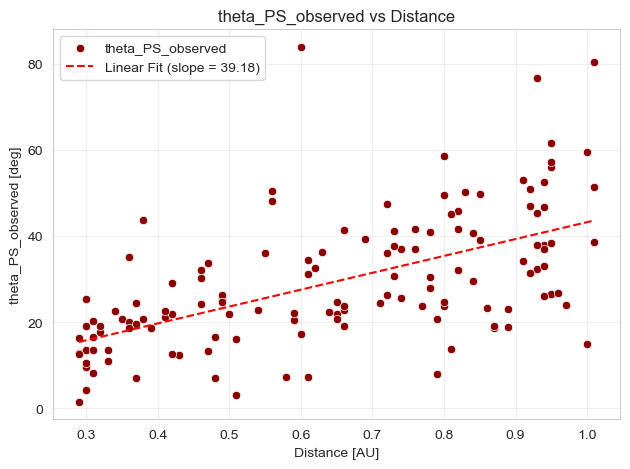

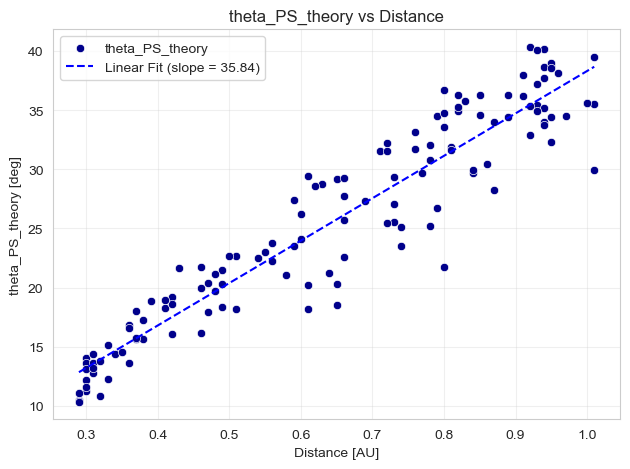

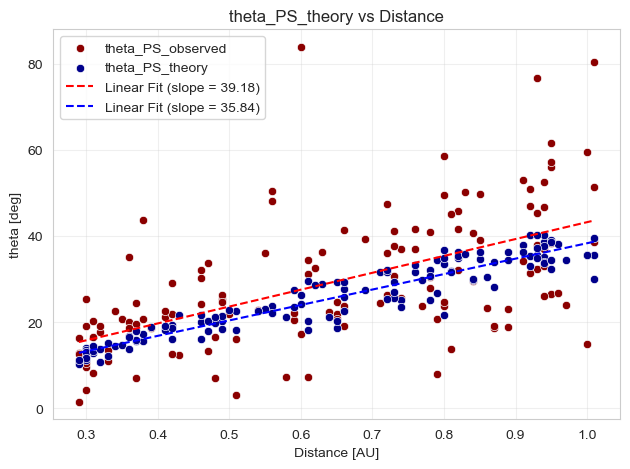

In [255]:
#  Radial Scalling of B_PARALLEL_0_mean AND |B_PERP_0|_mean and Parker Spiral Angles

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import linregress


UNITS = {'Distance_mean': 'AU','theta_PS_observed': 'deg','theta_PS_theory': 'deg'}

# ----------------------------------------------------
# Main plotting function
# ----------------------------------------------------
def redo_data_plots(df):

    columns = ['theta_PS_observed','theta_PS_theory']
        

    for col in columns:

        x = df['Distance_mean'].values
        y = df[col].values

        # =========================================================
        # 1) LINEAR PLOT
        # =========================================================
        mask_lin = np.isfinite(x) & np.isfinite(y)
        if mask_lin.sum() < 2:
            continue

        x_lin = x[mask_lin]
        y_lin = y[mask_lin]

        slope_lin, intercept_lin, _, _, _ = linregress(x_lin, y_lin)

        x_fit_lin = np.linspace(x_lin.min(), x_lin.max(), 200)
        y_fit_lin = slope_lin * x_fit_lin + intercept_lin

        plt.figure()
        sns.scatterplot(x=x_lin, y=y_lin, label=col,color='darkred' if col=='theta_PS_observed' else 'darkblue')
        plt.plot(x_fit_lin, y_fit_lin,'r--' if col=='theta_PS_observed' else 'b--',
                 label=f'Linear Fit (slope = {slope_lin:.2f})')

        plt.title(f'{col} vs Distance')
        plt.xlabel(f"Distance [{UNITS['Distance_mean']}]")
        plt.ylabel(f"{col} [{UNITS.get(col, '')}]")
        plt.grid(True, which='both', alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.show()

# # =========================================================
    x = df['Distance_mean'].values
    y1 = df['theta_PS_observed'].values
    y2= df['theta_PS_theory'].values

    # =========================================================
    # 1) LINEAR PLOT
    # =========================================================
  
    x_lin = x
    y1_lin = y1
    y2_lin = y2

    slope_lin1, intercept_lin1, _, _, _ = linregress(x_lin, y1_lin)
    slope_lin2, intercept_lin2, _, _, _ = linregress(x_lin, y2_lin)


    x_fit_lin = np.linspace(x_lin.min(), x_lin.max(), 200)
    y1_fit_lin = slope_lin1 * x_fit_lin + intercept_lin1
    y2_fit_lin = slope_lin2 * x_fit_lin + intercept_lin2

    plt.figure()
    sns.scatterplot(x=x_lin, y=y1_lin, label='theta_PS_observed',color='darkred')
    sns.scatterplot(x=x_lin, y=y2_lin, label='theta_PS_theory',color='darkblue')
    plt.plot(x_fit_lin, y1_fit_lin,'r--',
             label=f'Linear Fit (slope = {slope_lin1:.2f})')
    plt.plot(x_fit_lin, y2_fit_lin,'b--',
             label=f'Linear Fit (slope = {slope_lin2:.2f})')

    plt.title(f'{col} vs Distance')
    plt.xlabel(f"Distance [{UNITS['Distance_mean']}]")
    plt.ylabel("theta [deg]")
    plt.grid(True, which='both', alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()
redo_data_plots(all_delta_means_withmeans)


# plots for deltas



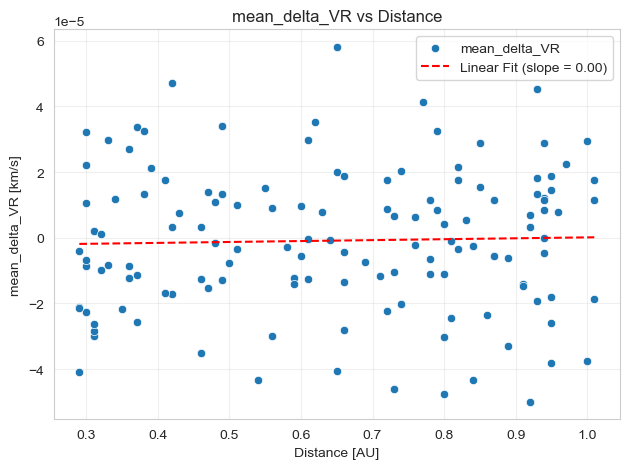

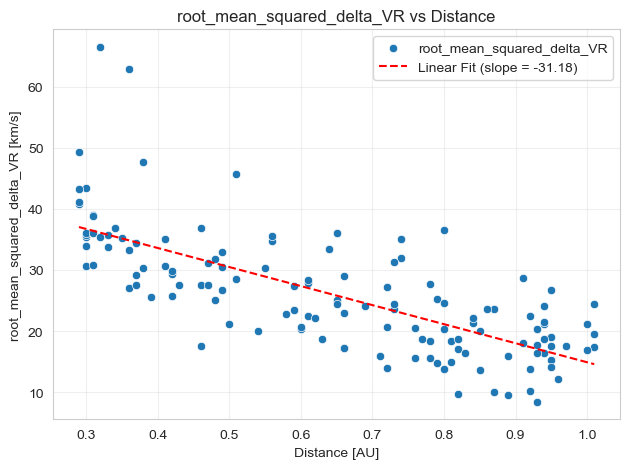

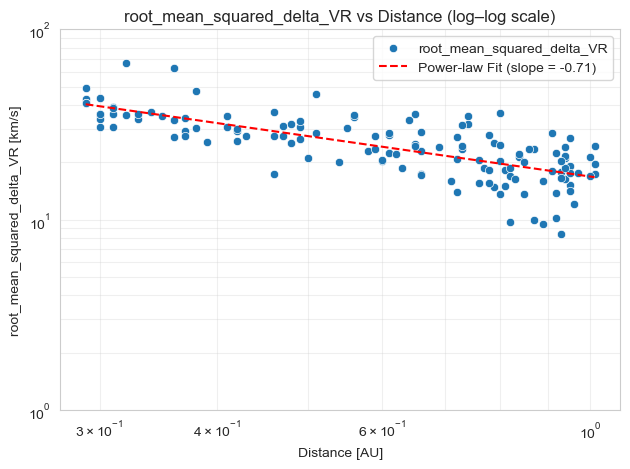

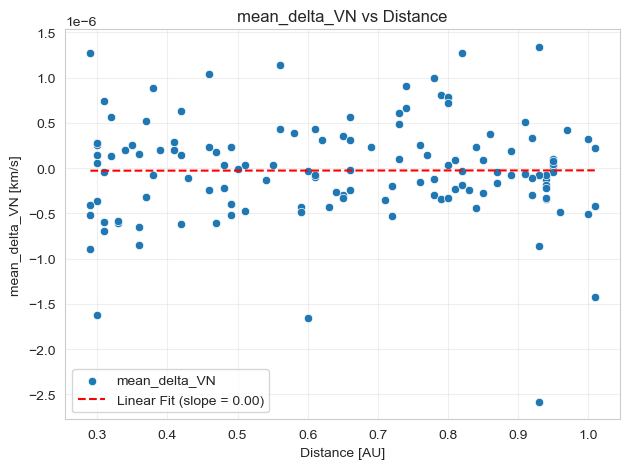

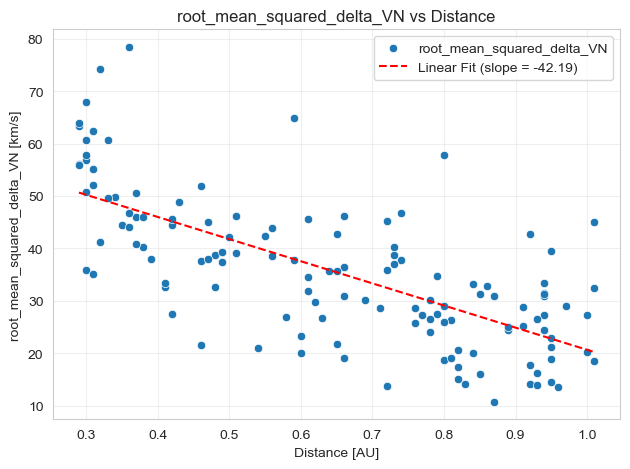

...

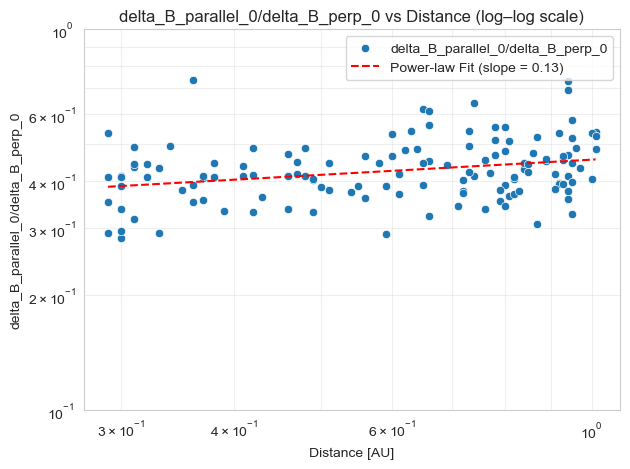

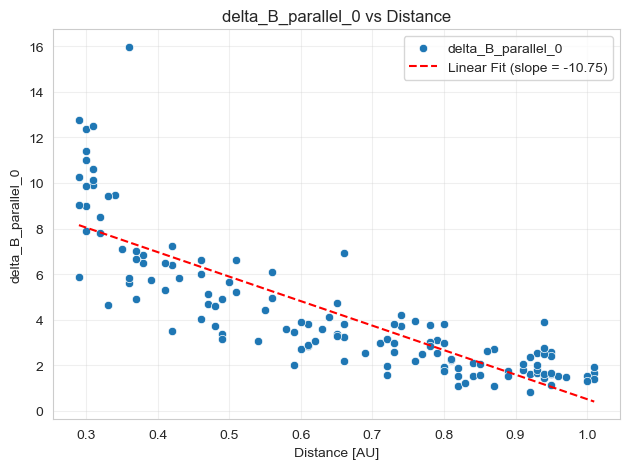

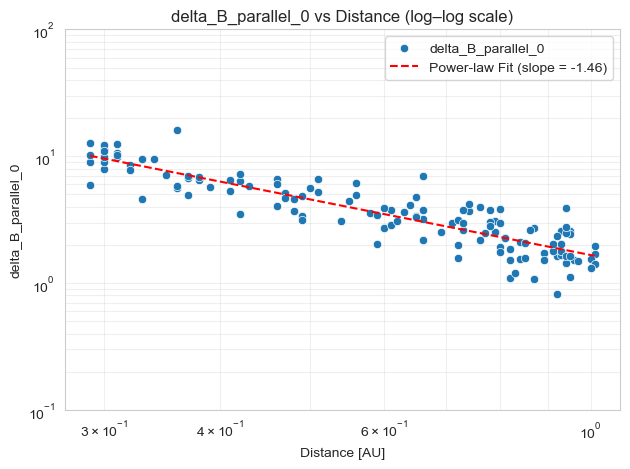

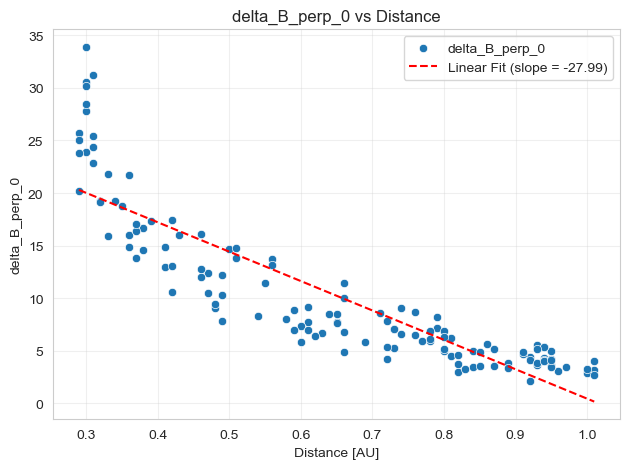

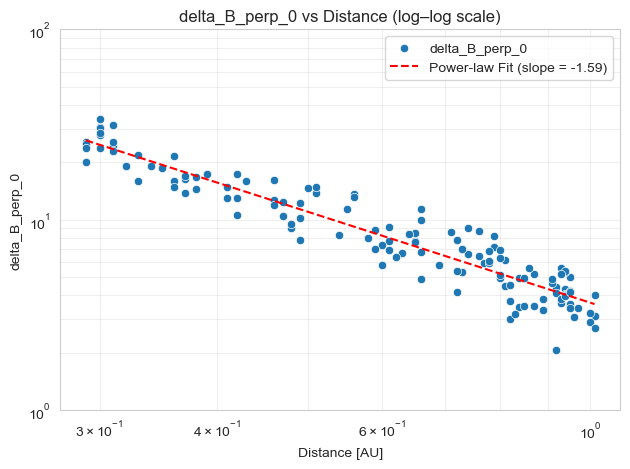

In [256]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import linregress

# ----------------- Units -----------------
UNITS_deltas = {
    # Velocities
    'mean_delta_VR': 'km/s', 'mean_delta_VN': 'km/s', 'mean_delta_VT': 'km/s',
    'mean_delta_|V|': 'km/s',
    'root_mean_squared_delta_VR': 'km/s', 'root_mean_squared_delta_VN': 'km/s',
    'root_mean_squared_delta_VT': 'km/s', 'root_mean_squared_delta_|V|': 'km/s',

    # Density
    'mean_delta_N': r'cm$^{-3}$', 'root_mean_squared_delta_N': r'cm$^{-3}$',

    # Distance
    'Distance': 'AU',

    # Temperatures (scalar + tensor)
    'mean_delta_T_R': 'K',
    'mean_delta_T_T': 'K',
    'mean_delta_T_N': 'K',
    'mean_delta_T': 'K',
    'mean_delta_T_RR': 'K',
    'mean_delta_T_RT': 'K',
    'mean_delta_T_RN': 'K',
    'mean_delta_T_TT': 'K',
    'mean_delta_T_TN': 'K',
    'mean_delta_T_NN': 'K',

    # Magnetic field
    'mean_delta_|B|': 'nT',
    'root_mean_squared_delta_|B|': 'nT',
    'root_mean_squared_delta_BR': 'nT',
    'root_mean_squared_delta_BT': 'nT',
    'root_mean_squared_delta_BN': 'nT',
    'mean_delta_|B_transv|': 'nT',
    'root_mean_squared_delta_|B_transv|': 'nT'
}

def sort_xy(x, y):
    x = np.asarray(x)
    y = np.asarray(y)
    order = np.argsort(x)
    return x[order], y[order]


# ----------------- Main plotting function -----------------
def redo_all_delta_means_plots(df):

    columns = [
        'mean_delta_VR', 'root_mean_squared_delta_VR', 'mean_delta_VN', 'root_mean_squared_delta_VN',
        'mean_delta_VT', 'root_mean_squared_delta_VT', 'mean_delta_|V|', 'root_mean_squared_delta_|V|',
        'mean_delta_N', 'root_mean_squared_delta_N', 'mean_delta_|B|', 'root_mean_squared_delta_|B|',
        'root_mean_squared_delta_BR', 'root_mean_squared_delta_BT', 'root_mean_squared_delta_BN',
        'root_mean_squared_delta_|B_transv|', 'mean_delta_|B_transv|',
        'mean_delta_T_R', 'mean_delta_T_T', 'mean_delta_T_N', 'mean_delta_T',
        'mean_delta_T_RR', 'mean_delta_T_RT', 'mean_delta_T_RN',
        'mean_delta_T_TT', 'mean_delta_T_TN', 'mean_delta_T_NN',
        'delta_parallel/perp', 'delta_perp/|B|', 'delta_parallel/|B|', 'delta_|B|/|B|',
        'delta_perp/B_0', 'delta_parallel/B_0', 'delta_|B|/B_0',
        'delta_parallel/delta_BT', 'delta_parallel/delta_BN',
        'delta_B_parallel_0/B_0', 'delta_B_perp_0/B_0','delta_B_parallel_0/delta_B_perp_0','delta_B_parallel_0', 'delta_B_perp_0'
    ]

    # Columns that ALSO get a log–log + power-law fit
    cols_to_log = [
        'root_mean_squared_delta_BR', 'root_mean_squared_delta_BT', 'root_mean_squared_delta_BN',
        'root_mean_squared_delta_N', 'root_mean_squared_delta_|V|', 'root_mean_squared_delta_|B|',
        'root_mean_squared_delta_|B_transv|', 'root_mean_squared_delta_VR', 'root_mean_squared_delta_VN',
        'root_mean_squared_delta_VT', 'root_mean_squared_delta_|B_transv|',
        'delta_parallel/perp', 'delta_perp/|B|', 'delta_parallel/|B|', 'delta_|B|/|B|',
        'delta_parallel/delta_BT', 'delta_parallel/delta_BN',
        'delta_perp/B_0', 'delta_parallel/B_0', 'delta_|B|/B_0',
        'delta_B_parallel_0/B_0', 'delta_B_perp_0/B_0','delta_B_parallel_0/delta_B_perp_0', 'delta_B_parallel_0', 'delta_B_perp_0'
    ]

    for col in columns:
        if col not in df.columns:
            continue  # skip if column not present

        x = df['Distance'].values
        y = df[col].values

        # ---------------- 1) Linear plot + linear fit ----------------
        mask_lin = np.isfinite(x) & np.isfinite(y)
        if mask_lin.sum() < 2:
            continue

        x_lin = x[mask_lin]
        y_lin = y[mask_lin]

        slope_lin, intercept_lin, _, _, _ = linregress(x_lin, y_lin)

        x_fit_lin = np.linspace(x_lin.min(), x_lin.max(), 200)
        y_fit_lin = slope_lin * x_fit_lin + intercept_lin

        plt.figure()
        sns.scatterplot(x=x_lin, y=y_lin, label=col)
        plt.plot(x_fit_lin, y_fit_lin, 'r--',
                 label=f'Linear Fit (slope = {slope_lin:.2f})')

        plt.title(f'{col} vs Distance')
        plt.xlabel(f"Distance [{UNITS_deltas['Distance']}]")

        if col in UNITS_deltas:
            ylabelstring = f"{col} [{UNITS_deltas[col]}]"
        else:
            ylabelstring = col
        plt.ylabel(ylabelstring)

        plt.grid(True, which='both', alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.show()

        # ---------------- 2) Log–log plot + power-law fit ----------------
        if col not in cols_to_log:
            continue

        mask_log = (x > 0) & (y > 0) & np.isfinite(x) & np.isfinite(y)
        if mask_log.sum() < 2:
            continue

        x_log = x[mask_log]
        y_log = y[mask_log]

        logx = np.log10(x_log)
        logy = np.log10(y_log)

        slope_pow, intercept_pow, _, _, _ = linregress(logx, logy)

        # y = 10^intercept_pow * x^slope_pow
        x_fit_log = np.logspace(np.log10(x_log.min()),
                                np.log10(x_log.max()), 200)
        y_fit_log = 10**intercept_pow * x_fit_log**slope_pow

        plt.figure()
        sns.scatterplot(x=x_log, y=y_log, label=col)
        plt.plot(x_fit_log, y_fit_log, 'r--',
                 label=f'Power-law Fit (slope = {slope_pow:.2f})')

        plt.xscale('log')
        plt.yscale('log')

        # Force y-axis to span at least 1 decade (=> at least 2 round log numbers)
        ymin = y_log.min()
        ymax = y_log.max()

        log_ymin = np.floor(np.log10(ymin))
        log_ymax = np.ceil(np.log10(ymax))

        if (log_ymax - log_ymin) < 1:
            # expand symmetrically around the middle in log space
            log_ymid = 0.5 * (log_ymin + log_ymax)
            log_ymin = np.floor(log_ymid - 0.5)
            log_ymax = np.ceil(log_ymid + 0.5)

        plt.ylim(10**log_ymin, 10**log_ymax)

        plt.title(f'{col} vs Distance (log–log scale)')
        plt.xlabel(f"Distance [{UNITS_deltas['Distance']}]")
        plt.ylabel(ylabelstring)
        plt.grid(True, which='both', alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.show()


# Example call:
redo_all_delta_means_plots(all_delta_means_withmeans)
# redo_all_delta_means_plots(positive_all_delta_means)
# redo_all_delta_means_plots(negative_all_delta_means)


PLOTS FOR DELTA EQUATIONS

2026-01-07 22:09:23 - matplotlib.mathtext - INFO: Substituting symbol \perp from STIXGeneral
2026-01-07 22:09:23 - matplotlib.mathtext - INFO: Substituting symbol \perp from STIXGeneral
2026-01-07 22:09:23 - matplotlib.mathtext - INFO: Substituting symbol \perp from STIXGeneral
2026-01-07 22:09:23 - matplotlib.mathtext - INFO: Substituting symbol \perp from STIXGeneral
2026-01-07 22:09:23 - matplotlib.mathtext - INFO: Substituting symbol \perp from STIXGeneral
2026-01-07 22:09:23 - matplotlib.mathtext - INFO: Substituting symbol \perp from STIXGeneral
2026-01-07 22:09:23 - matplotlib.mathtext - INFO: Substituting symbol \perp from STIXGeneral
2026-01-07 22:09:23 - matplotlib.mathtext - INFO: Substituting symbol \perp from STIXGeneral


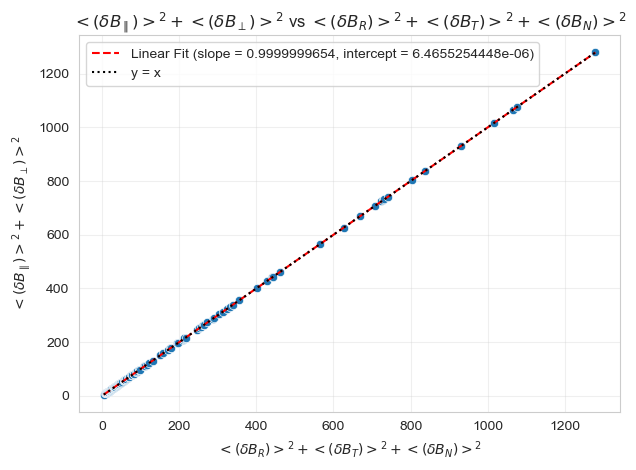

2026-01-07 22:09:23 - matplotlib.mathtext - INFO: Substituting symbol \perp from STIXGeneral
2026-01-07 22:09:23 - matplotlib.mathtext - INFO: Substituting symbol \perp from STIXGeneral
2026-01-07 22:09:23 - matplotlib.mathtext - INFO: Substituting symbol \perp from STIXGeneral
2026-01-07 22:09:23 - matplotlib.mathtext - INFO: Substituting symbol \perp from STIXGeneral
2026-01-07 22:09:23 - matplotlib.mathtext - INFO: Substituting symbol \perp from STIXGeneral
2026-01-07 22:09:23 - matplotlib.mathtext - INFO: Substituting symbol \perp from STIXGeneral
2026-01-07 22:09:23 - matplotlib.mathtext - INFO: Substituting symbol \perp from STIXGeneral
2026-01-07 22:09:23 - matplotlib.mathtext - INFO: Substituting symbol \perp from STIXGeneral


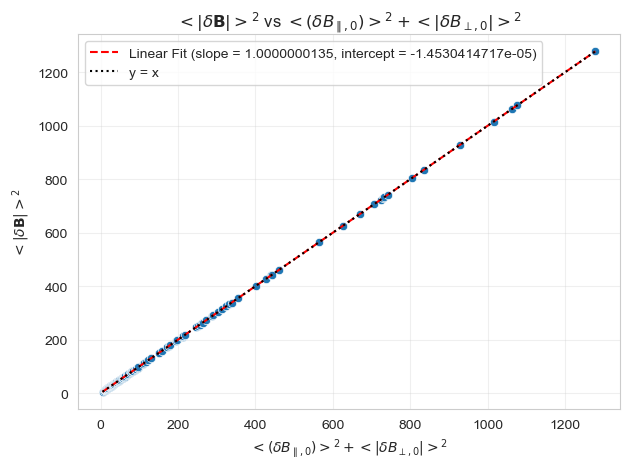

In [257]:
def redo_all_delta_means_plots(df):

    # We now only plot these sanity-check pairs:
    pairs = [
        ('deltas_RTN', 'deltas_RTN_check'),
        ('deltas_//†', 'deltas_//†_check'),
    ]

    # --------- Pretty axis labels ---------
    LABELS = {
        'deltas_RTN'        : r'$<(\delta B_R)>^2 + <(\delta B_T)>^2 + <(\delta B_N)>^2$',
        'deltas_RTN_check'  : r'$<(\delta B_{\parallel})>^2 + <(\delta B_{\perp})>^2$',

        'deltas_//†'        : r'$<(\delta B_{\parallel,0})>^2 + <|\delta B_{\perp,0}|>^2$',
        'deltas_//†_check'  : r'$<|\delta \mathbf{B}|>^2$'
    }

    for x_col, y_col in pairs:
        if (x_col not in df.columns) or (y_col not in df.columns):
            continue

        x = df[x_col].values
        y = df[y_col].values

        # ---------------- 1) Linear plot + linear fit ----------------
        mask_lin = np.isfinite(x) & np.isfinite(y)
        if mask_lin.sum() < 2:
            continue

        x_lin = x[mask_lin]
        y_lin = y[mask_lin]

        # sort
        x_lin, y_lin = sort_xy(x_lin, y_lin)

        slope_lin, intercept_lin, _, _, _ = linregress(x_lin, y_lin)

        x_fit_lin = np.linspace(x_lin.min(), x_lin.max(), 200)
        y_fit_lin = slope_lin * x_fit_lin + intercept_lin

# --------- HIGH-PRECISION PRINTS ---------


        plt.figure()
        sns.scatterplot(x=x_lin, y=y_lin)
        plt.plot(x_fit_lin, y_fit_lin, 'r--',label=f'Linear Fit (slope = {slope_lin:.10f}, intercept = {intercept_lin:.10e})')


        # y = x reference line
        min_val = min(x_lin.min(), y_lin.min())
        max_val = max(x_lin.max(), y_lin.max())
        plt.plot([min_val, max_val], [min_val, max_val], 'k:',
                 label='y = x')

        # --------- USE PRETTY LABELS HERE ---------
        plt.xlabel(LABELS[x_col])
        plt.ylabel(LABELS[y_col])

        plt.title(f'{LABELS[y_col]} vs {LABELS[x_col]}')

        plt.grid(True, which='both', alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.show()


redo_all_delta_means_plots(all_delta_means_withmeans)

## sphere relation check plots

2026-01-07 22:09:24 - matplotlib.mathtext - INFO: Substituting symbol \perp from STIXGeneral
2026-01-07 22:09:24 - matplotlib.mathtext - INFO: Substituting symbol \perp from STIXGeneral
2026-01-07 22:09:24 - matplotlib.mathtext - INFO: Substituting symbol \perp from STIXGeneral
2026-01-07 22:09:24 - matplotlib.mathtext - INFO: Substituting symbol \perp from STIXGeneral
2026-01-07 22:09:24 - matplotlib.mathtext - INFO: Substituting symbol \perp from STIXGeneral
2026-01-07 22:09:24 - matplotlib.mathtext - INFO: Substituting symbol \perp from STIXGeneral
2026-01-07 22:09:24 - matplotlib.mathtext - INFO: Substituting symbol \perp from STIXGeneral
2026-01-07 22:09:24 - matplotlib.mathtext - INFO: Substituting symbol \perp from STIXGeneral


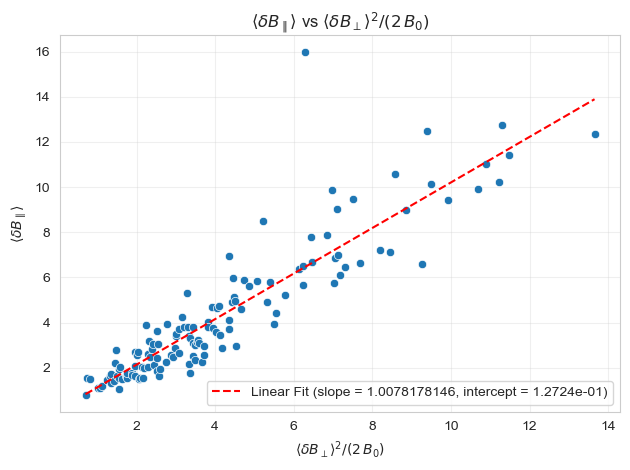

2026-01-07 22:09:25 - matplotlib.mathtext - INFO: Substituting symbol \perp from STIXGeneral
2026-01-07 22:09:25 - matplotlib.mathtext - INFO: Substituting symbol \perp from STIXGeneral
2026-01-07 22:09:25 - matplotlib.mathtext - INFO: Substituting symbol \perp from STIXGeneral
2026-01-07 22:09:25 - matplotlib.mathtext - INFO: Substituting symbol \perp from STIXGeneral
2026-01-07 22:09:25 - matplotlib.mathtext - INFO: Substituting symbol \perp from STIXGeneral
2026-01-07 22:09:25 - matplotlib.mathtext - INFO: Substituting symbol \perp from STIXGeneral
2026-01-07 22:09:25 - matplotlib.mathtext - INFO: Substituting symbol \perp from STIXGeneral
2026-01-07 22:09:25 - matplotlib.mathtext - INFO: Substituting symbol \perp from STIXGeneral
2026-01-07 22:09:25 - matplotlib.mathtext - INFO: Substituting symbol \perp from STIXGeneral
2026-01-07 22:09:25 - matplotlib.mathtext - INFO: Substituting symbol \perp from STIXGeneral
2026-01-07 22:09:25 - matplotlib.mathtext - INFO: Substituting symbol 

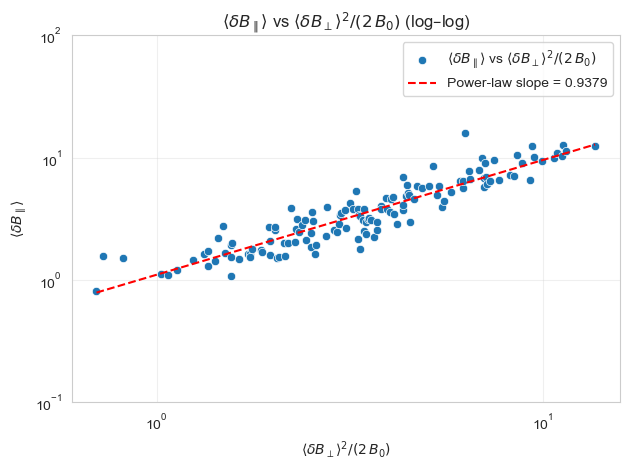

In [258]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import linregress

# Helper if not defined
def sort_xy(x, y):
    idx = np.argsort(x)
    return x[idx], y[idx]

def plot_sphere_relation(df):
    """
    Plots sphere_relation_LHS (x) vs sphere_relation_RHS (y)
    Linear scale + log–log scale.
    """

    # Fixed column names --------------------------------
    x_col = 'sphere_relation_LHS'
    y_col = 'sphere_relation_RHS'

    # Pretty labels -------------------------------------
    LABELS = {'sphere_relation_RHS': r'$\langle \delta B_{\parallel} \rangle$',
              'sphere_relation_LHS': r'$\langle \delta B_{\perp} \rangle^{2} / (2\,B_{0})$'}


    # Check existence -----------------------------------
    if (x_col not in df.columns) or (y_col not in df.columns):
        print("Required columns missing in dataframe.")
        return

    x = df[x_col].values
    y = df[y_col].values

    # ===================== 1) LINEAR PLOT =======================
    mask_lin = np.isfinite(x) & np.isfinite(y)
    if mask_lin.sum() < 2:
        print("Not enough valid points.")
        return

    x_lin, y_lin = sort_xy(x[mask_lin], y[mask_lin])

    slope_lin, intercept_lin, _, _, _ = linregress(x_lin, y_lin)

    x_fit = np.linspace(x_lin.min(), x_lin.max(), 200)
    y_fit = slope_lin * x_fit + intercept_lin

    plt.figure()
    sns.scatterplot(x=x_lin, y=y_lin)
    plt.plot(x_fit, y_fit, 'r--',
             label=f'Linear Fit (slope = {slope_lin:.10f}, intercept = {intercept_lin:.4e})')

    # # y = x line
    # min_val = min(x_lin.min(), y_lin.min())
    # max_val = max(x_lin.max(), y_lin.max())
    # plt.plot([min_val, max_val], [min_val, max_val], 'k:', label='y = x')

    xlabel = LABELS[x_col]
    ylabel = LABELS[y_col]

    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(f'{ylabel} vs {xlabel}')

    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # ===================== 2) LOG–LOG PLOT =======================
    mask_log = (x > 0) & (y > 0) & np.isfinite(x) & np.isfinite(y)
    if mask_log.sum() < 2:
        print("Not enough positive values for log–log.")
        return

    x_log, y_log = sort_xy(x[mask_log], y[mask_log])

    logx = np.log10(x_log)
    logy = np.log10(y_log)

    slope_pow, intercept_pow, _, _, _ = linregress(logx, logy)

    x_fit_log = np.logspace(np.log10(x_log.min()), np.log10(x_log.max()), 200)
    y_fit_log = 10**intercept_pow * x_fit_log**slope_pow

    # # ----- y = x reference line (log–log safe) -----
    # min_val = min(x_log.min(), y_log.min())
    # max_val = max(x_log.max(), y_log.max())

    # # Generate a smooth diagonal line in log–log space
    # ref_x = np.logspace(np.log10(min_val), np.log10(max_val), 200)
    # ref_y = ref_x.copy()



    plt.figure()
    sns.scatterplot(x=x_log, y=y_log, label=f'{ylabel} vs {xlabel}')
    # plt.plot(ref_x, ref_y, 'k:', linewidth=1, label='y = x')
    plt.plot(x_fit_log, y_fit_log, 'r--', label=f'Power-law slope = {slope_pow:.4f}')

    plt.xscale('log')
    plt.yscale('log')

    # y-axis at least 1 decade
    log_ymin = np.floor(logy.min())
    log_ymax = np.ceil(logy.max())

    if log_ymax - log_ymin < 1:
        mid = 0.5 * (log_ymin + log_ymax)
        log_ymin = np.floor(mid - 0.5)
        log_ymax = np.ceil(mid + 0.5)

    plt.ylim(10**log_ymin, 10**log_ymax)

    plt.title(f'{ylabel} vs {xlabel} (log–log)')
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()


plot_sphere_relation(all_delta_means_withmeans)


# Parker Spiral angle plot


In [259]:
# # Mass Flux Plots
# # Loop through each date range in the daterange dictionary
# for name in SWA_df['name'].unique():
#                         # Get the name of the range
#
#     # Filter the dataframes for the current date range
#     SWA_filtered = SWA_df[SWA_df['name'] == name]
#
#
#     # Create subplots for plotting                       1st number is the width, 2nd is the height
#     fig, ax = plt.subplots(1, 1, layout='tight', sharex=True, figsize=(8, 6))
#
#     # Plotting for Proton Velocity Moments
#     ax.set_title(f'Mass Flux: {name}')
#     ax.plot(SWA_filtered['mass_flux'], color='red', label='Mass Flux')# ,linewidth=0.2)
#     ax.tick_params(top=False, bottom=True, left=True, right=False, labelbottom=True, labeltop=False, labelleft=True, labelright=False)
#     ax.legend()
#
#
#     # Format the dates nicely
#     fig.autofmt_xdate()
#
#     # Show each figure
#     # fig.show()
#     plotly_fig = tls.mpl_to_plotly(fig)
#     legend = go.layout.Legend(
#         x=1,
#         y=0.5
#     )
#     plotly_fig.update_layout(showlegend=True,legend=legend)
#     plotly_fig.update_xaxes(matches='x')
#     iplot(plotly_fig)

In [260]:
mean_values_df

,VR_mean,VN_mean,VT_mean,|V|_mean,N_mean,Distance_mean,mass_flux_mean,T_R_mean,T_T_mean,T_N_mean,T_mean,P_RR_mean,P_RT_mean,P_RN_mean,P_TT_mean,P_TN_mean,P_NN_mean,P_RR_nPa_mean,P_RT_nPa_mean,P_RN_nPa_mean,P_TT_nPa_mean,P_TN_nPa_mean,P_NN_nPa_mean,T_RR_mean,T_RT_mean,T_RN_mean,T_TT_mean,T_TN_mean,T_NN_mean,BR_mean,BT_mean,BN_mean,|B|_mean,|B_transv|_mean,abs_BR_mean,abs_BT_mean,abs_BN_mean,theta,phi,|mean_B_vector|
name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Date_Range1,496.116516,-8.610609,-30.829149,498.375977,20.537035,0.65,1.603998e+08,257520.092613,247265.501825,248000.564108,250928.719429,7.637191e-17,-2.634947e-18,2.893411e-19,7.263337e-17,1.410537e-18,7.194673e-17,0.076372,-0.002635,0.000289,0.072633,0.001411,0.071947,257644.875000,-6109.813965,531.442688,247385.296875,2772.211914,248120.703125,-6.752596,2.362416,1.315146,11.299715,7.982371,6.752596,2.362416,1.315146,-19.282539,-49.770828,7.273800
Date_Range10,536.230225,-18.924515,-15.096873,537.689575,8.857089,0.66,7.779941e+07,197220.701377,230159.770422,226642.377378,218007.616344,2.485079e-17,4.462695e-19,1.297913e-18,2.865244e-17,2.599186e-19,2.828052e-17,0.024851,0.000446,0.001298,0.028652,0.000260,0.028281,197316.250000,4139.970215,11054.771484,230271.296875,2219.331299,226752.203125,7.774230,-1.968433,-1.850190,9.802388,4.870840,7.774230,1.968433,1.850190,-14.208655,32.068649,8.230224
Date_Range100,643.526001,-1.960100,-15.400931,644.386169,4.383032,0.95,9.541181e+07,211791.157157,247038.536489,235469.863339,231433.185690,1.282320e-17,-2.379211e-19,8.392936e-20,1.495811e-17,1.980159e-19,1.427478e-17,0.012823,-0.000238,0.000084,0.014958,0.000198,0.014275,211893.765625,-4250.473633,1571.303833,247158.234375,3069.940430,235583.953125,2.977524,-1.478319,0.062605,5.149031,3.609801,2.977524,1.478319,0.062605,-26.404066,50.482670,3.324905
Date_Range101,506.569641,0.149152,-19.299078,507.894104,9.482888,0.95,1.629433e+08,184794.037356,210169.856613,194056.690861,196340.194942,2.607250e-17,-1.392702e-18,4.122819e-19,2.958033e-17,2.004292e-19,2.758408e-17,0.026073,-0.001393,0.000412,0.029580,0.000200,0.027584,184883.562500,-12424.969727,2212.691650,210271.687500,2028.375977,194150.718750,3.431523,-5.097324,-0.004434,8.165782,6.861506,3.431523,5.097324,0.004434,-56.051521,63.429806,6.144761
Date_Range102,556.190063,-19.915075,-45.952396,559.844177,6.555274,0.93,1.188903e+08,232254.421569,254058.978065,217370.895149,234561.431605,2.190439e-17,-2.426981e-19,1.640350e-19,2.370142e-17,-3.137719e-19,2.030148e-17,0.021904,-0.000243,0.000164,0.023701,-0.000314,0.020301,232366.937500,-3207.817383,2434.669189,254182.078125,-3978.915039,217476.203125,-3.501194,2.009113,0.944730,7.240846,5.784932,3.501194,2.009113,0.944730,-29.848782,-58.816559,4.145770
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Date_Range95,492.456177,-5.913337,-36.187111,494.903259,35.407501,0.46,1.388447e+08,397797.773686,353480.100780,313034.189417,354770.687887,1.940282e-16,-1.163947e-17,4.965428e-18,1.727405e-16,4.817775e-18,1.528760e-16,0.194028,-0.011639,0.004965,0.172740,0.004818,0.152876,397990.500000,-23975.404297,11169.344727,353651.343750,9378.922852,313185.843750,16.219503,-9.363791,1.298169,22.605946,14.243398,16.219503,9.363791,1.298169,-29.998554,41.288464,18.773335
Date_Range96,574.481750,-3.321916,-30.560373,580.577637,3.463761,0.59,2.621825e+07,175055.959813,334242.963195,284018.205562,264439.042878,8.489281e-18,2.867310e-18,9.552044e-19,1.621568e-17,-8.836068e-20,1.370587e-17,0.008489,0.002867,0.000955,0.016216,-0.000088,0.013706,175140.781250,58652.027344,14810.755859,334404.906250,629.221313,284155.812500,-14.476784,5.863312,0.416833,17.220404,8.537735,14.476784,5.863312,0.416833,-22.048676,-30.530128,15.624642
Date_Range97,470.783844,29.039148,-25.061211,473.194489,11.019399,0.93,1.697102e+08,164877.236717,207579.724738,162047.543214,178168.168231,2.640306e-17,-6.280286e-

In [261]:
all_mean_table=pd.merge(mean_values_df, all_delta_means, on='name')
all_mean_table

,VR_mean,VN_mean,VT_mean,|V|_mean,N_mean,Distance_mean,mass_flux_mean,T_R_mean,T_T_mean,T_N_mean,T_mean,P_RR_mean,P_RT_mean,P_RN_mean,P_TT_mean,P_TN_mean,P_NN_mean,P_RR_nPa_mean,P_RT_nPa_mean,P_RN_nPa_mean,P_TT_nPa_mean,P_TN_nPa_mean,P_NN_nPa_mean,T_RR_mean,T_RT_mean,T_RN_mean,T_TT_mean,T_TN_mean,T_NN_mean,BR_mean,BT_mean,BN_mean,|B|_mean,|B_transv|_mean,abs_BR_mean,abs_BT_mean,abs_BN_mean,theta,phi,|mean_B_vector|,mean_delta_|V|,mean_delta_VR,mean_delta_VN,mean_delta_VT,mean_delta_N,mean_squared_delta_|V|,mean_squared_delta_VR,mean_squared_delta_VN,mean_squared_delta_VT,mean_squared_delta_N,mean_delta_T_R,mean_delta_T_T,mean_delta_T_N,mean_delta_T,mean_delta_T_RR,mean_delta_T_RT,mean_delta_T_RN,mean_delta_T_TT,mean_delta_T_TN,mean_delta_T_NN,mean_delta_|B|,mean_squared_delta_BR,mean_squared_delta_BT,mean_squared_delta_BN,mean_squared_delta_|B|,mean_delta_|B_transv|,mean_squared_delta_|B_transv|,mean_squared_delta_B_parallel_0,mean_squared_delta_|B_perp_0|,mean_squared_|delta_B_vector|,root_mean_squared_delta_BR,root_mean_squared_delta_BT,root_mean_squared_delta_BN,root_mean_squared_delta_N,root_mean_squared_delta_|V|,root_mean_squared_delta_VR,root_mean_squared_delta_VN,root_mean_squared_delta_VT,root_mean_squared_delta_|B|,root_mean_squared_delta_|B_transv|,root_mean_squared_delta_B_parallel_0,root_mean_squared_delta_|B_perp_0|,root_mean_squared_|delta_B_vector|,Distance
name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Date_Range1,496.116516,-8.610609,-30.829149,498.375977,20.537035,0.65,1.603998e+08,257520.092613,247265.501825,248000.564108,250928.719429,7.637191e-17,-2.634947e-18,2.893411e-19,7.263337e-17,1.410537e-18,7.194673e-17,0.076372,-0.002635,0.000289,0.072633,0.001411,0.071947,257644.875000,-6109.813965,531.442688,247385.296875,2772.211914,248120.703125,-6.752596,2.362416,1.315146,11.299715,7.982371,6.752596,2.362416,1.315146,-19.282539,-49.770828,7.273800,-8.303946e-07,0.000020,3.605661e-07,1.608171e-06,-3.935605e-07,616.675476,625.619080,474.038361,739.435059,30.827419,2.880329e-11,-8.983205e-12,2.060543e-11,-8.636601e-12,-0.014990,-0.000477,0.000014,0.003995,0.000246,0.016136,-2.769077e-07,17.421690,34.165417,30.573158,7.384876,1.897726e-07,8.330944,22.599514,59.560748,82.160263,4.173930,5.845119,5.529300,5.552245,24.832951,25.012379,21.772423,27.192554,2.717513,2.886338,4.753895,7.717561,9.064230,0.65
Date_Range10,536.230225,-18.924515,-15.096873,537.689575,8.857089,0.66,7.779941e+07,197220.701377,230159.770422,226642.377378,218007.616344,2.485079e-17,4.462695e-19,1.297913e-18,2.865244e-17,2.599186e-19,2.828052e-17,0.024851,0.000446,0.001298,0.028652,0.000260,0.028281,197316.250000,4139.970215,11054.771484,230271.296875,2219.331299,226752.203125,7.774230,-1.968433,-1.850190,9.802388,4.870840,7.774230,1.968433,1.850190,-14.208655,32.068649,8.230224,-3.373274e-05,-0.000013,5.695149e-07,3.605758e-08,-7.939977e-07,321.545074,299.106598,362.564728,641.024780,1.850509,2.205241e-12,3.182507e-11,1.162845e-12,-2.077655e-11,0.003865,0.000089,-0.000172,-0.015339,-0.000050,-0.018574,-5.635348e-08,5.673463,15.169092,7.751904,0.244240,-1.762853e-07,6.493843,4.835356,23.759102,28.594458,2.381903,3.894752,2.784224,1.360334,17.931679,17.294699,19.041132,25.318468,0.494207,2.548302,2.198944,4.874331,5.347379,0.66
Date_Range100,643.526001,-1.960100,-15.400931,644.386169,4.383032,0.95,9.541181e+07,211791.157157,247038.536489,235469.863339,231433.185690,1.282320e-17,-2.379211e-19,8.392936e-20,1.495811e-17,1.980159e-19,1.427478e-17,0.012823,-0.000238,0.000084,0.014958,0.000198,0.014275,211893.765625,-4250.473633,1571.303833,247158.234375,3069.940430,235583.953125,2.977524,-1.478319,0.062605,5.149031,3.609801,2.977524,1.478319,0.062605,-26.404066,50.482670,3.324905,-8.321940e-06,-0.000026,2.035644e-08,-3.873418e-07,-1.820069e-07,231.517776,233.037445,357.278839,508.014954,0.085725,2.735961e-11,-1.917014e-11,1.232467e-11,2.120379e-11,0.003443,-0.000127,-0.000028,-0.008793,0.000083,-0.005705,9.85

In [262]:
all_mean_table['average_delta_BR_star']=(all_mean_table['mean_delta_|B_transv|']**2)/(all_mean_table['|B|_mean']*2)
all_mean_table['average_delta_BR_star_TRIAL']=(((all_mean_table['root_mean_squared_delta_BN']**2)+(all_mean_table['root_mean_squared_delta_BT']**2))/(all_mean_table['|mean_B_vector|']*2))*1.4

In [263]:
display(all_mean_table[['average_delta_BR_star','average_delta_BR_star_TRIAL','root_mean_squared_delta_BR']])

all_mean_table[['mean_delta_|B_transv|', 'root_mean_squared_delta_BN']]


,average_delta_BR_star,average_delta_BR_star_TRIAL,root_mean_squared_delta_BR
name,,,
Date_Range1,1.593565e-15,6.230168,4.173930
Date_Range10,1.585149e-15,1.949485,2.381903
Date_Range100,7.421088e-16,2.607714,1.815844
Date_Range101,1.413409e-16,3.009387,2.250424
Date_Range102,5.722346e-16,5.432567,2.291207
...,...,...,...
Date_Range95,1.111160e-14,5.169353,4.539263
Date_Range96,2.677552e-16,2.169687,2.177630
Date_Range97,5.772154e-17,1.292977,4.375026


,mean_delta_|B_transv|,root_mean_squared_delta_BN
name,,
Date_Range1,1.897726e-07,5.529300
Date_Range10,-1.762853e-07,2.784224
Date_Range100,-8.742015e-08,2.338406
Date_Range101,4.804496e-08,4.187141
Date_Range102,-9.103255e-08,4.195351
...,...,...
Date_Range95,-7.087851e-07,8.837554
Date_Range96,-9.602971e-08,5.841851
Date_Range97,-3.079573e-08,2.817686


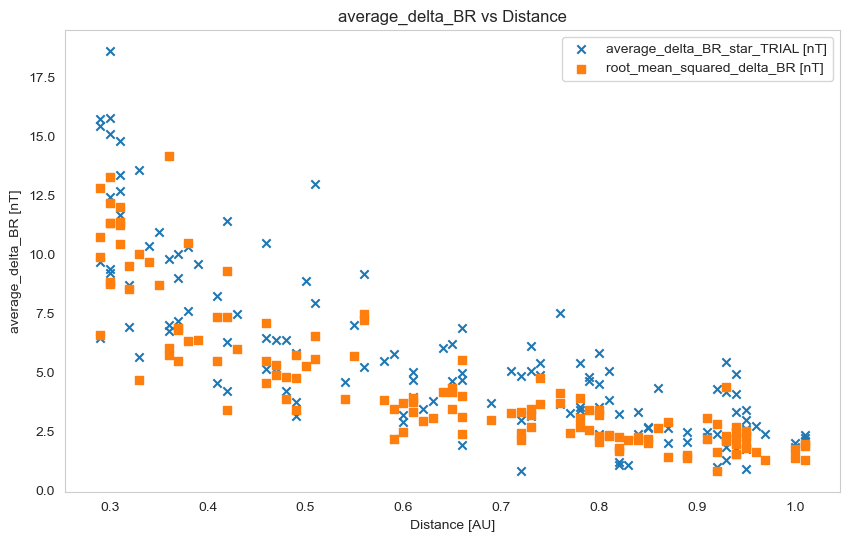

In [264]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
#plt.scatter(all_mean_table['Distance'], all_mean_table['average_delta_BR_star'], label='average_delta_BR_star', marker='o')
plt.scatter(all_mean_table['Distance'], all_mean_table['average_delta_BR_star_TRIAL'], label='average_delta_BR_star_TRIAL [nT]', marker='x')
plt.scatter(all_mean_table['Distance'], all_mean_table['root_mean_squared_delta_BR'], label='root_mean_squared_delta_BR [nT]', marker='s')

plt.xlabel('Distance [AU]')
plt.ylabel('average_delta_BR [nT]')
plt.title('average_delta_BR vs Distance')
plt.legend()
plt.grid()
plt.show()


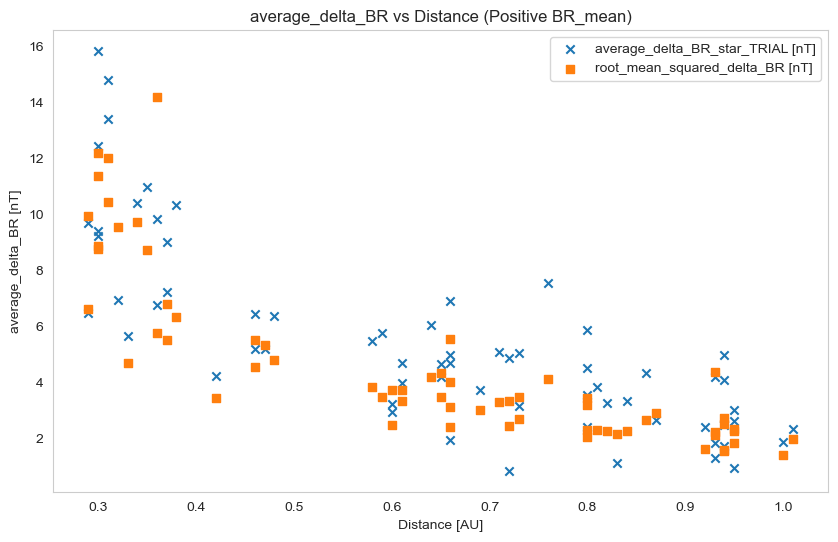

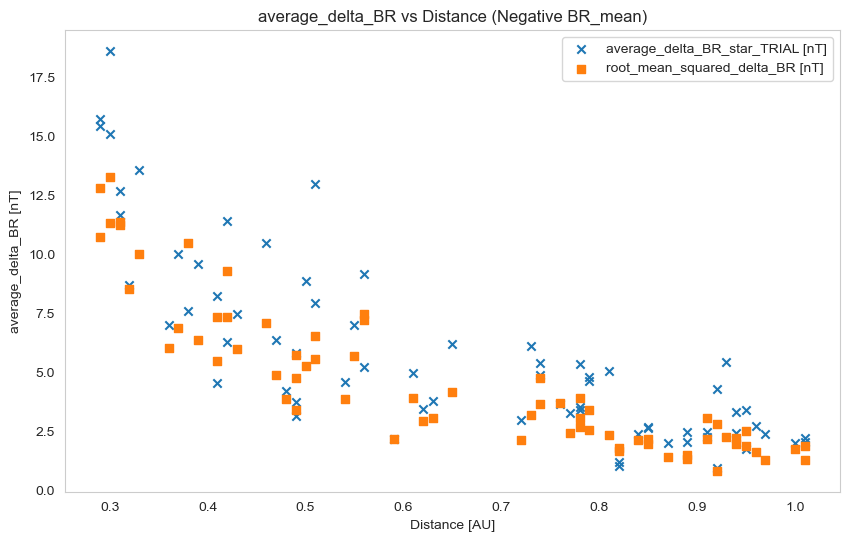

In [265]:
# Split all_mean_table into two groups based on the sign of BR_mean
positive_all_mean_table = all_mean_table[all_mean_table['BR_mean'] > 0]
negative_all_mean_table = all_mean_table[all_mean_table['BR_mean'] < 0]

# Function to redo the 'average_delta_BR vs Distance' plots for a given DataFrame
def redo_average_delta_BR_plots(df, group_name):
    import matplotlib.pyplot as plt

    plt.figure(figsize=(10, 6))
    plt.scatter(df['Distance'], df['average_delta_BR_star_TRIAL'], label='average_delta_BR_star_TRIAL [nT]', marker='x')
    plt.scatter(df['Distance'], df['root_mean_squared_delta_BR'], label='root_mean_squared_delta_BR [nT]', marker='s')

    plt.xlabel('Distance [AU]')
    plt.ylabel('average_delta_BR [nT]')
    plt.title(f'average_delta_BR vs Distance ({group_name})')
    plt.legend()
    plt.grid()
    plt.show()

# Redo the 'average_delta_BR vs Distance' plots for positive BR_mean
redo_average_delta_BR_plots(positive_all_mean_table, 'Positive BR_mean')

# Redo the 'average_delta_BR vs Distance' plots for negative BR_mean
redo_average_delta_BR_plots(negative_all_mean_table, 'Negative BR_mean')

In [266]:
MAG_df_wmean

,EPOCH,BR,BT,BN,Distance,name,|B|,|B_transv|,|B|_mean,BR_mean,BT_mean,BN_mean,|B_transv|_mean,|mean_B_vector|,Distance_mean,B0_vector,B_0_unit_vector,B_vector,B_//_0,dot_product_check,B_//_0_vector,B_perp_0_vector,|B_perp_0|,B_parallel_0_mean,|B_perp_0|_mean,cos_theta_PS,theta_PS_observed,phi_PS,theta_PS_theory,delta_|B|,delta_BR,delta_BT,delta_BN,delta_|B_transv|,delta_B_parallel_0,delta_|B_perp_0|,squared_delta_BR,squared_delta_BT,squared_delta_BN,squared_delta_|B|,squared_delta_|B_transv|,squared_delta_B_parallel_0,squared_delta_|B_perp_0|,squared_|delta_B_vector|
0,2021-08-21 00:08:29.999999776,-13.179045,14.118096,0.086142,0.65,Date_Range1,19.313604,14.118360,11.299715,-6.752596,2.362416,1.315146,7.982371,7.273800,0.65,"[-6.752595901489258, 2.3624157905578613, 1.315...","[-0.9283449579511042, 0.3247842488641701, 0.18...","[-13.179044723510742, 14.118096351623535, 0.08...",16.835610,16.835610,"[-15.62925366409893, 5.467940950317855, 3.0439...","[2.4502089405881886, 8.65015540130568, -2.9578...",9.464539,7.27380,7.158425,0.928345,21.821720,68.178284,34.856115,8.013889,-6.426449,11.755680,-1.229004,6.135989,9.561810,9.464539,41.299244,138.196014,1.510451,64.222420,37.650356,91.428216,89.577505,181.005707
1,2021-08-21 00:09:29.999996200,-13.549139,13.454594,1.530531,0.65,Date_Range1,19.155882,13.541368,11.299715,-6.752596,2.362416,1.315146,7.982371,7.273800,0.65,"[-6.752595901489258, 2.3624157905578613, 1.315...","[-0.9283449579511042, 0.3247842488641701, 0.18...","[-13.549139022827148, 13.454593658447266, 1.53...",17.224844,17.224844,"[-15.990597184534618, 5.594358057301077, 3.114...","[2.4414581617074695, 7.860235601146188, -1.583...",8.381677,7.27380,7.158425,0.928345,21.821720,68.178284,34.856115,7.856167,-6.796543,11.092178,0.215385,5.558997,9.951044,8.381677,46.192997,123.036423,0.046391,61.719357,30.902445,99.023284,70.252514,169.275803
2,2021-08-21 00:10:30.000002682,-14.307286,13.455720,2.443442,0.65,Date_Range1,19.792049,13.675775,11.299715,-6.752596,2.362416,1.315146,7.982371,7.273800,0.65,"[-6.752595901489258, 2.3624157905578613, 1.315...","[-0.9283449579511042, 0.3247842488641701, 0.18...","[-14.307286262512207, 13.455719947814941, 2.44...",18.094092,18.094092,"[-16.79755886732782, 5.8766760057785445, 3.271...","[2.490272604815612, 7.579043942036397, -0.8280...",8.020541,7.27380,7.158425,0.928345,21.821720,68.178284,34.856115,8.492334,-7.554690,11.093304,1.128296,5.693404,10.820292,8.020541,57.073345,123.061386,1.273052,72.119743,32.414845,117.078720,64.329075,181.407791
3,2021-08-21 00:11:29.999999105,-12.954463,10.547703,9.633520,0.65,Date_Range1,19.284109,14.284913,11.299715,-6.752596,2.362416,1.315146,7.982371,7.273800,0.65,"[-6.752595901489258, 2.3624157905578613, 1.315...","[-0.9283449579511042, 0.3247842488641701, 0.18...","[-12.954463005065918, 10.54770278930664, 9.633...",17.193736,17.193736,"[-15.961717664452364, 5.584254471174888, 3.108...","[3.0072546593864455, 4.963448318131753, 6.5247...",8.732256,7.27380,7.158425,0.928345,21.821720,68.178284,34.856115,7.984394,-6.201867,8.185287,8.318374,6.302542,9.919936,8.732256,38.463154,66.998932,69.195343,63.750549,39.722038,98.405126,76.252299,174.657425
4,2021-08-21 00:12:29.999995529,-14.416012,9.818862,8.968830,0.65,Date_Range1,19.613041,13.298494,11.299715,-6.752596,2.362416,1.315146,7.982371,7.273800,0.65,"[-6.752595901489258, 2.3624157905578613, 1.315...","[-0.9283449579511042, 0.3247842488641701, 0.18...","[-14.416011810302734, 9.818861961364746, 8.968...",18.193661,18.193661,"[-16.889993516793787, 5.909014543235662, 3.289...","[2.4739817064910525, 3.9098474181290843, 5.679...",7.325438,7.27380,7.158425,0.928345,21.821720,68.178284,34.856115,8.313326,-7.663416,7.456446,7.653684,5.316123,10.919861,7.325438,58.727943,55.598591,58.578880,69.111389,28.261169,119.243372,53.662039,172.905426
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,.

In [267]:
MAG_df_wmean['delta_BR_star']=(MAG_df_wmean['delta_|B_transv|']**2)/(MAG_df_wmean['|B|']*2)
MAG_df_wmean['delta_BR_star_TRIAL']=((MAG_df_wmean['delta_BN']**2)+(MAG_df_wmean['delta_BT']**2))/(MAG_df_wmean['|B|']*2)

In [268]:
MAG_df_wmean[['delta_BR_star','delta_BR_star_TRIAL','delta_BR']]

,delta_BR_star,delta_BR_star_TRIAL,delta_BR
0,0.974711,3.616789,-6.426449
1,0.806605,3.212664,-6.796543
2,0.818886,3.141020,-7.554690
3,1.029916,3.531257,-6.201867
4,0.720469,2.910754,-7.663416
...,...,...,...
111912,0.049718,2.195096,-0.227272
111913,0.131335,1.723096,-1.091421
111914,0.335200,1.902146,-2.023945
111915,0.067707,2.991976,-0.792087


In [269]:
# # Plot delta_BR_star, delta_BR_star_TRIAL, and delta_BR vs EPOCH for each 'name' group interactively
# 
# import matplotlib.pyplot as plt
# import pandas as pd
# 
# # Ensure the 'name' column exists in the DataFrame and 'EPOCH' is in a proper datetime format
# for name, group in MAG_df_wmean.groupby('name'):
#     fig, ax = plt.subplots(1, 1, layout='tight', sharex=True, figsize=(8, 6))
#     ax.plot(group['EPOCH'], group['delta_BR_star'], label='delta_BR_star',linestyle='-',linewidth=1)
#     ax.plot(group['EPOCH'], group['delta_BR_star_TRIAL'], label='delta_BR_star_TRIAL', linestyle='-',linewidth=1)
#     ax.plot(group['EPOCH'], (group['delta_BR']), label='delta_BR', linestyle='-',linewidth=1)
# 
# 
#     ax.set_title(f'delta_BR vs EPOCH for {name}')
#     ax.legend()
#     fig.autofmt_xdate()
# 
#     # Show each figure
#     # fig.show()
#     plotly_fig = tls.mpl_to_plotly(fig)
#     legend = go.layout.Legend(
#         x=1,
#         y=0.5
#     )
#     plotly_fig.update_layout(showlegend=True,legend=legend)
#     plotly_fig.update_xaxes(matches='x')
#     iplot(plotly_fig)

In [270]:
print(len(SWA_df), len(MAG_df))

SWA_df

3167027 111917


,VR,VT,VN,N,T_R,T_T,T_N,T,P_RR,P_TT,P_NN,P_RT,P_RN,P_TN,Distance,name,T_RR,T_RT,T_RN,T_TT,T_TN,T_NN,P_RR_nPa,P_RT_nPa,P_RN_nPa,P_TT_nPa,P_TN_nPa,P_NN_nPa,|V|,mass_flux
Epoch,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2021-08-21 00:08:01.118751,437.473389,-26.718201,6.084368,26.741230,371061.218305,387029.028698,281682.671218,346590.950606,1.369987e-16,1.428941e-16,1.039994e-16,-3.057749e-17,6.547376e-18,3.094860e-18,0.65,Date_Range1,371241.000000,-82859.328125,17742.173828,387216.50000,8386.495117,281819.15625,0.136999,-0.030577,0.006547,0.142894,0.003095,0.103999,438.330750,1.853782e+08
2021-08-21 00:08:05.118758,439.720306,-22.816080,3.323184,26.076748,334987.251559,390647.915060,283368.031971,336334.406908,1.206066e-16,1.406463e-16,1.020220e-16,-2.247051e-17,3.485177e-18,3.781086e-18,0.65,Date_Range1,335149.531250,-62442.511719,9684.837891,390837.12500,10507.128906,283505.31250,0.120607,-0.022471,0.003485,0.140646,0.003781,0.102022,440.324402,1.815940e+08
2021-08-21 00:08:09.118765,432.573883,-27.319345,2.573995,25.579350,392441.953073,395567.874071,276858.795299,354956.200103,1.385972e-16,1.397011e-16,9.777712e-17,-3.160848e-17,7.177762e-18,1.653420e-18,0.65,Date_Range1,392632.093750,-89543.695312,20333.890625,395759.50000,4683.975586,276992.90625,0.138597,-0.031608,0.007178,0.139701,0.001653,0.097777,433.443359,1.753465e+08
2021-08-21 00:08:13.118772,436.548035,-27.892700,1.240144,25.094852,378040.467526,398981.668072,279699.278019,352240.463828,1.309822e-16,1.382379e-16,9.690929e-17,-3.178418e-17,8.530045e-18,4.017915e-19,0.65,Date_Range1,378223.625000,-91779.835938,24631.314453,399175.00000,1160.210938,279834.75000,0.130982,-0.031784,0.008530,0.138238,0.000402,0.096909,437.439972,1.736115e+08
2021-08-21 00:08:17.118779,437.345337,-25.834433,1.337073,26.132803,378733.257392,407162.033424,291730.404066,359208.579717,1.366498e-16,1.469071e-16,1.052585e-16,-3.267473e-17,1.265891e-17,-4.567090e-18,0.65,Date_Range1,378916.750000,-90603.898438,35101.953125,407359.31250,-12664.104492,291871.75000,0.136650,-0.032675,0.012659,0.146907,-0.004567,0.105258,438.109741,1.810690e+08
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-05-14 23:59:54.729239,637.353821,-11.448981,37.776844,10.946076,259095.198317,282348.081497,298255.842724,279899.700135,3.915681e-17,4.267099e-17,4.507512e-17,2.956777e-18,5.448101e-18,4.790137e-19,0.74,Date_Range134,259220.718750,19574.064453,36066.792969,282484.84375,3171.103027,298400.31250,0.039157,0.002957,0.005448,0.042671,0.000479,0.045075,638.575073,1.432790e+08
2025-05-14 23:59:55.729241,631.091003,-19.316486,34.539440,10.697098,268227.297582,298212.106214,304669.527515,290369.658526,3.961488e-17,4.404338e-17,4.499709e-17,1.140193e-18,3.440813e-18,6.461821e-19,0.74,Date_Range134,268357.250000,7723.837402,23308.587891,298356.56250,4377.335938,304817.12500,0.039615,0.001140,0.003441,0.044043,0.000646,0.044997,632.330566,1.386507e+08
2025-05-14 23:59:56.729241,630.593201,-17.627209,35.446499,10.188207,241404.134000,271952.692085,299667.628949,271008.173812,3.395720e-17,3.825433e-17,4.215286e-17,1.173169e-18,1.591415e-18,1.554560e-18,0.74,Date_Range134,241521.078125,8344.179688,11318.959961,272084.46875,11056.832031,299812.81250,0.033957,0.001173,0.001591,0.038254,0.001555,0.042153,631.834595,1.319512e+08


In [271]:
import numpy as np

mean_values_df_with_calcs = mean_values_df.copy()
#T is average T # possible issue here, T is interpolated but so are its sub components, should we do that or re calculate T based off the new interpolated sub components?

print(mean_values_df_with_calcs.columns)
#mean_values_df_with_calcs['|B|'] = np.linalg.norm(mean_values_df_with_calcs[['BR',"BT",'BN']], axis=1)
mean_values_df_with_calcs


Index(['VR_mean', 'VN_mean', 'VT_mean', '|V|_mean', 'N_mean', 'Distance_mean',
       'mass_flux_mean', 'T_R_mean', 'T_T_mean', 'T_N_mean', 'T_mean',
       'P_RR_mean', 'P_RT_mean', 'P_RN_mean', 'P_TT_mean', 'P_TN_mean',
       'P_NN_mean', 'P_RR_nPa_mean', 'P_RT_nPa_mean', 'P_RN_nPa_mean',
       'P_TT_nPa_mean', 'P_TN_nPa_mean', 'P_NN_nPa_mean', 'T_RR_mean',
       'T_RT_mean', 'T_RN_mean', 'T_TT_mean', 'T_TN_mean', 'T_NN_mean',
       'BR_mean', 'BT_mean', 'BN_mean', '|B|_mean', '|B_transv|_mean',
       'abs_BR_mean', 'abs_BT_mean', 'abs_BN_mean', 'theta', 'phi',
       '|mean_B_vector|'],
      dtype='object')


,VR_mean,VN_mean,VT_mean,|V|_mean,N_mean,Distance_mean,mass_flux_mean,T_R_mean,T_T_mean,T_N_mean,T_mean,P_RR_mean,P_RT_mean,P_RN_mean,P_TT_mean,P_TN_mean,P_NN_mean,P_RR_nPa_mean,P_RT_nPa_mean,P_RN_nPa_mean,P_TT_nPa_mean,P_TN_nPa_mean,P_NN_nPa_mean,T_RR_mean,T_RT_mean,T_RN_mean,T_TT_mean,T_TN_mean,T_NN_mean,BR_mean,BT_mean,BN_mean,|B|_mean,|B_transv|_mean,abs_BR_mean,abs_BT_mean,abs_BN_mean,theta,phi,|mean_B_vector|
name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Date_Range1,496.116516,-8.610609,-30.829149,498.375977,20.537035,0.65,1.603998e+08,257520.092613,247265.501825,248000.564108,250928.719429,7.637191e-17,-2.634947e-18,2.893411e-19,7.263337e-17,1.410537e-18,7.194673e-17,0.076372,-0.002635,0.000289,0.072633,0.001411,0.071947,257644.875000,-6109.813965,531.442688,247385.296875,2772.211914,248120.703125,-6.752596,2.362416,1.315146,11.299715,7.982371,6.752596,2.362416,1.315146,-19.282539,-49.770828,7.273800
Date_Range10,536.230225,-18.924515,-15.096873,537.689575,8.857089,0.66,7.779941e+07,197220.701377,230159.770422,226642.377378,218007.616344,2.485079e-17,4.462695e-19,1.297913e-18,2.865244e-17,2.599186e-19,2.828052e-17,0.024851,0.000446,0.001298,0.028652,0.000260,0.028281,197316.250000,4139.970215,11054.771484,230271.296875,2219.331299,226752.203125,7.774230,-1.968433,-1.850190,9.802388,4.870840,7.774230,1.968433,1.850190,-14.208655,32.068649,8.230224
Date_Range100,643.526001,-1.960100,-15.400931,644.386169,4.383032,0.95,9.541181e+07,211791.157157,247038.536489,235469.863339,231433.185690,1.282320e-17,-2.379211e-19,8.392936e-20,1.495811e-17,1.980159e-19,1.427478e-17,0.012823,-0.000238,0.000084,0.014958,0.000198,0.014275,211893.765625,-4250.473633,1571.303833,247158.234375,3069.940430,235583.953125,2.977524,-1.478319,0.062605,5.149031,3.609801,2.977524,1.478319,0.062605,-26.404066,50.482670,3.324905
Date_Range101,506.569641,0.149152,-19.299078,507.894104,9.482888,0.95,1.629433e+08,184794.037356,210169.856613,194056.690861,196340.194942,2.607250e-17,-1.392702e-18,4.122819e-19,2.958033e-17,2.004292e-19,2.758408e-17,0.026073,-0.001393,0.000412,0.029580,0.000200,0.027584,184883.562500,-12424.969727,2212.691650,210271.687500,2028.375977,194150.718750,3.431523,-5.097324,-0.004434,8.165782,6.861506,3.431523,5.097324,0.004434,-56.051521,63.429806,6.144761
Date_Range102,556.190063,-19.915075,-45.952396,559.844177,6.555274,0.93,1.188903e+08,232254.421569,254058.978065,217370.895149,234561.431605,2.190439e-17,-2.426981e-19,1.640350e-19,2.370142e-17,-3.137719e-19,2.030148e-17,0.021904,-0.000243,0.000164,0.023701,-0.000314,0.020301,232366.937500,-3207.817383,2434.669189,254182.078125,-3978.915039,217476.203125,-3.501194,2.009113,0.944730,7.240846,5.784932,3.501194,2.009113,0.944730,-29.848782,-58.816559,4.145770
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Date_Range95,492.456177,-5.913337,-36.187111,494.903259,35.407501,0.46,1.388447e+08,397797.773686,353480.100780,313034.189417,354770.687887,1.940282e-16,-1.163947e-17,4.965428e-18,1.727405e-16,4.817775e-18,1.528760e-16,0.194028,-0.011639,0.004965,0.172740,0.004818,0.152876,397990.500000,-23975.404297,11169.344727,353651.343750,9378.922852,313185.843750,16.219503,-9.363791,1.298169,22.605946,14.243398,16.219503,9.363791,1.298169,-29.998554,41.288464,18.773335
Date_Range96,574.481750,-3.321916,-30.560373,580.577637,3.463761,0.59,2.621825e+07,175055.959813,334242.963195,284018.205562,264439.042878,8.489281e-18,2.867310e-18,9.552044e-19,1.621568e-17,-8.836068e-20,1.370587e-17,0.008489,0.002867,0.000955,0.016216,-0.000088,0.013706,175140.781250,58652.027344,14810.755859,334404.906250,629.221313,284155.812500,-14.476784,5.863312,0.416833,17.220404,8.537735,14.476784,5.863312,0.416833,-22.048676,-30.530128,15.624642
Date_Range97,470.783844,29.039148,-25.061211,473.194489,11.019399,0.93,1.697102e+08,164877.236717,207579.724738,162047.543214,178168.168231,2.640306e-17,-6.280286e-

##

In [272]:
# @TODO check maths for T parallel and T perp
# TORA TO SWA_df_with_interpolated_MAG EXI KAI TA MAGNETIC FIELDS, SO MPORIS NA KANIS RUN TO CALCULATLATION
#T_||=T_R*B_R^2/|B|^2 + T_T*B_T^2/|B|^2 + T_N*B_N^2/|B|^2
mean_values_df_with_calcs['T_PARALLEL'] = ((mean_values_df_with_calcs['T_R_mean']* (mean_values_df_with_calcs['BR_mean'])**2) +  (mean_values_df_with_calcs['T_T_mean']* (mean_values_df_with_calcs['BT_mean'])**2) + (mean_values_df_with_calcs['T_N_mean']* (mean_values_df_with_calcs['BN_mean'])**2))/(mean_values_df_with_calcs['|B|_mean'])**2

mean_values_df_with_calcs['T_PARALLEL_fromPT'] =((mean_values_df_with_calcs['T_RR_mean'] * (mean_values_df_with_calcs['BR_mean']**2)) +
        (mean_values_df_with_calcs['T_TT_mean'] * (mean_values_df_with_calcs['BT_mean']**2)) +
        (mean_values_df_with_calcs['T_NN_mean'] * (mean_values_df_with_calcs['BN_mean']**2)) +
        (2 * mean_values_df_with_calcs['T_RT_mean'] * mean_values_df_with_calcs['BR_mean'] * mean_values_df_with_calcs['BT_mean']) +
        (2 * mean_values_df_with_calcs['T_RN_mean'] * mean_values_df_with_calcs['BR_mean'] * mean_values_df_with_calcs['BN_mean']) +
        (2 * mean_values_df_with_calcs['T_TN_mean'] * mean_values_df_with_calcs['BT_mean'] * mean_values_df_with_calcs['BN_mean']))/(mean_values_df_with_calcs['|B|_mean'])**2


# get T_perp by subtraction T_|| from the total T (trace)
mean_values_df_with_calcs['T_PERPENDICULAR']=1/2*(3*(mean_values_df_with_calcs['T_mean'])-mean_values_df_with_calcs['T_PARALLEL'])

# is Tmean the same as before where i just have a diagonal vector?
mean_values_df_with_calcs['T_PERPENDICULAR_fromPT']=1/2*(3*(mean_values_df_with_calcs['T_mean'])-mean_values_df_with_calcs['T_PARALLEL_fromPT'])

#T_PERP=T_R*(1-B_R^2/|B|^2) + T_T*(1-B_T^2/|B|^2) + T_N*(1-B_N^2/|B|^2)
def check_T_perpendicular(row):
    T_vector = np.array([row.T_R_mean, row.T_T_mean, row.T_N_mean])
    B_vector = np.array([(row.BR_mean)**2,(row.BT_mean)**2,(row.BN_mean)**2])
    B_vector = B_vector / (row["|B|_mean"])**2
    B_vector = (1 - B_vector)/2
    return np.dot(T_vector, B_vector)

def check_T_perpendicular_PT(row):
    T_tensor = np.array([
            [row.T_RR_mean, row.T_RT_mean, row.T_RN_mean],
            [row.T_RT_mean, row.T_TT_mean, row.T_TN_mean],
            [row.T_RN_mean, row.T_TN_mean, row.T_NN_mean]
        ])
    B_vector = np.array([(row.BR_mean)**2,(row.BT_mean)**2,(row.BN_mean)**2])
    B_vector = B_vector / (row["|B|_mean"])**2
    B_vector = (1 - B_vector)/2
    return np.dot(T_tensor, B_vector)

def check_T_3(row):
    # Normalize magnetic field to get unit vector b_hat
    B_vec = np.array([row.BR_mean,row.BT_mean,row.BN_mean])
    b_hat = B_vec / row["|B|_mean"]

    # Construct diagonal temperature tensor in RTN
    T_tensor = np.diag([row.T_R_mean, row.T_T_mean, row.T_N_mean])

    # Compute T_parallel = b̂ᵀ · T_tensor · b̂
    T_parallel = b_hat @ T_tensor @ b_hat

    #Compute T_perp assuming gyrotropy (T_perp is average of other two components)
    T_trace = np.trace(T_tensor)
    T_perp = 0.5 * (T_trace - T_parallel)
    return( T_trace,T_trace/3,T_parallel,T_perp)

def check_T_3_PT(row):
       B_vec = np.array([row.BR_mean,row.BT_mean,row.BN_mean])
       b_hat = B_vec / row["|B|_mean"]
       T_tensor = np.array([
            [row.T_RR_mean, row.T_RT_mean, row.T_RN_mean],
            [row.T_RT_mean, row.T_TT_mean, row.T_TN_mean],
            [row.T_RN_mean, row.T_TN_mean, row.T_NN_mean]
        ])
        # Compute T_parallel = b̂ᵀ · T_tensor · b̂
       T_parallel = b_hat @ T_tensor @ b_hat

        #Compute T_perp assuming gyrotropy (T_perp is average of other two components)
       T_trace = np.trace(T_tensor)
       T_perp = 0.5 * (T_trace - T_parallel)
       return( T_trace,T_trace/3,T_parallel,T_perp)




mean_values_df_with_calcs['T_PERPENDICULAR_2']=mean_values_df_with_calcs.apply(check_T_perpendicular, axis=1)
mean_values_df_with_calcs[['T_trace3','T_3','T_parallel3','T_perp3']]=mean_values_df_with_calcs.apply(check_T_3, axis=1, result_type="expand")

mean_values_df_with_calcs['T_PERPENDICULAR_2_PT']=mean_values_df_with_calcs.apply(check_T_perpendicular_PT, axis=1)
mean_values_df_with_calcs[['T_trace3_PT','T_3_PT','T_parallel3_PT','T_perp3_PT']]=mean_values_df_with_calcs.apply(check_T_3_PT, axis=1, result_type="expand")


mean_values_df_with_calcs


,VR_mean,VN_mean,VT_mean,|V|_mean,N_mean,Distance_mean,mass_flux_mean,T_R_mean,T_T_mean,T_N_mean,T_mean,P_RR_mean,P_RT_mean,P_RN_mean,P_TT_mean,P_TN_mean,P_NN_mean,P_RR_nPa_mean,P_RT_nPa_mean,P_RN_nPa_mean,P_TT_nPa_mean,P_TN_nPa_mean,P_NN_nPa_mean,T_RR_mean,T_RT_mean,T_RN_mean,T_TT_mean,T_TN_mean,T_NN_mean,BR_mean,BT_mean,BN_mean,|B|_mean,|B_transv|_mean,abs_BR_mean,abs_BT_mean,abs_BN_mean,theta,phi,|mean_B_vector|,T_PARALLEL,T_PARALLEL_fromPT,T_PERPENDICULAR,T_PERPENDICULAR_fromPT,T_PERPENDICULAR_2,T_trace3,T_3,T_parallel3,T_perp3,T_PERPENDICULAR_2_PT,T_trace3_PT,T_3_PT,T_parallel3_PT,T_perp3_PT
name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Date_Range1,496.116516,-8.610609,-30.829149,498.375977,20.537035,0.65,1.603998e+08,257520.092613,247265.501825,248000.564108,250928.719429,7.637191e-17,-2.634947e-18,2.893411e-19,7.263337e-17,1.410537e-18,7.194673e-17,0.076372,-0.002635,0.000289,0.072633,0.001411,0.071947,257644.875000,-6109.813965,531.442688,247385.296875,2772.211914,248120.703125,-6.752596,2.362416,1.315146,11.299715,7.982371,6.752596,2.362416,1.315146,-19.282539,-49.770828,7.273800,106131.288278,107770.390625,323327.435004,322507.883831,323327.435745,7.527862e+05,250928.719515,106131.287056,323327.435745,"[80158.92122996319, 117689.45346769631, 123876...",7.531509e+05,251050.291667,107770.386029,322690.244486
Date_Range10,536.230225,-18.924515,-15.096873,537.689575,8.857089,0.66,7.779941e+07,197220.701377,230159.770422,226642.377378,218007.616344,2.485079e-17,4.462695e-19,1.297913e-18,2.865244e-17,2.599186e-19,2.828052e-17,0.024851,0.000446,0.001298,0.028652,0.000260,0.028281,197316.250000,4139.970215,11054.771484,230271.296875,2219.331299,226752.203125,7.774230,-1.968433,-1.850190,9.802388,4.870840,7.774230,1.968433,1.850190,-14.208655,32.068649,8.230224,141407.580335,137015.937500,256307.634349,258503.455766,256307.634178,6.540228e+05,218007.616392,141407.580821,256307.634178,"[43919.08823844714, 112330.86767968438, 112452...",6.543398e+05,218113.250000,137015.935292,258661.907354
Date_Range100,643.526001,-1.960100,-15.400931,644.386169,4.383032,0.95,9.541181e+07,211791.157157,247038.536489,235469.863339,231433.185690,1.282320e-17,-2.379211e-19,8.392936e-20,1.495811e-17,1.980159e-19,1.427478e-17,0.012823,-0.000238,0.000084,0.014958,0.000198,0.014275,211893.765625,-4250.473633,1571.303833,247158.234375,3069.940430,235583.953125,2.977524,-1.478319,0.062605,5.149031,3.609801,2.977524,1.478319,0.062605,-26.404066,50.482670,3.324905,91220.066859,92676.289062,301539.745105,300811.634004,301539.745014,6.942996e+05,231433.185662,91220.066957,301539.745014,"[69354.2776853997, 113512.6615273798, 119705.9...",6.946360e+05,231545.317708,92676.291108,300979.831008
Date_Range101,506.569641,0.149152,-19.299078,507.894104,9.482888,0.95,1.629433e+08,184794.037356,210169.856613,194056.690861,196340.194942,2.607250e-17,-1.392702e-18,4.122819e-19,2.958033e-17,2.004292e-19,2.758408e-17,0.026073,-0.001393,0.000412,0.029580,0.000200,0.027584,184883.562500,-12424.969727,2212.691650,210271.687500,2028.375977,194150.718750,3.431523,-5.097324,-0.004434,8.165782,6.861506,3.431523,5.097324,0.004434,-56.051521,63.429806,6.144761,114529.124762,121103.640625,237245.730031,233958.472100,237245.733530,5.890206e+05,196340.194943,114529.117770,237245.733530,"[73431.66378783848, 60067.117167085074, 98605....",5.893060e+05,196435.322917,121103.641456,234101.163647
Date_Range102,556.190063,-19.915075,-45.952396,559.844177,6.555274,0.93,1.188903e+08,232254.421569,254058.978065,217370.895149,234561.431605,2.190439e-17,-2.426981e-19,1.640350e-19,2.370142e-17,-3.137719e-19,2.030148e-17,0.021904,-0.000243,0.000164,0.023701,-0.000314,0.020301,232366.937500,-3207.817383,2434.669189,254182.078125,-3978.915039,217476.203125,-3.501194,2.009113,0.944730,7.240846,5.784932,3.501194,2.009113,0.944730,-29.848782,-58.816559,4.145770,77562.368800,77865.414062,313060.963008,312909.440377,313060.960590,7.036843e+05,234561.431594,77562.373604,313060.960590,"[8873

In [273]:
mean_values_df_with_calcs['magnetic_moment']=mean_values_df_with_calcs['T_perp3']/mean_values_df_with_calcs['|B|_mean']
mean_values_df_with_calcs['second_adiabatic_invariant']=(mean_values_df_with_calcs['T_parallel3']*((mean_values_df_with_calcs['|B|_mean'])**2))/((mean_values_df_with_calcs['N_mean'])**2)


In [274]:
# mean_values_df_with_calcs_means = mean_values_df_with_calcs.groupby('name').mean()
# mean_values_df_with_calcs_means

In [275]:
# mean_values_df_with_calcs.columns

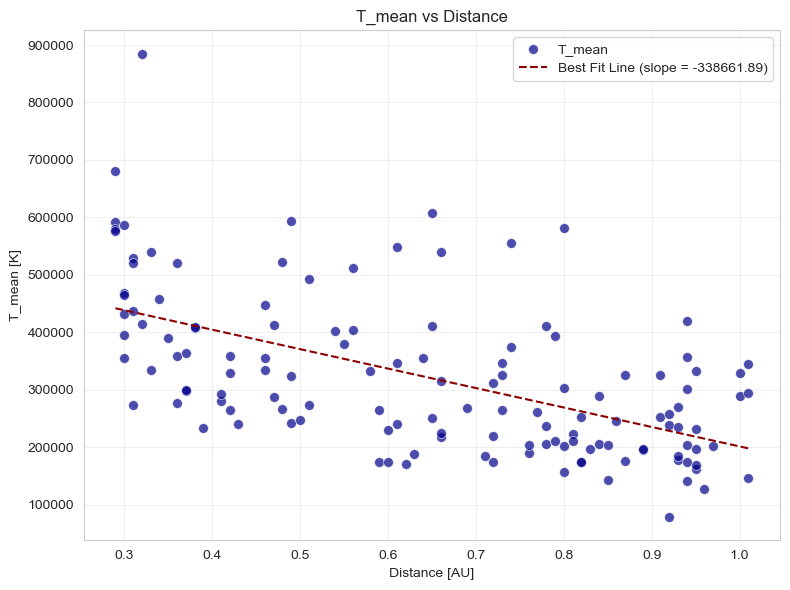

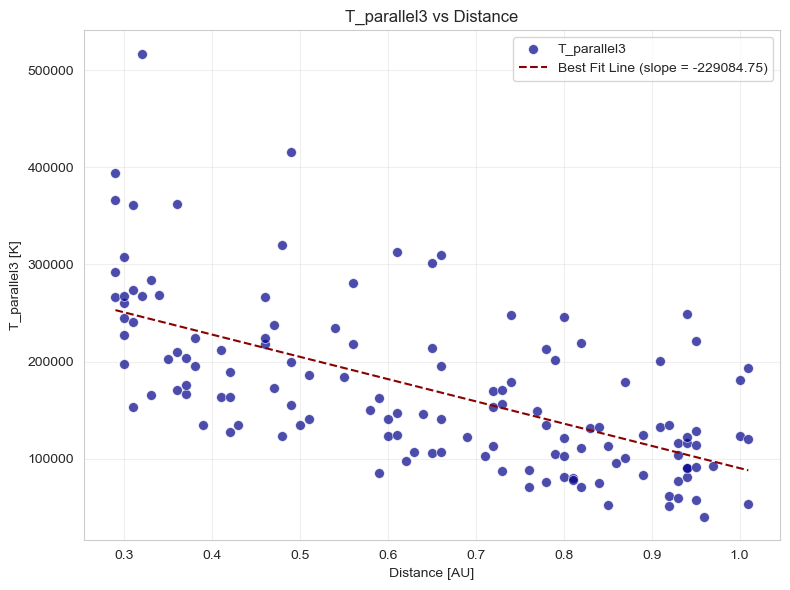

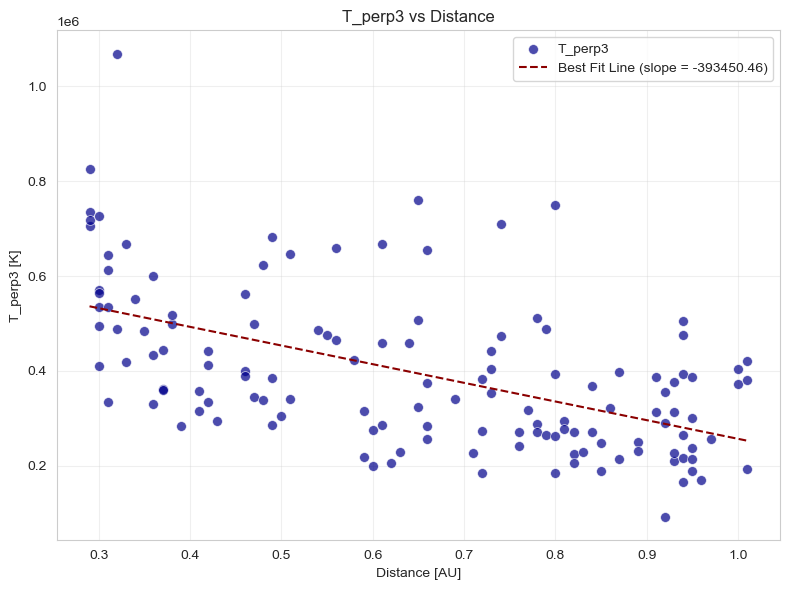

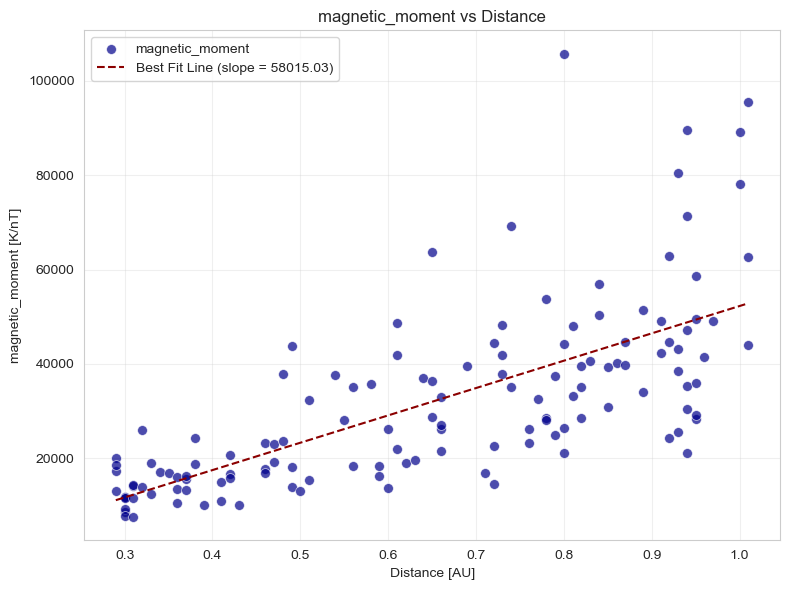

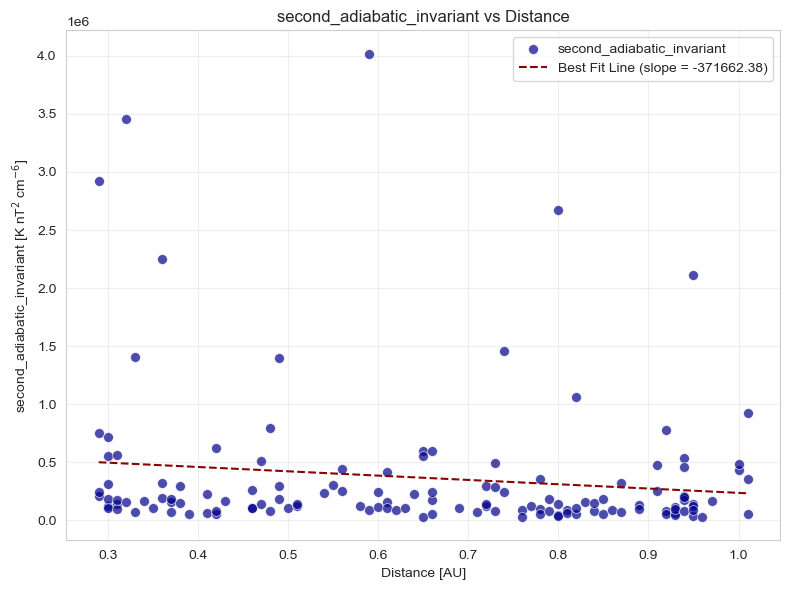

...

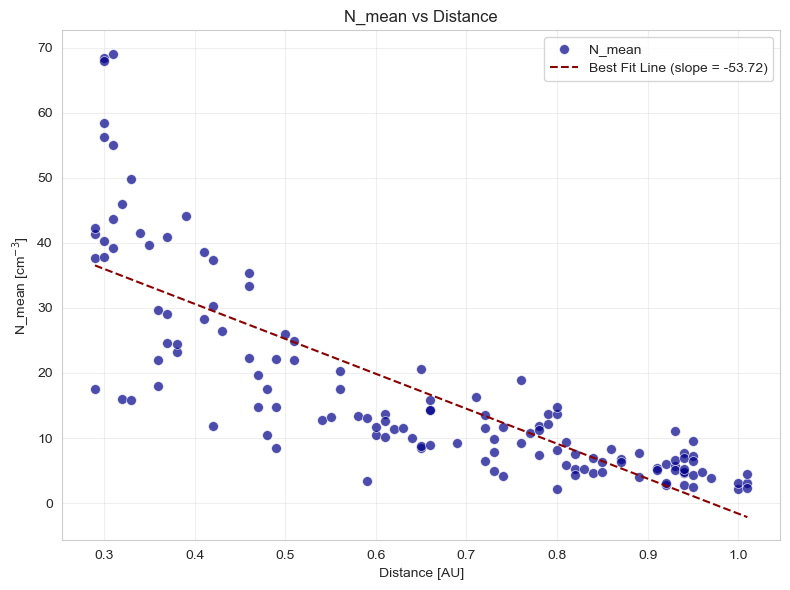

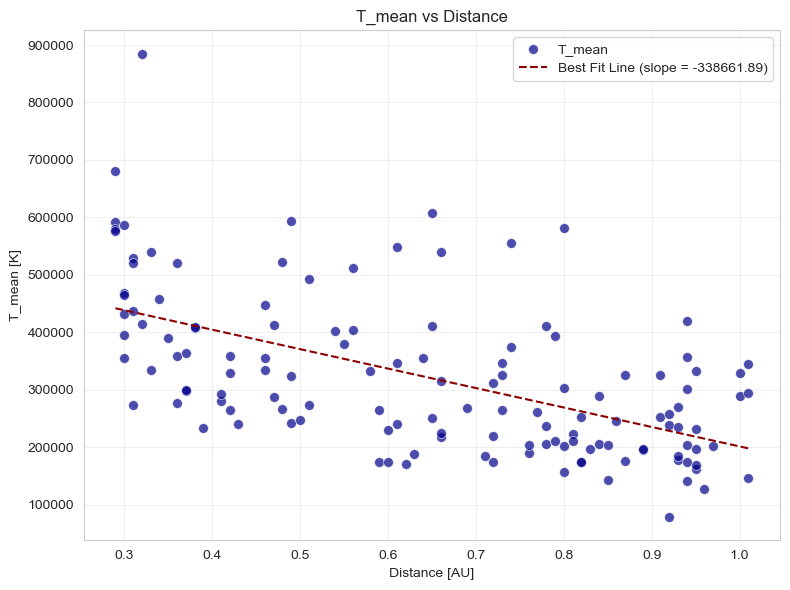

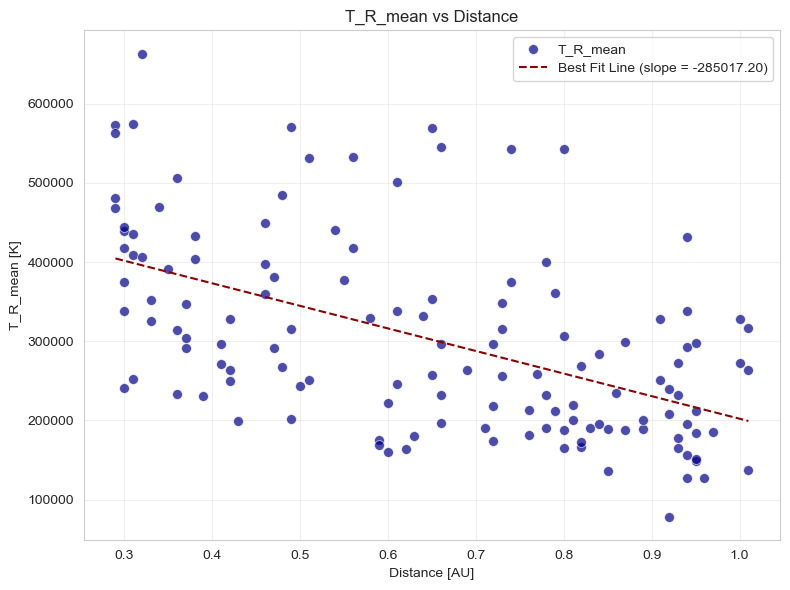

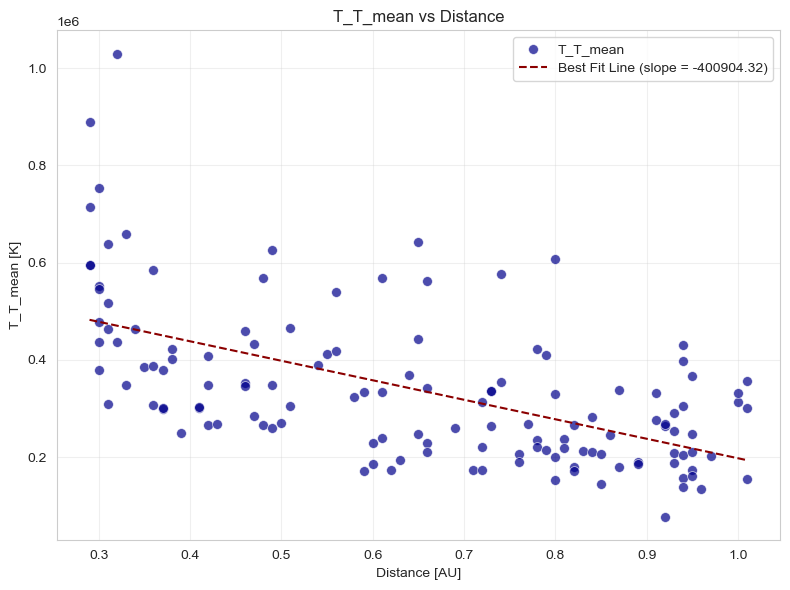

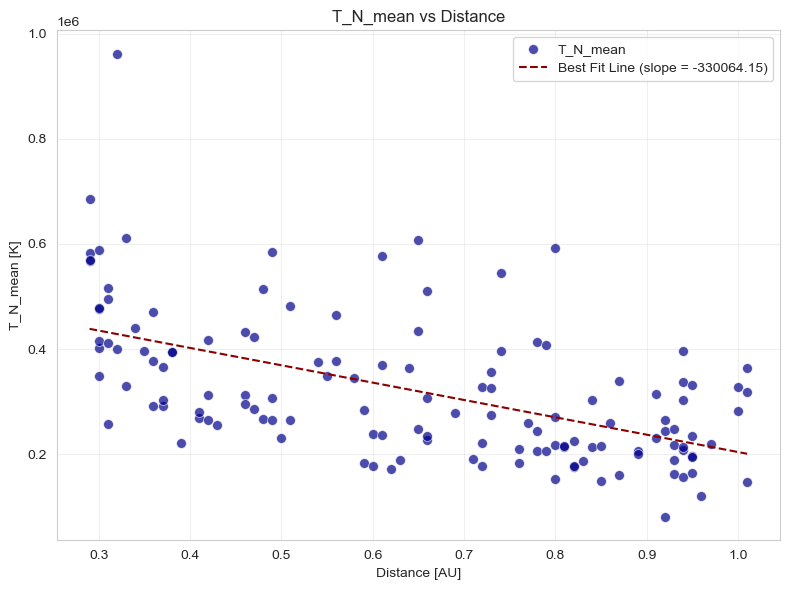

In [276]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import linregress


# Define the quantities to plot
quantities = [
    'T_mean','T_parallel3', 'T_perp3','magnetic_moment',
    'second_adiabatic_invariant', '|B|_mean',
    "N_mean",'T_mean','T_R_mean','T_T_mean','T_N_mean'
]

# ---- Units for these quantities ----
UNITS_CALC = {
    'Distance_mean': 'AU',

    # Temperatures
    'T_mean': 'K',
    'T_R_mean': 'K', 'T_T_mean': 'K', 'T_N_mean': 'K',
    'T_parallel3': 'K', 'T_perp3': 'K',

    # Plasma / field
    'N_mean': r'cm$^{-3}$',
    '|B|_mean': 'nT',

    # Invariants
    'magnetic_moment': 'K/nT',
    'second_adiabatic_invariant': r'K nT$^{2}$ cm$^{-6}$'
}


# Loop through each quantity and generate a separate plot
for quantity in quantities:
    # Extract x (Distance) and y (current quantity)
    x = mean_values_df_with_calcs['Distance_mean'].values
    y = mean_values_df_with_calcs[quantity].values

    # Filter out NaN and infinite values
    mask = np.isfinite(x) & np.isfinite(y)
    x = x[mask]
    y = y[mask]

    if len(x) < 2:
        continue

    # -------- SORT BY x FOR NICE PLOTTING --------
    sort_idx = np.argsort(x)
    x = x[sort_idx]
    y = y[sort_idx]

    # Perform linear regression
    slope, intercept, _, _, _ = linregress(x, y)
    best_fit_line = slope * x + intercept

    # Create the plot
    plt.figure(figsize=(8,6))
    sns.scatterplot(x=x, y=y, s=50, alpha=0.7, color='darkblue', label=quantity)
    plt.plot(x, best_fit_line,
             color='darkred', linestyle='--',
             label=f'Best Fit Line (slope = {slope:.2f})')

    plt.title(f'{quantity} vs Distance')
    plt.xlabel('Distance [AU]')
    plt.ylabel(f"{quantity} [{UNITS_CALC.get(quantity, '')}]")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

    # Show the plot
    plt.show()


T_mean


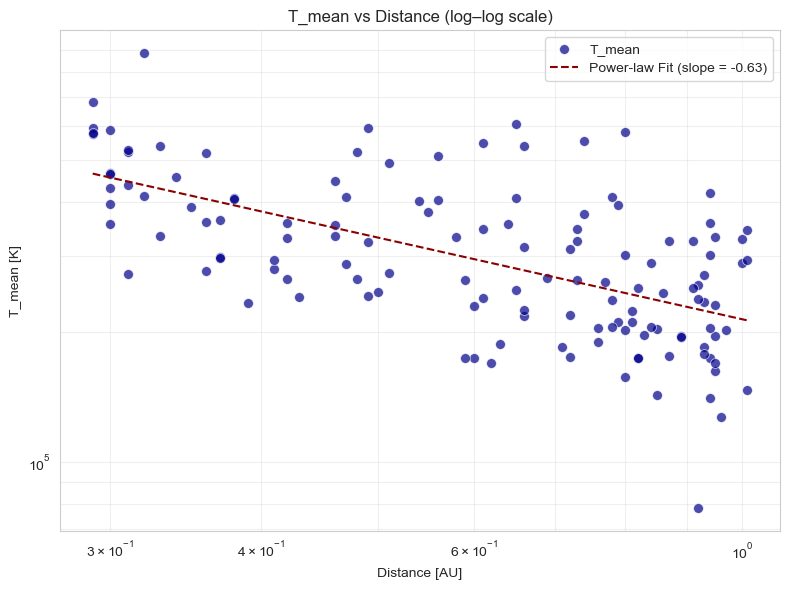

T_parallel3


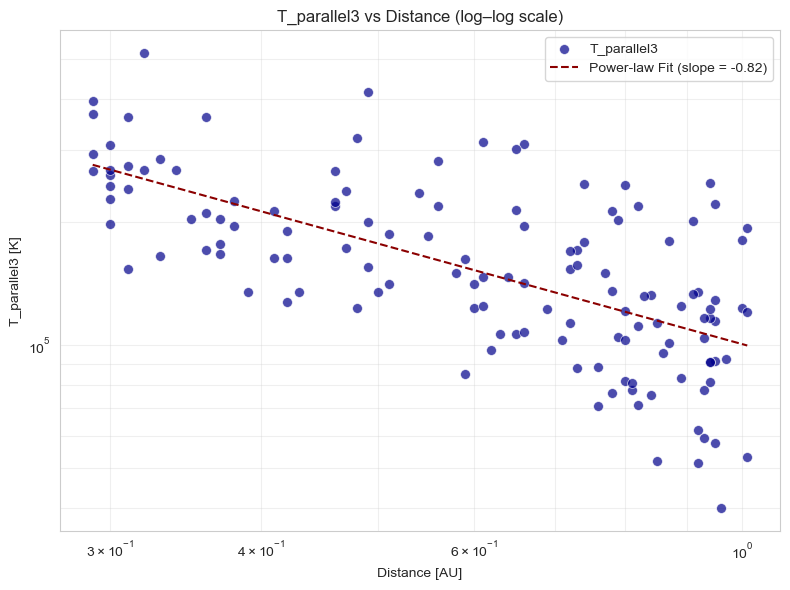

T_perp3


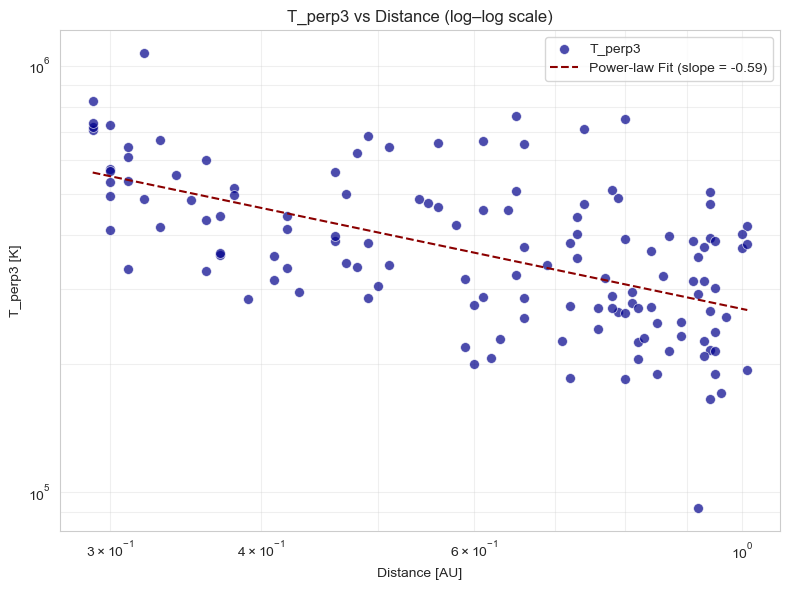

magnetic_moment


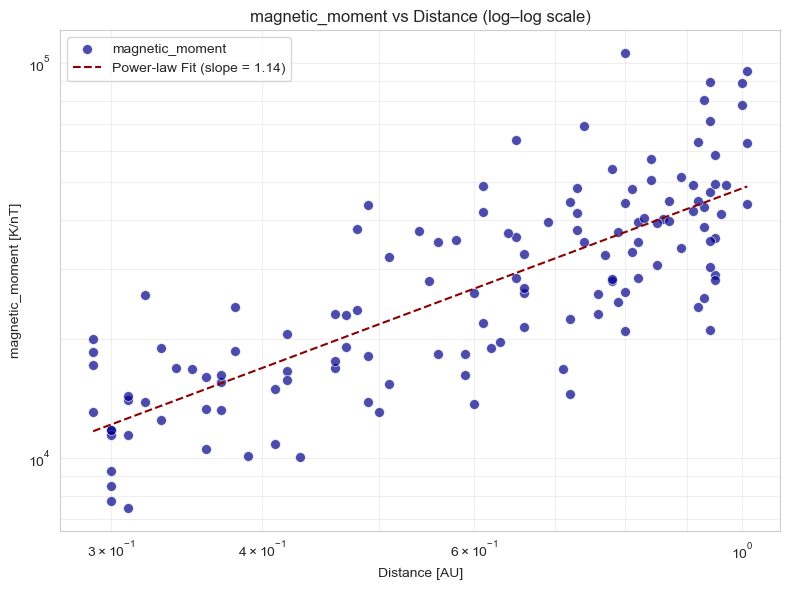

second_adiabatic_invariant


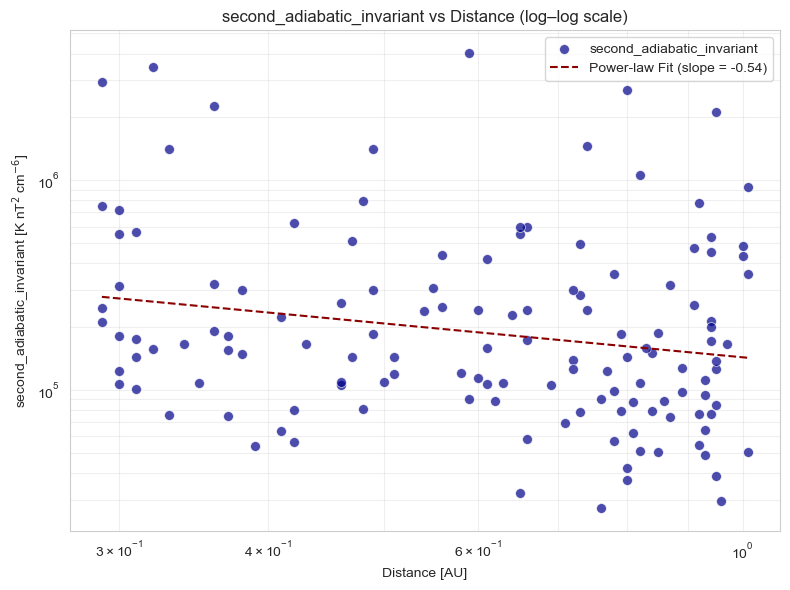

|B|_mean


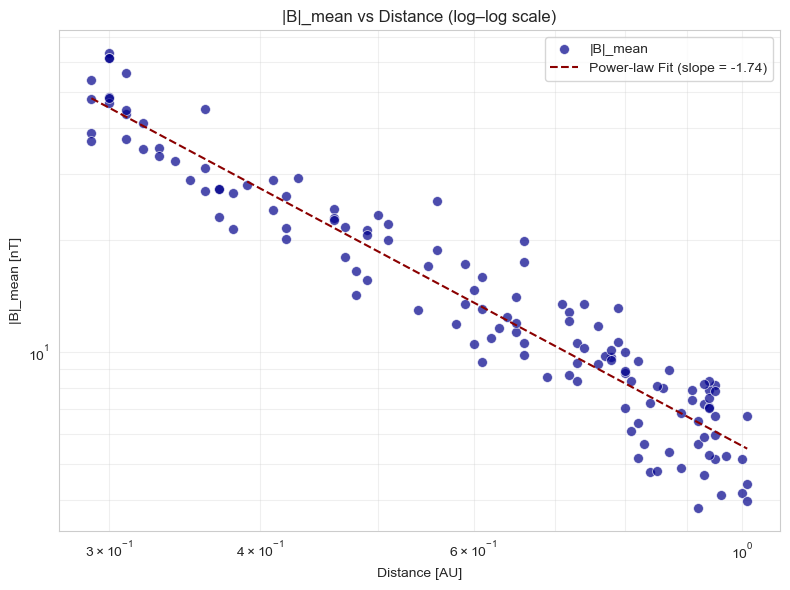

N_mean


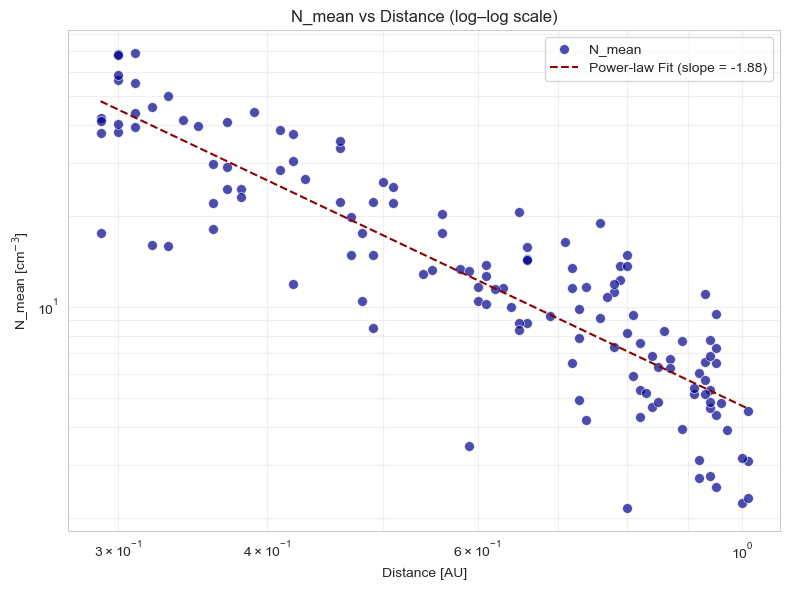

T_mean


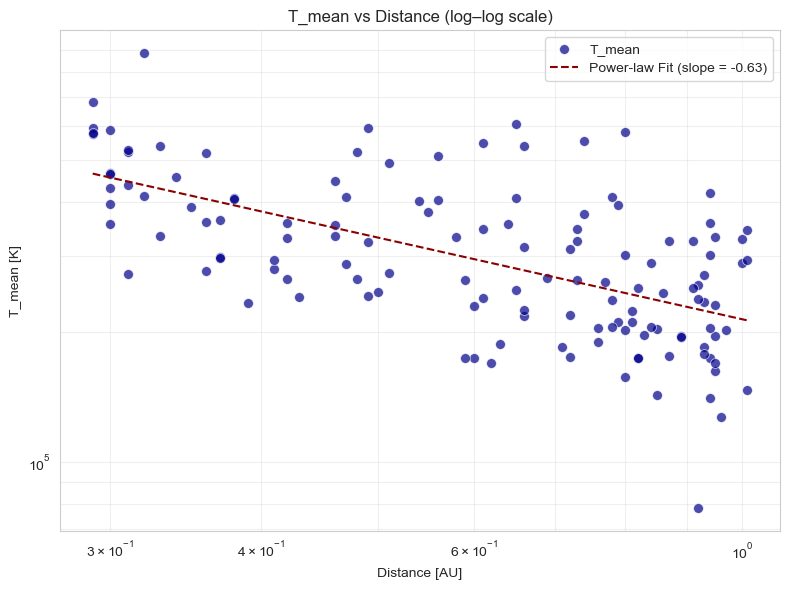

T_R_mean


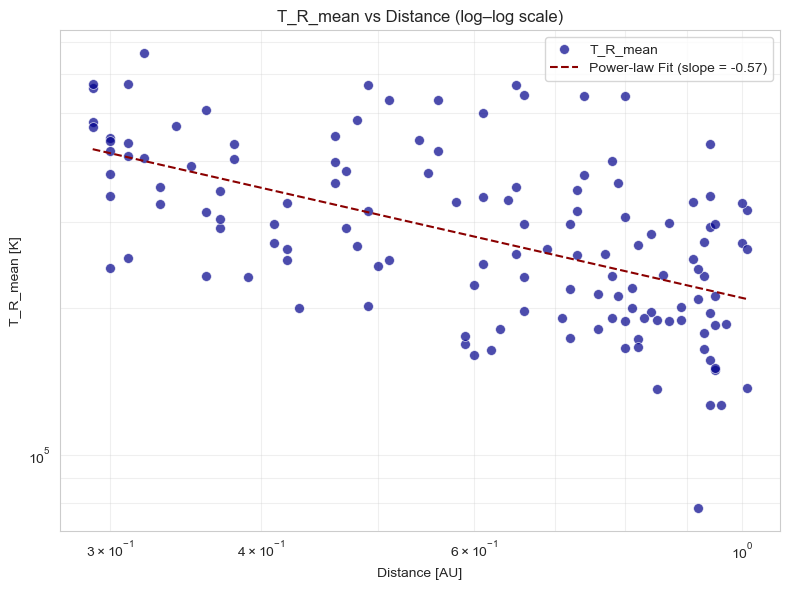

T_T_mean


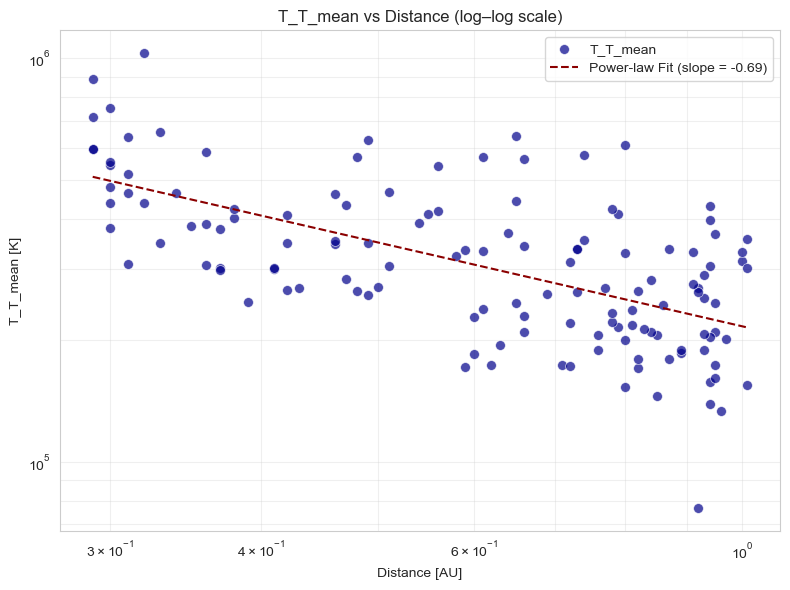

T_N_mean


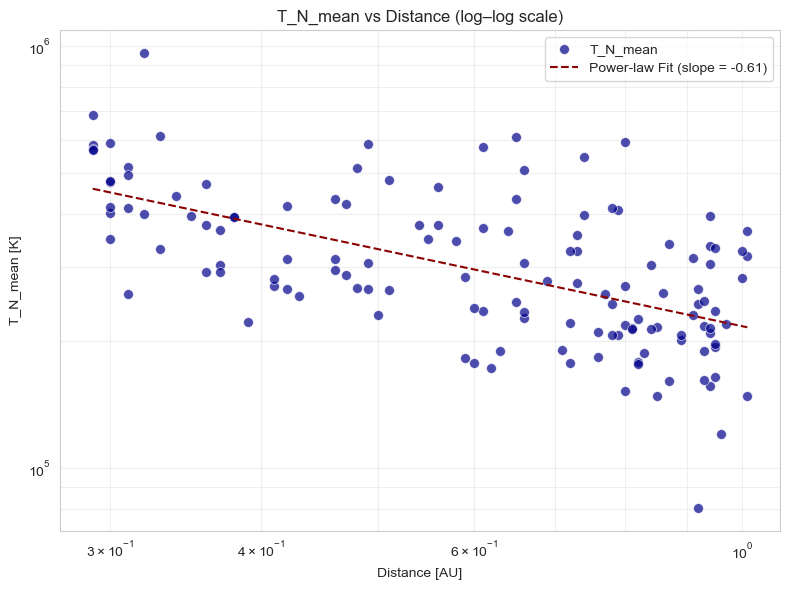

In [277]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import linregress

# Quantities to plot (log–log + power-law fit)
quantities = [
    'T_mean','T_parallel3', 'T_perp3',
    'magnetic_moment','second_adiabatic_invariant',
    '|B|_mean', "N_mean",
    'T_mean','T_R_mean','T_T_mean','T_N_mean'
]

# (optional) units dict if you want proper y-labels
UNITS_CALC = {
    'Distance_mean': 'AU',
    'T_mean': 'K',
    'T_R_mean': 'K', 'T_T_mean': 'K', 'T_N_mean': 'K',
    'T_parallel3': 'K', 'T_perp3': 'K',
    'N_mean': r'cm$^{-3}$',
    '|B|_mean': 'nT',
    'magnetic_moment': 'K/nT',
    'second_adiabatic_invariant': r'K nT$^{2}$ cm$^{-6}$'
}

for quantity in quantities:
    print(quantity)

    # original (physical) values
    x = mean_values_df_with_calcs['Distance_mean'].values
    y = mean_values_df_with_calcs[quantity].values

    # keep only positive & finite for log10
    mask = (x > 0) & (y > 0) & np.isfinite(x) & np.isfinite(y)
    x = x[mask]
    y = y[mask]

    if len(x) < 2:
        continue

    # ---- linear fit in log10 space (power-law) ----
    logx = np.log10(x)
    logy = np.log10(y)

    slope, intercept, _, _, _ = linregress(logx, logy)
    # y = 10^intercept * x^slope
    x_fit = np.logspace(np.log10(x.min()), np.log10(x.max()), 200)
    y_fit = 10**intercept * x_fit**slope

    # ---- plot: original values, log–log axes ----
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=x, y=y, s=50, alpha=0.7,color='darkblue', label=quantity)
    plt.plot(x_fit, y_fit, color='darkred', linestyle='--',
             label=f'Power-law Fit (slope = {slope:.2f})')

    plt.xscale('log')
    plt.yscale('log')

    plt.title(f'{quantity} vs Distance (log–log scale)')
    plt.xlabel('Distance [AU]')
    ylabel = f"{quantity} [{UNITS_CALC.get(quantity, '')}]" if quantity in UNITS_CALC else quantity
    plt.ylabel(ylabel)
    plt.legend()
    plt.grid(True, which='both', alpha=0.3)
    plt.tight_layout()
    plt.show()


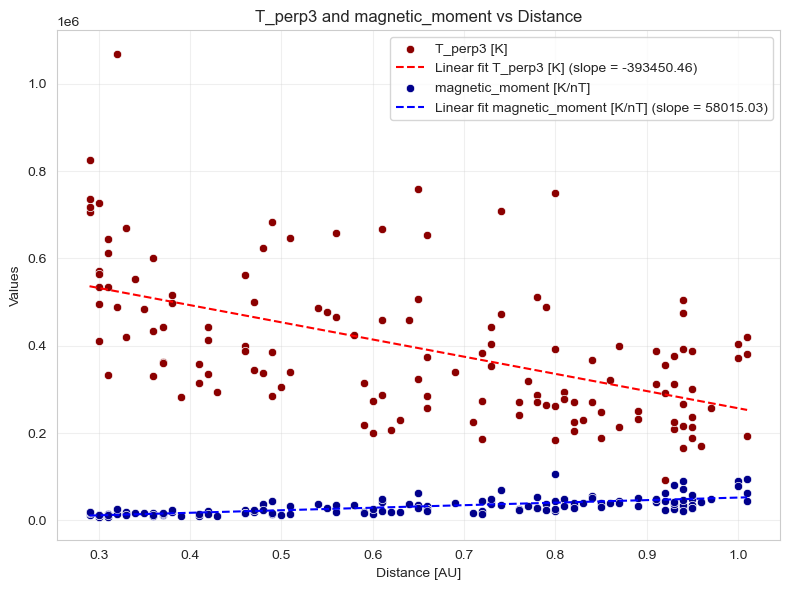

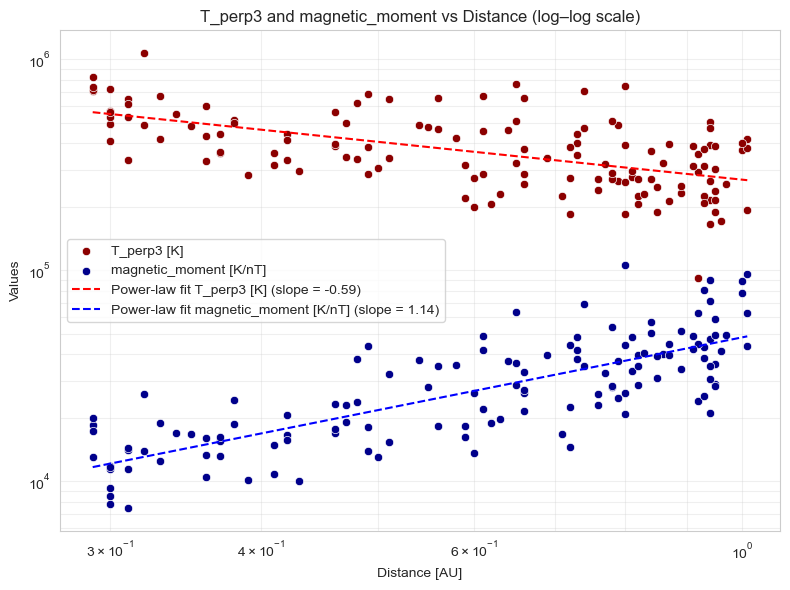

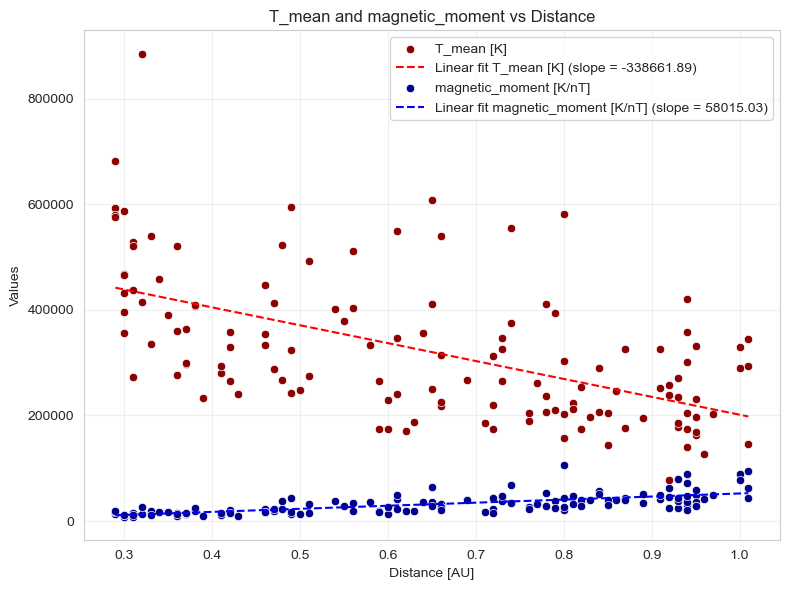

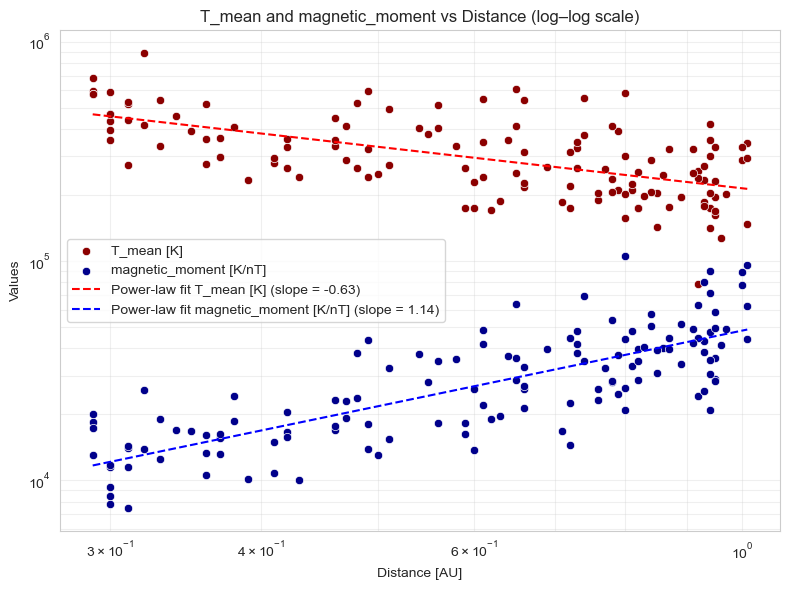

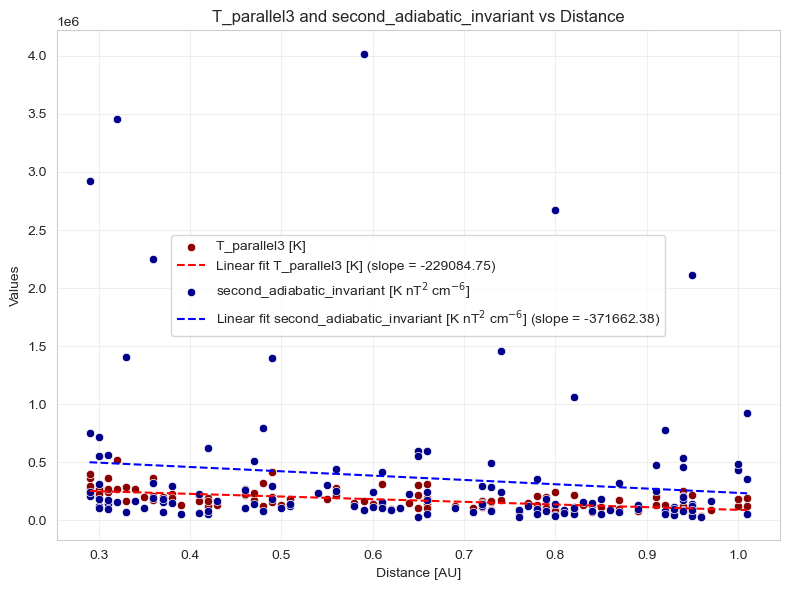

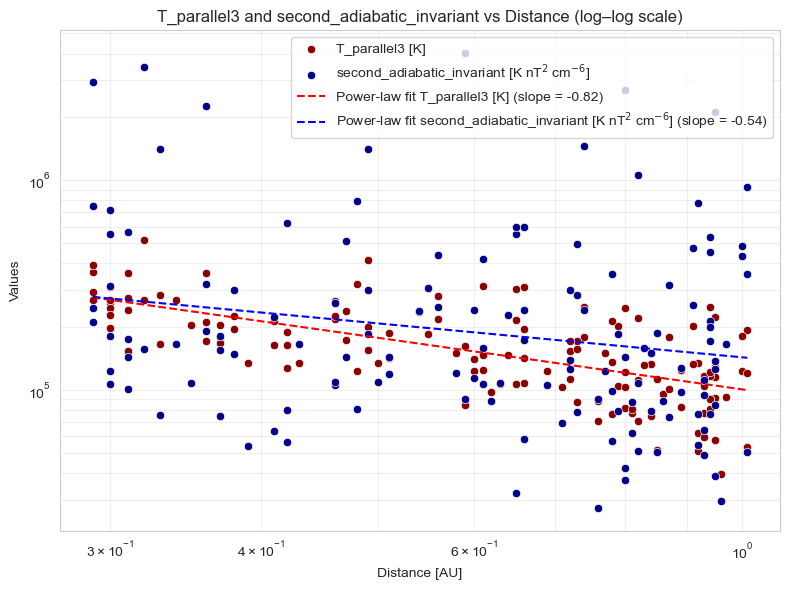

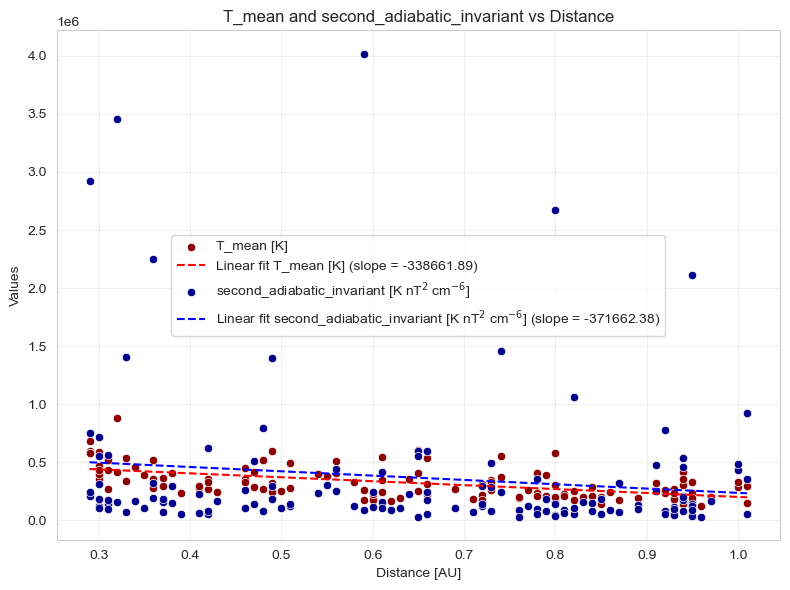

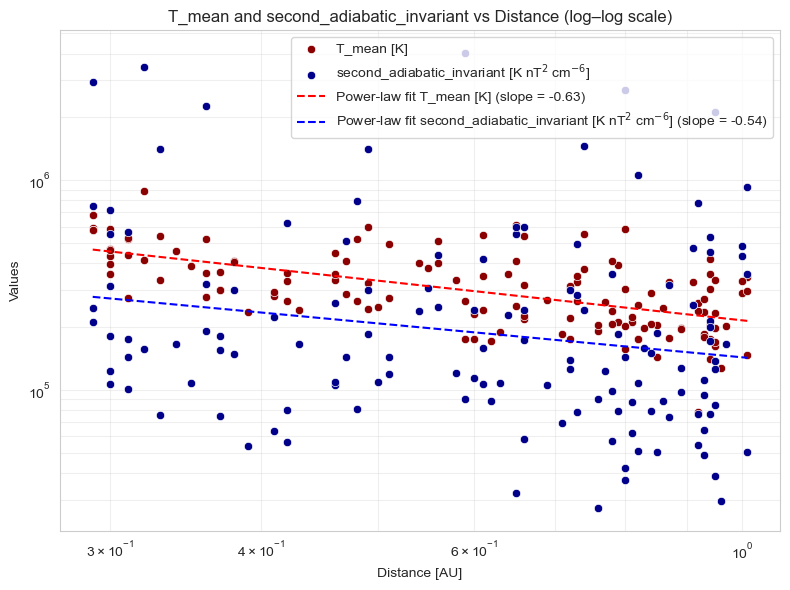

In [278]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import linregress

# ---- Units for these quantities ----
UNITS_ai = {
    'Distance_mean': 'AU',

    # Temperatures
    'T_mean': 'K',
    'T_R_mean': 'K', 'T_T_mean': 'K', 'T_N_mean': 'K',
    'T_parallel3': 'K', 'T_perp3': 'K',

    # Plasma / field
    'N_mean': r'cm$^{-3}$',
    '|B|_mean': 'nT',

    # Invariants (adjust if you used different definitions)
    'magnetic_moment': 'K/nT',                 # T_perp / B
    'second_adiabatic_invariant': r'K nT$^{2}$ cm$^{-6}$'  # T_parallel * B^2 / N^2
}


def plot_2_ys(x, y1, y2, label_1, label_2, title_base, xlabel, ylabel):
    """
    Make TWO plots:
    1) Linear axes + linear fits for y1, y2
    2) Log–log axes + power-law fits for y1, y2
    """

    x = np.asarray(x)
    y1 = np.asarray(y1)
    y2 = np.asarray(y2)

    # =========================================================
    # 1) LINEAR PLOT + LINEAR FITS (WITH SORTING)
    # =========================================================
    mask1_lin = np.isfinite(x) & np.isfinite(y1)
    mask2_lin = np.isfinite(x) & np.isfinite(y2)

    x1_lin, y1_lin = x[mask1_lin], y1[mask1_lin]
    x2_lin, y2_lin = x[mask2_lin], y2[mask2_lin]

    if len(x1_lin) < 2 or len(x2_lin) < 2:
        return

    # Linear regressions
    slope1, intercept1, _, _, _ = linregress(x1_lin, y1_lin)
    slope2, intercept2, _, _, _ = linregress(x2_lin, y2_lin)

    # Sort for plotting
    idx1 = np.argsort(x1_lin)
    idx2 = np.argsort(x2_lin)

    x1_sorted, y1_sorted = x1_lin[idx1], y1_lin[idx1]
    x2_sorted, y2_sorted = x2_lin[idx2], y2_lin[idx2]

    y1_fit = slope1 * x1_sorted + intercept1
    y2_fit = slope2 * x2_sorted + intercept2

    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=x1_sorted, y=y1_sorted, label=label_1, color='darkred')
    plt.plot(x1_sorted, y1_fit, 'r--',
             label=f'Linear fit {label_1} (slope = {slope1:.2f})')

    sns.scatterplot(x=x2_sorted, y=y2_sorted, label=label_2, color='darkblue')
    plt.plot(x2_sorted, y2_fit, 'b--',
             label=f'Linear fit {label_2} (slope = {slope2:.2f})')

    plt.title(title_base)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    # =========================================================
    # 2) LOG–LOG PLOT + POWER-LAW FITS (WITH SORTING)
    # =========================================================
    mask1_log = (x > 0) & (y1 > 0) & np.isfinite(x) & np.isfinite(y1)
    mask2_log = (x > 0) & (y2 > 0) & np.isfinite(x) & np.isfinite(y2)

    x1_log, y1_log = x[mask1_log], y1[mask1_log]
    x2_log, y2_log = x[mask2_log], y2[mask2_log]

    if len(x1_log) < 2 or len(x2_log) < 2:
        return

    logx1, logy1 = np.log10(x1_log), np.log10(y1_log)
    logx2, logy2 = np.log10(x2_log), np.log10(y2_log)

    slope1_p, intercept1_p, _, _, _ = linregress(logx1, logy1)
    slope2_p, intercept2_p, _, _, _ = linregress(logx2, logy2)

    # Create sorted x-grid for smooth power-law lines
    x_min = min(x1_log.min(), x2_log.min())
    x_max = max(x1_log.max(), x2_log.max())
    x_fit_log = np.logspace(np.log10(x_min), np.log10(x_max), 300)

    y1_fit_log = 10**intercept1_p * x_fit_log**slope1_p
    y2_fit_log = 10**intercept2_p * x_fit_log**slope2_p

    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=x1_log, y=y1_log, label=label_1, color='darkred')
    sns.scatterplot(x=x2_log, y=y2_log, label=label_2, color='darkblue')

    plt.plot(x_fit_log, y1_fit_log, 'r--',
             label=f'Power-law fit {label_1} (slope = {slope1_p:.2f})')
    plt.plot(x_fit_log, y2_fit_log, 'b--',
             label=f'Power-law fit {label_2} (slope = {slope2_p:.2f})')

    plt.xscale('log')
    plt.yscale('log')

    plt.title(title_base + " (log–log scale)")
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend()
    plt.grid(True, which='both', alpha=0.3)
    plt.tight_layout()
    plt.show()


# ---------------- CALLS ----------------

x = mean_values_df_with_calcs['Distance_mean']

# 1) T_perp3 vs magnetic_moment
y1 = mean_values_df_with_calcs['T_perp3']
y2 = mean_values_df_with_calcs['magnetic_moment']
plot_2_ys(
    x, y1, y2,
    'T_perp3 [K]', 'magnetic_moment [K/nT]',
    "T_perp3 and magnetic_moment vs Distance",
    'Distance [AU]', 'Values'
)

# 2) T_mean vs magnetic_moment
y1 = mean_values_df_with_calcs['T_mean']
y2 = mean_values_df_with_calcs['magnetic_moment']
plot_2_ys(x, y1, y2,'T_mean [K]', 'magnetic_moment [K/nT]',"T_mean and magnetic_moment vs Distance",'Distance [AU]', 'Values')

# 3) T_parallel3 vs second_adiabatic_invariant
y1 = mean_values_df_with_calcs['T_parallel3']
y2 = mean_values_df_with_calcs['second_adiabatic_invariant']
plot_2_ys(x, y1, y2,'T_parallel3 [K]', 'second_adiabatic_invariant [K nT$^{2}$ cm$^{-6}$]',"T_parallel3 and second_adiabatic_invariant vs Distance", 'Distance [AU]', 'Values')

# 4) T_mean vs second_adiabatic_invariant
y1 = mean_values_df_with_calcs['T_mean']
y2 = mean_values_df_with_calcs['second_adiabatic_invariant']
plot_2_ys(
    x, y1, y2,
    'T_mean [K]', 'second_adiabatic_invariant [K nT$^{2}$ cm$^{-6}$]',
    "T_mean and second_adiabatic_invariant vs Distance",
    'Distance [AU]', 'Values'
)


# plots with Peroni et al equations

In [279]:
peroni_et_al_df = mean_values_df_with_calcs.copy()

In [280]:
def formula_peroni(m, m_uncertainty, R, R0, power, power_uncertainty):

    value = m * ((R / R0) ** (power))
    all_possible_uncertainties_taken_into_account = [
        (m + m_uncertainty) * ((R / R0) ** (power + power_uncertainty)),
        (m + m_uncertainty) * ((R / R0) ** (power - power_uncertainty)),
        (m - m_uncertainty) * ((R / R0) ** (power + power_uncertainty)),
        (m - m_uncertainty) * ((R / R0) ** (power - power_uncertainty)),
    ]
    # Calculate the formula
    return value, min(all_possible_uncertainties_taken_into_account), max(all_possible_uncertainties_taken_into_account)


peroni_et_al_df[['eq_n', 'eq_n_lower', 'eq_n_upper']] = peroni_et_al_df.apply(lambda row:
    formula_peroni(2.4, 0.1, row['Distance_mean'], 1, -1.96, 0.07), axis=1, result_type="expand")

peroni_et_al_df[['eq_B', 'eq_B_lower', 'eq_B_upper']] = peroni_et_al_df.apply(lambda row:
    formula_peroni(5.7, 0.2, row['Distance_mean'], 1, -1.59, 0.06), axis=1, result_type="expand")

peroni_et_al_df[['eq_BR', 'eq_BR_lower', 'eq_BR_upper']] = peroni_et_al_df.apply(lambda row:
    formula_peroni(3.5, 0.2, row['Distance_mean'], 1, -1.81, 0.08), axis=1, result_type="expand")

peroni_et_al_df[['eq_BT', 'eq_BT_lower', 'eq_BT_upper']] = peroni_et_al_df.apply(lambda row:
     formula_peroni(2.9, 0.2, row['Distance_mean'], 1, -1.21, 0.09), axis=1, result_type="expand")

peroni_et_al_df[['eq_T', 'eq_T_lower', 'eq_T_upper']] = peroni_et_al_df.apply(lambda row:
     formula_peroni(1.9*10**5, 0.1*10**5, row['Distance_mean'], 1, -0.9, 0.1), axis=1, result_type="expand")

peroni_et_al_df[['eq_T_parallel', 'eq_T_parallel_lower', 'eq_T_parallel_upper']] = peroni_et_al_df.apply(lambda row:
     formula_peroni(1.2*10**5, 0.1*10**5, row['Distance_mean'], 1, -0.5, 0.1), axis=1, result_type="expand")

peroni_et_al_df[['eq_T_perp', 'eq_T_perp_lower', 'eq_T_perp_upper']] = peroni_et_al_df.apply(lambda row:
     formula_peroni(2.3*10**5, 0.1*10**5, row['Distance_mean'], 1, -1.0, 0.1), axis=1, result_type="expand")

T_mean


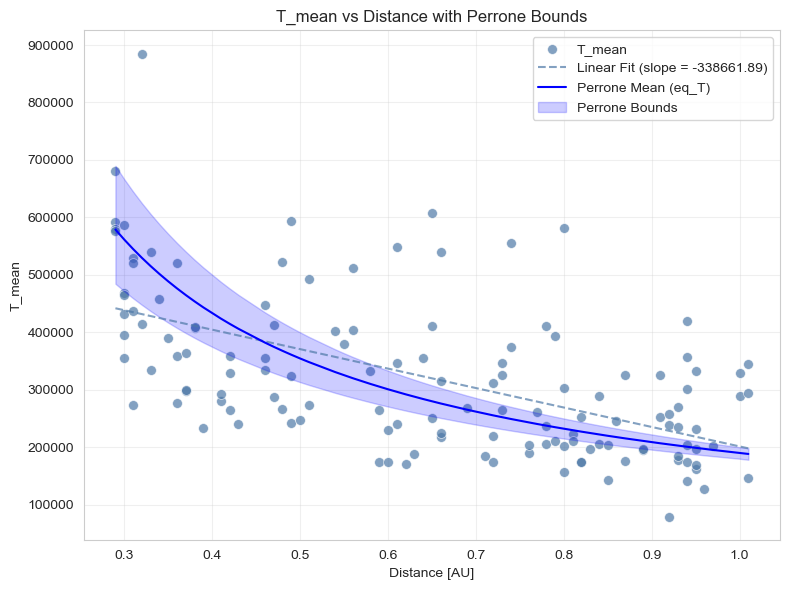

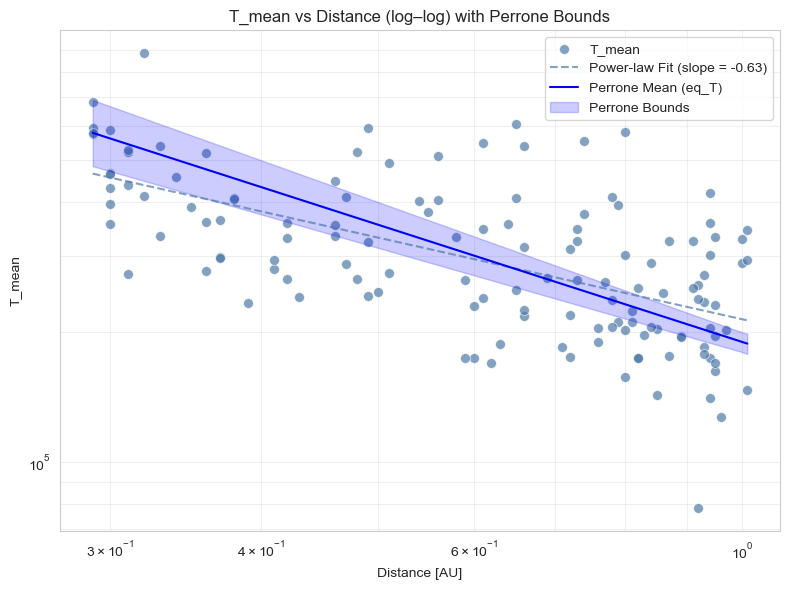

T_parallel3


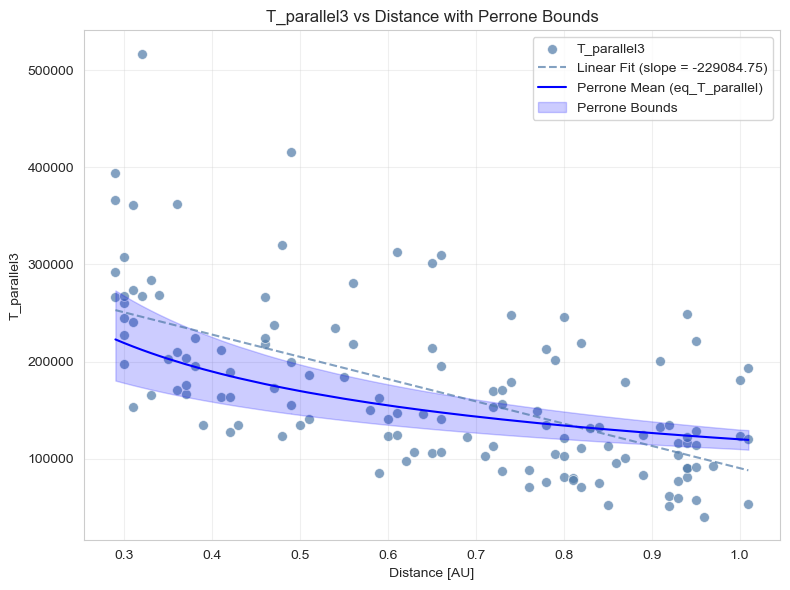

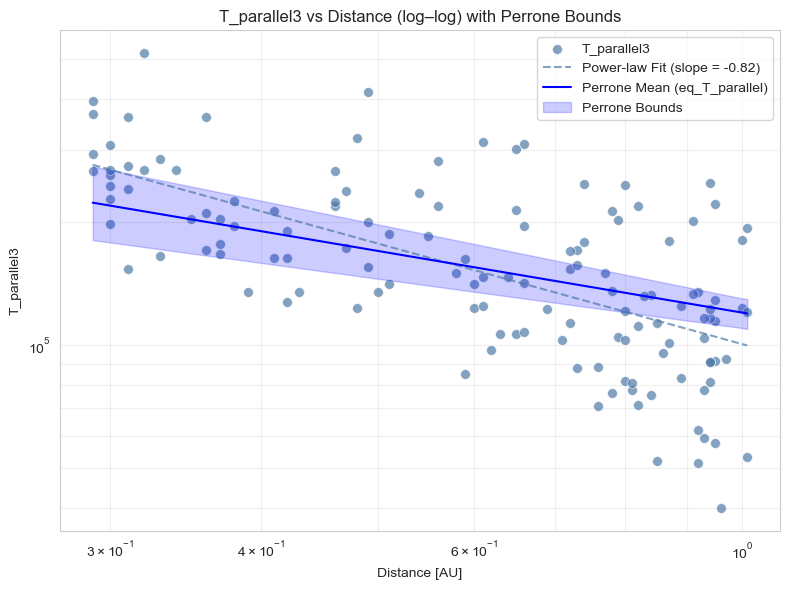

T_perp3


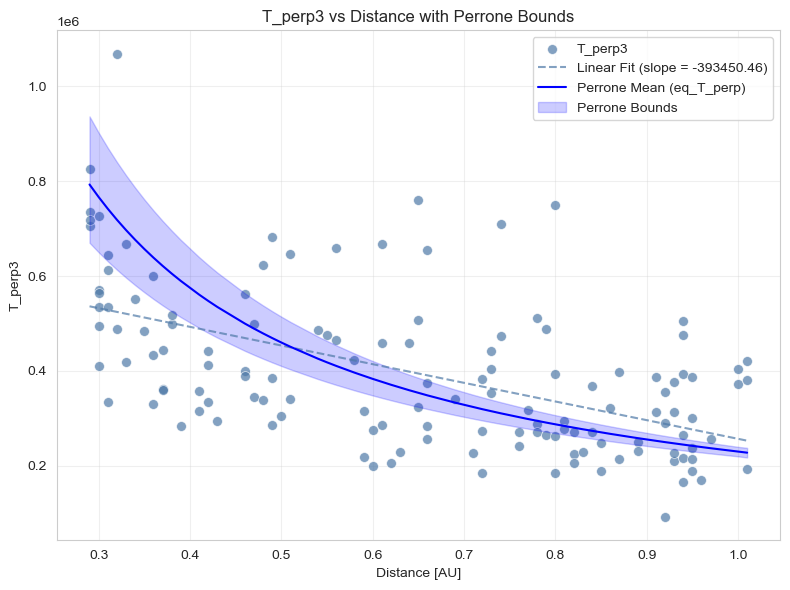

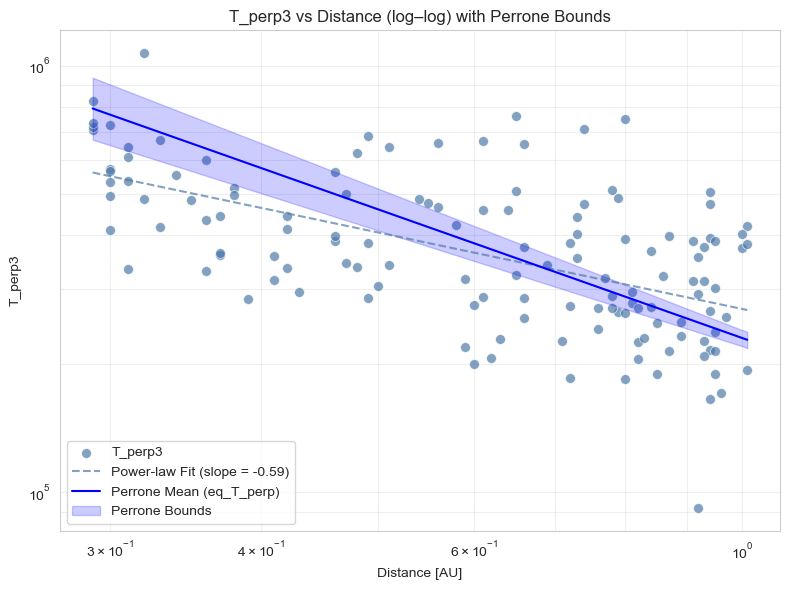

|B|_mean


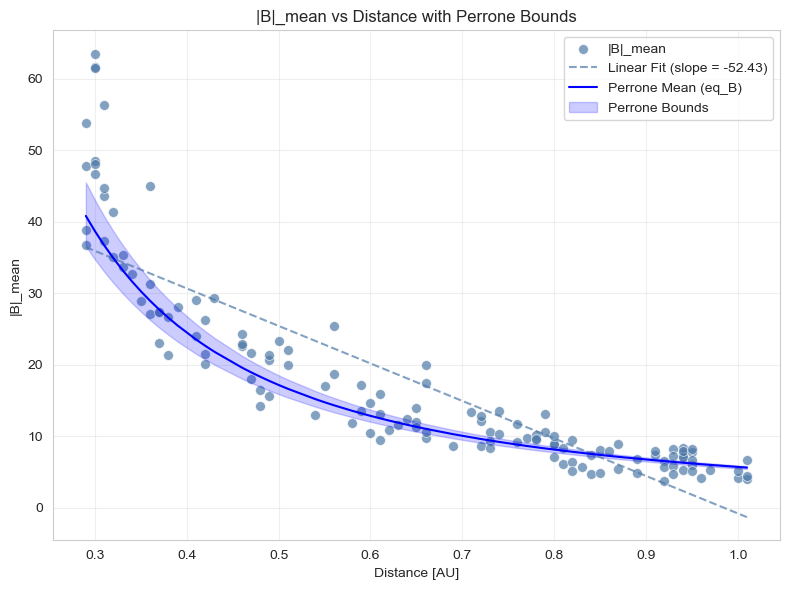

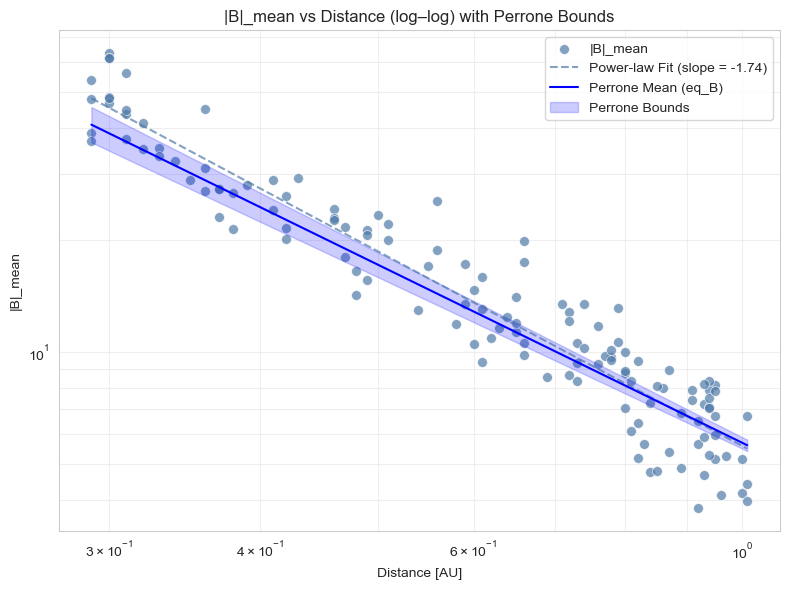

BR_mean


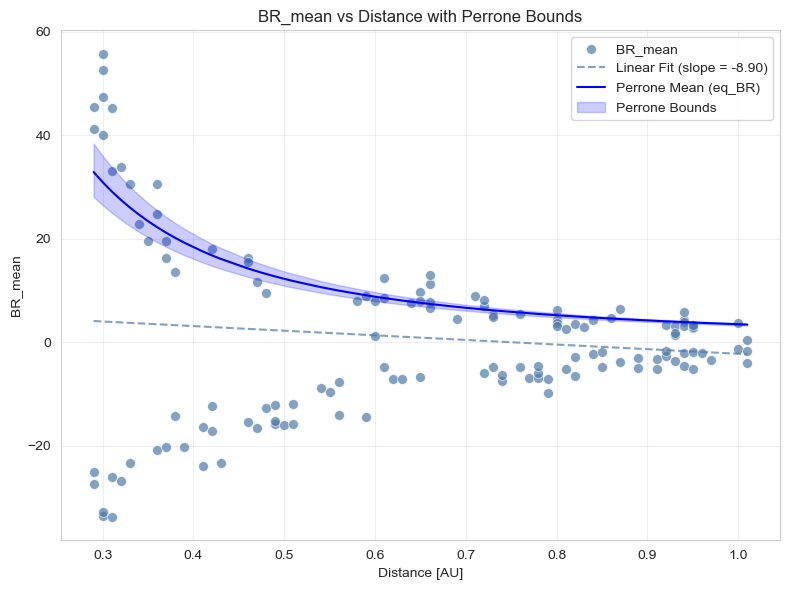

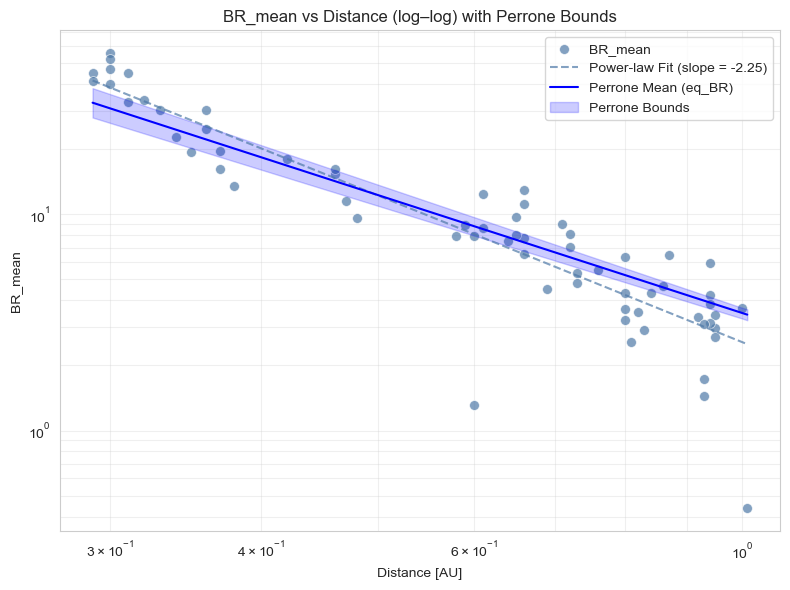

BT_mean


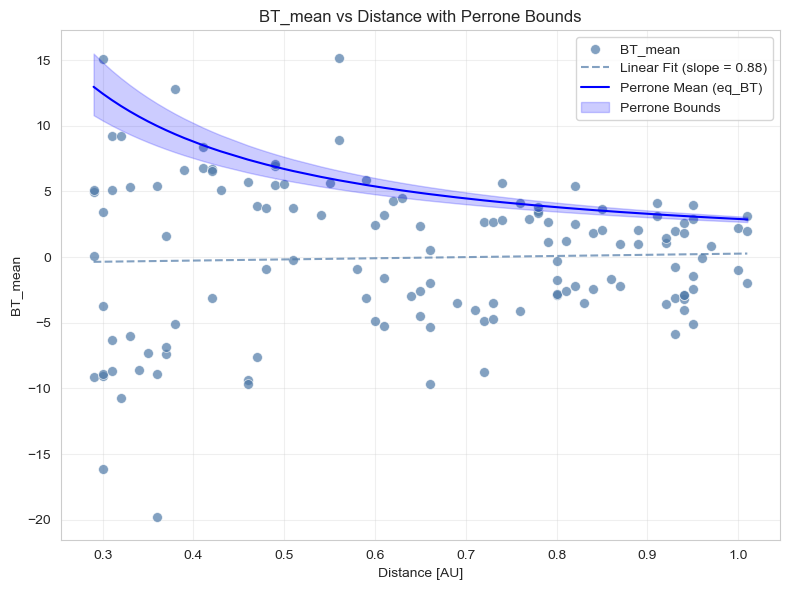

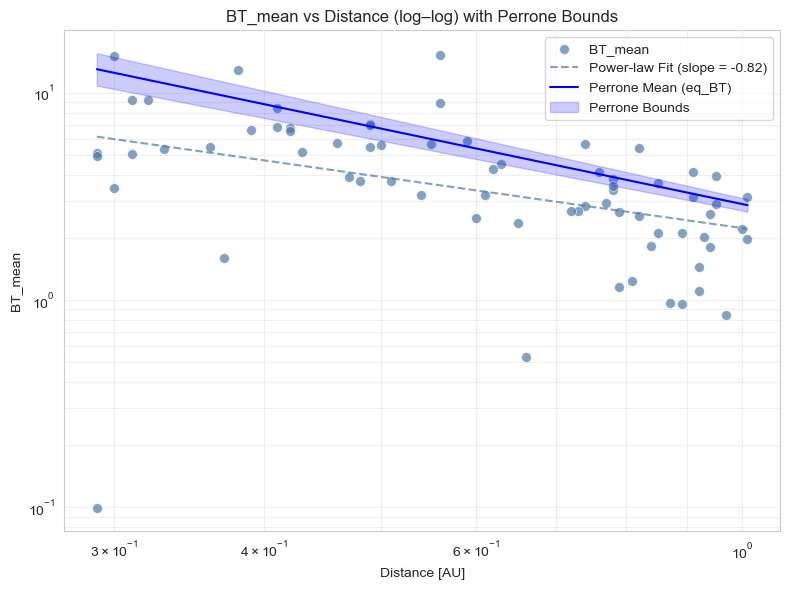

N_mean


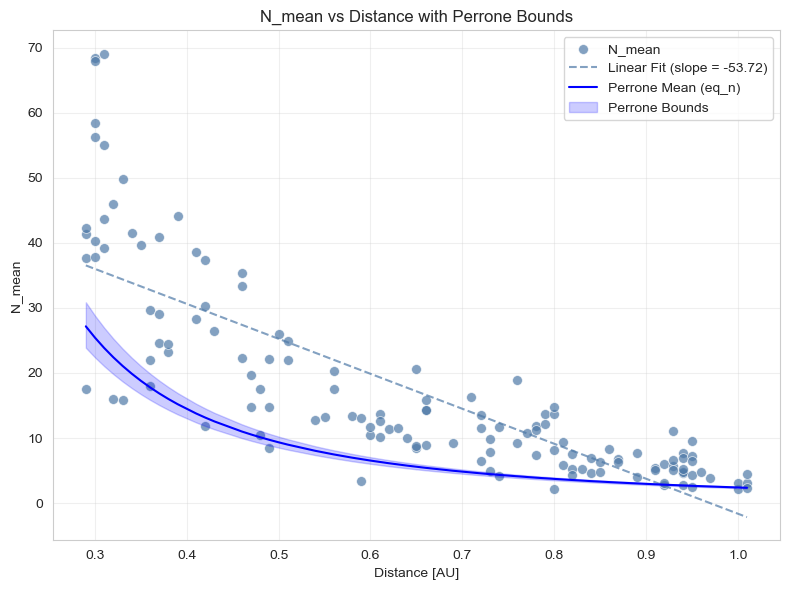

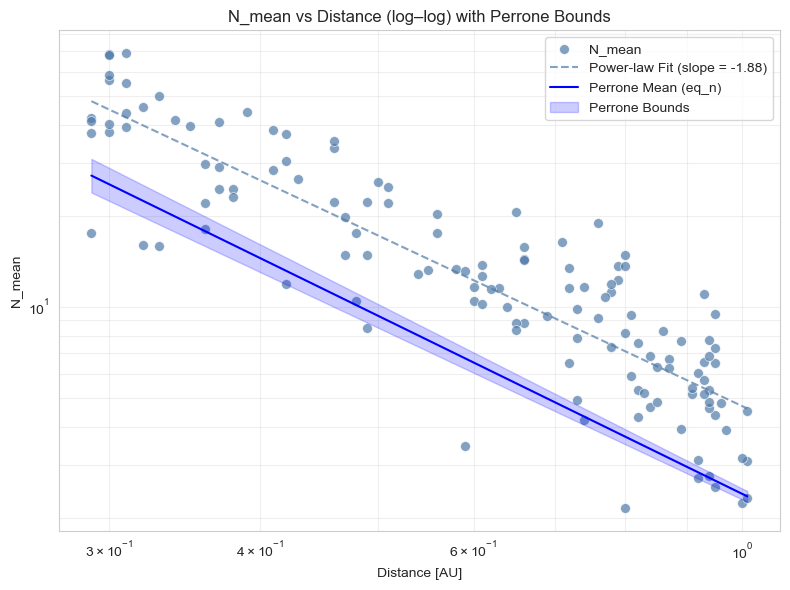

In [281]:

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import linregress

# Define the quantities to plot:
# [data_col, perrone_mean_col, perrone_lower_col, perrone_upper_col]
quantities = [
    ['T_mean',      'eq_T',          'eq_T_lower',          'eq_T_upper'],
    ['T_parallel3', 'eq_T_parallel', 'eq_T_parallel_lower', 'eq_T_parallel_upper'],
    ['T_perp3',     'eq_T_perp',     'eq_T_perp_lower',     'eq_T_perp_upper'],
    ['|B|_mean',    'eq_B',          'eq_B_lower',          'eq_B_upper'],
    ['BR_mean',     'eq_BR',         'eq_BR_lower',         'eq_BR_upper'],
    ['BT_mean',     'eq_BT',         'eq_BT_lower',         'eq_BT_upper'],
    ['N_mean',      'eq_n',          'eq_n_lower',          'eq_n_upper'],
]


for quantity in quantities:
    data_col, eq_col, eq_lower_col, eq_upper_col = quantity
    print(data_col)

    # ------------------- Get data in physical space -------------------
    x = peroni_et_al_df['Distance_mean'].values
    y = peroni_et_al_df[data_col].values
    y_eq = peroni_et_al_df[eq_col].values
    y_lower = peroni_et_al_df[eq_lower_col].values
    y_upper = peroni_et_al_df[eq_upper_col].values

    # ================================================================
    # 1) LINEAR PLOT + LINEAR FIT (data) + Perrone mean & bounds
    # ================================================================
    mask_data_lin = np.isfinite(x) & np.isfinite(y)
    x_data_lin = x[mask_data_lin]
    y_data_lin = y[mask_data_lin]

    if len(x_data_lin) < 2:
        continue

    slope_lin, intercept_lin, _, _, _ = linregress(x_data_lin, y_data_lin)

    # Sort for plotting
    idx_data_lin = np.argsort(x_data_lin)
    x_data_sorted = x_data_lin[idx_data_lin]
    y_data_sorted = y_data_lin[idx_data_lin]
    y_fit_lin = slope_lin * x_data_sorted + intercept_lin

    # Perrone curves: sort them too (they may have NaNs at edges)
    mask_eq_lin = np.isfinite(x) & np.isfinite(y_eq) & np.isfinite(y_lower) & np.isfinite(y_upper)
    x_eq_lin = x[mask_eq_lin]
    y_eq_lin = y_eq[mask_eq_lin]
    y_lower_lin = y_lower[mask_eq_lin]
    y_upper_lin = y_upper[mask_eq_lin]

    idx_eq_lin = np.argsort(x_eq_lin)
    x_eq_sorted = x_eq_lin[idx_eq_lin]
    y_eq_sorted = y_eq_lin[idx_eq_lin]
    y_lower_sorted = y_lower_lin[idx_eq_lin]
    y_upper_sorted = y_upper_lin[idx_eq_lin]

    # --------- Linear figure ---------
    plt.figure(figsize=(8, 6))
    # Data
    sns.scatterplot(x=x_data_sorted, y=y_data_sorted,
                    s=50, alpha=0.7, label=data_col, color='#4E79A7')
    plt.plot(x_data_sorted, y_fit_lin,
             color='#4E79A7', alpha=0.7, linestyle='--',
             linewidth=1.5,
             label=f'Linear Fit (slope = {slope_lin:.2f})')

    # Perrone mean and bounds (physical space)
    plt.plot(x_eq_sorted, y_eq_sorted,
             color='blue', linestyle='-',
             label=f'Perrone Mean ({eq_col})')
    plt.fill_between(x_eq_sorted, y_lower_sorted, y_upper_sorted,
                     color='blue', alpha=0.2, label='Perrone Bounds')

    plt.title(f'{data_col} vs Distance with Perrone Bounds')
    plt.xlabel('Distance [AU]')
    plt.ylabel(data_col)
    plt.legend()
    plt.grid(True, which='both', alpha=0.3)
    plt.tight_layout()
    plt.show()

    # ================================================================
    # 2) LOG–LOG PLOT + POWER-LAW FIT (data) + Perrone mean & bounds
    # ================================================================
    # Require positive & finite for logs
    mask_data_log = (x > 0) & (y > 0) & np.isfinite(x) & np.isfinite(y)
    x_data_log = x[mask_data_log]
    y_data_log = y[mask_data_log]

    if len(x_data_log) < 2:
        continue

    logx = np.log10(x_data_log)
    logy = np.log10(y_data_log)

    slope_pow, intercept_pow, _, _, _ = linregress(logx, logy)
    # Power-law: y = 10^intercept_pow * x^slope_pow
    x_fit_log = np.logspace(np.log10(x_data_log.min()),
                            np.log10(x_data_log.max()), 300)
    y_fit_log = 10**intercept_pow * x_fit_log**slope_pow

    # Perrone curves for log–log: only positive & finite
    mask_eq_log = (x > 0) & (y_eq > 0) & (y_lower > 0) & (y_upper > 0) & \
                  np.isfinite(x) & np.isfinite(y_eq) & np.isfinite(y_lower) & np.isfinite(y_upper)
    x_eq_log = x[mask_eq_log]
    y_eq_log = y_eq[mask_eq_log]
    y_lower_log = y_lower[mask_eq_log]
    y_upper_log = y_upper[mask_eq_log]

    idx_eq_log = np.argsort(x_eq_log)
    x_eq_log_sorted = x_eq_log[idx_eq_log]
    y_eq_log_sorted = y_eq_log[idx_eq_log]
    y_lower_log_sorted = y_lower_log[idx_eq_log]
    y_upper_log_sorted = y_upper_log[idx_eq_log]

    # --------- Log–log figure ---------
    plt.figure(figsize=(8, 6))
    # Data points (physical values)
    sns.scatterplot(x=x_data_log, y=y_data_log,
                    s=50, alpha=0.7, label=data_col, color='#4E79A7')

    # Power-law fit
    plt.plot(x_fit_log, y_fit_log,
             color='#4E79A7', alpha=0.7, linestyle='--',
             linewidth=1.5,
             label=f'Power-law Fit (slope = {slope_pow:.2f})')

    # Perrone mean and bounds (physical, on log axes)
    if len(x_eq_log_sorted) > 0:
        plt.plot(x_eq_log_sorted, y_eq_log_sorted,
                 color='blue', linestyle='-',
                 label=f'Perrone Mean ({eq_col})')
        plt.fill_between(x_eq_log_sorted,
                         y_lower_log_sorted, y_upper_log_sorted,
                         color='blue', alpha=0.2, label='Perrone Bounds')

    plt.xscale('log')
    plt.yscale('log')

    plt.title(f'{data_col} vs Distance (log–log) with Perrone Bounds')
    plt.xlabel('Distance [AU]')
    plt.ylabel(data_col)
    plt.legend()
    plt.grid(True, which='both', alpha=0.3)
    plt.tight_layout()
    plt.show()


# scatter plots for sphere relation 

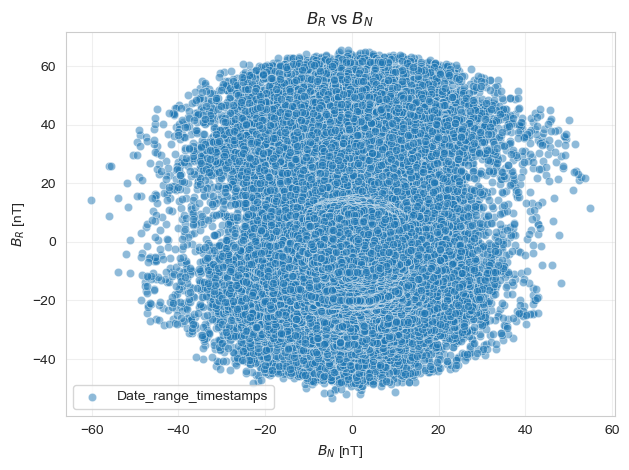

,BR,BT,BN,Distance,name,|B|,|B_transv|
EPOCH,,,,,,,
2021-08-21 00:08:29.999999776,-13.179045,14.118096,0.086142,0.65,Date_Range1,19.313604,14.118360
2021-08-21 00:09:29.999996200,-13.549139,13.454594,1.530531,0.65,Date_Range1,19.155882,13.541368
2021-08-21 00:10:30.000002682,-14.307286,13.455720,2.443442,0.65,Date_Range1,19.792049,13.675775
2021-08-21 00:11:29.999999105,-12.954463,10.547703,9.633520,0.65,Date_Range1,19.284109,14.284913
2021-08-21 00:12:29.999995529,-14.416012,9.818862,8.968830,0.65,Date_Range1,19.613041,13.298494
...,...,...,...,...,...,...,...
2025-05-14 23:55:29.999995976,-7.750103,5.254740,6.910071,0.74,Date_Range134,11.637245,8.681093
2025-05-14 23:56:30.000002458,-8.614252,5.152640,6.119097,0.74,Date_Range134,11.755781,7.999566
2025-05-14 23:57:29.999998882,-9.546777,3.361250,6.075851,0.74,Date_Range134,11.804869,6.943628


In [282]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import linregress

# ---- Units for these quantities ----
UNITS = {'BR': 'nT', 'BT': 'nT', 'BN': 'nT'}


# ----------------------------------------------------
# Main plotting function
# ----------------------------------------------------

x = MAG_df['BN'].values
y = MAG_df['BR'].values

# =========================================================
# 1) LINEAR PLOT
# =========================================================
mask_lin = np.isfinite(x) & np.isfinite(y)


x_lin = x[mask_lin]
y_lin = y[mask_lin]

plt.figure()
sns.scatterplot(x=x_lin, y=y_lin, label="Date_range_timestamps",alpha=0.5)


plt.title('$B_R$ vs $B_N$')
plt.xlabel(f"$B_N$ [{UNITS['BN']}]")
plt.ylabel(f"$B_R$ [{UNITS['BR']}]")
plt.grid(True, which='both', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# # =========================================================
# # 2) LOG–LOG PLOT
# # =========================================================
# 
# mask_log = (x > 0) & (y > 0) & np.isfinite(x) & np.isfinite(y)
# # if mask_log.sum() < 2:
# #     continue
# 
# x_log = x[mask_log]
# y_log = y[mask_log]
# 
# logx = np.log10(x_log)
# logy = np.log10(y_log)
# 
# 
# # x_fit_log = np.logspace(np.log10(x_log.min()),
# #                         np.log10(x_log.max()), 200)
# # y_fit_log = 10**intercept_pow * x_fit_log**slope_pow
# 
# plt.figure()
# sns.scatterplot(x=x_log, y=y_log, label=col)
# 
# 
# plt.xscale('log')
# plt.yscale('log')
# 
# # FORCE PRETTY Y-AXIS RANGE (≥ 3 ROUND LOG NUMBERS)
# ymin = y_log.min()
# ymax = y_log.max()
# 
# log_ymin = np.floor(np.log10(ymin))
# log_ymax = np.ceil(np.log10(ymax))
# 
# # Expand if less than 2 decades
# if (log_ymax - log_ymin) < 1:
#     log_ymid = 0.5 * (log_ymin + log_ymax)
#     log_ymin = np.floor(log_ymid - 1)
#     log_ymax = np.ceil(log_ymid + 1)
# 
# plt.ylim(10**log_ymin, 10**log_ymax)
# 
# plt.title('BR vs BN')
# plt.xlabel(f"BN [{UNITS['BN']}]")
# plt.ylabel(f"BN [{UNITS['BR']}]")
# plt.grid(True, which='both', alpha=0.3)
# plt.legend()
# plt.tight_layout()
# plt.show()

# ----------------------------------------------------
# Run it
 # ----------------------------------------------------
MAG_df

In [283]:
MAG_df

,BR,BT,BN,Distance,name,|B|,|B_transv|
EPOCH,,,,,,,
2021-08-21 00:08:29.999999776,-13.179045,14.118096,0.086142,0.65,Date_Range1,19.313604,14.118360
2021-08-21 00:09:29.999996200,-13.549139,13.454594,1.530531,0.65,Date_Range1,19.155882,13.541368
2021-08-21 00:10:30.000002682,-14.307286,13.455720,2.443442,0.65,Date_Range1,19.792049,13.675775
2021-08-21 00:11:29.999999105,-12.954463,10.547703,9.633520,0.65,Date_Range1,19.284109,14.284913
2021-08-21 00:12:29.999995529,-14.416012,9.818862,8.968830,0.65,Date_Range1,19.613041,13.298494
...,...,...,...,...,...,...,...
2025-05-14 23:55:29.999995976,-7.750103,5.254740,6.910071,0.74,Date_Range134,11.637245,8.681093
2025-05-14 23:56:30.000002458,-8.614252,5.152640,6.119097,0.74,Date_Range134,11.755781,7.999566
2025-05-14 23:57:29.999998882,-9.546777,3.361250,6.075851,0.74,Date_Range134,11.804869,6.943628


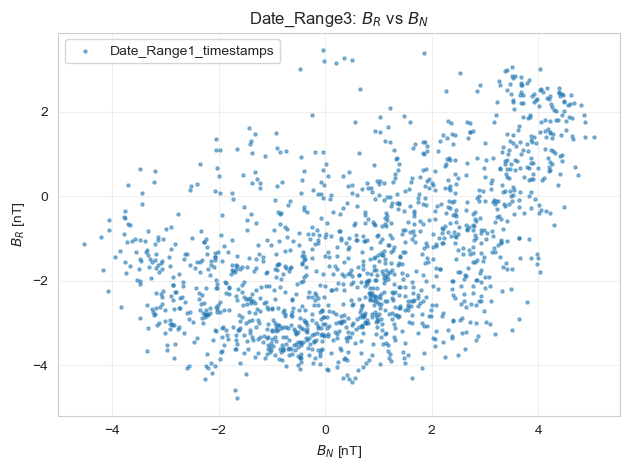

In [284]:
import numpy as np
import matplotlib.pyplot as plt

UNITS = {'BR': 'nT', 'BT': 'nT', 'BN': 'nT'}

stream_name = "Date_Range3"   # change this to browse streams

df_stream = MAG_df[MAG_df["name"] == stream_name].copy()

x = df_stream["BN"].to_numpy()
y = df_stream["BR"].to_numpy()

mask_lin = np.isfinite(x) & np.isfinite(y)


x_lin = x[mask_lin]
y_lin = y[mask_lin]
plt.figure()
plt.scatter(x, y, s=5, alpha=0.5, label="Date_Range1_timestamps")


plt.title(f"{stream_name}: $B_R$ vs $B_N$")
plt.xlabel(f"$B_N$ [{UNITS['BN']}]")
plt.ylabel(f"$B_R$ [{UNITS['BR']}]")
plt.grid(True, which='both', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()



In [303]:
MAG_df

,BR,BT,BN,Distance,name,|B|,|B_transv|
EPOCH,,,,,,,
2021-08-21 00:08:29.999999776,-13.179045,14.118096,0.086142,0.65,Date_Range1,19.313604,14.118360
2021-08-21 00:09:29.999996200,-13.549139,13.454594,1.530531,0.65,Date_Range1,19.155882,13.541368
2021-08-21 00:10:30.000002682,-14.307286,13.455720,2.443442,0.65,Date_Range1,19.792049,13.675775
2021-08-21 00:11:29.999999105,-12.954463,10.547703,9.633520,0.65,Date_Range1,19.284109,14.284913
2021-08-21 00:12:29.999995529,-14.416012,9.818862,8.968830,0.65,Date_Range1,19.613041,13.298494
...,...,...,...,...,...,...,...
2025-05-14 23:55:29.999995976,-7.750103,5.254740,6.910071,0.74,Date_Range134,11.637245,8.681093
2025-05-14 23:56:30.000002458,-8.614252,5.152640,6.119097,0.74,Date_Range134,11.755781,7.999566
2025-05-14 23:57:29.999998882,-9.546777,3.361250,6.075851,0.74,Date_Range134,11.804869,6.943628


In [305]:
MAG_df['solar radii']=MAG_df['Distance']*215 # 1au=215 solar radii
print(MAG_df[['Distance','solar radii']])

                               Distance  solar radii
EPOCH                                               
2021-08-21 00:08:29.999999776      0.65       139.75
2021-08-21 00:09:29.999996200      0.65       139.75
2021-08-21 00:10:30.000002682      0.65       139.75
2021-08-21 00:11:29.999999105      0.65       139.75
2021-08-21 00:12:29.999995529      0.65       139.75
...                                 ...          ...
2025-05-14 23:55:29.999995976      0.74       159.10
2025-05-14 23:56:30.000002458      0.74       159.10
2025-05-14 23:57:29.999998882      0.74       159.10
2025-05-14 23:58:29.999995306      0.74       159.10
2025-05-14 23:59:30.000001788      0.74       159.10

[111917 rows x 2 columns]


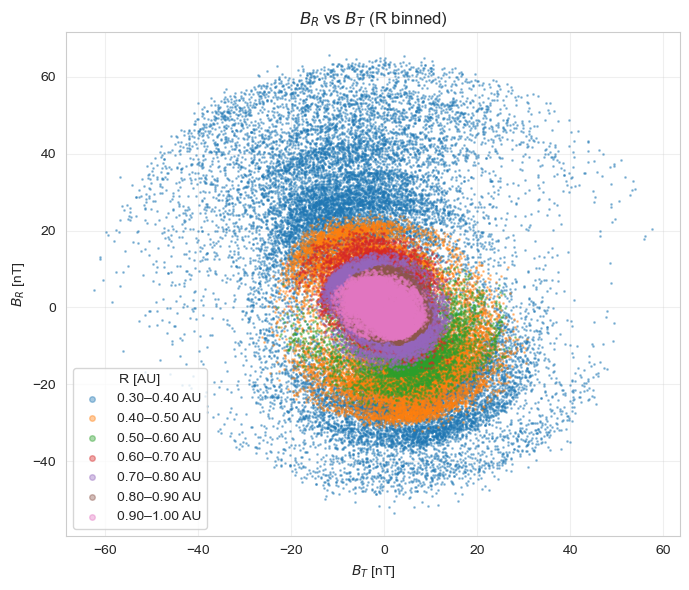

In [321]:
import numpy as np
import matplotlib.pyplot as plt

# ----------------------------------------------------
# Units (only for labels)
# ----------------------------------------------------
UNITS = {'BR': 'nT', 'BT': 'nT', 'Distance': 'AU'}

# ----------------------------------------------------
# Distance bins in AU
# ----------------------------------------------------
au_bins = [0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00]

# ----------------------------------------------------
# Load raw data
# ----------------------------------------------------
BT = MAG_df['BT'].values      # x-axis (nT)
BR = MAG_df['BR'].values      # y-axis (nT)
R  = MAG_df['Distance'].values  # AU

# ----------------------------------------------------
# Remove NaN / inf values
# ----------------------------------------------------
mask = np.isfinite(BT) & np.isfinite(BR) & np.isfinite(R)
BT = BT[mask]
BR = BR[mask]
R  = R[mask]

# ====================================================
# 1) Distance-binned raw hodogram
# ====================================================
plt.figure(figsize=(7, 6))

for i in range(len(au_bins) - 1):
    lo, hi = au_bins[i], au_bins[i + 1] #bin ranges

    in_bin = (R >= lo) & (R < hi) #Select values of R that are greater than or equal to lo AND less than hi and put them in a list of True / False values.

     #skip empty bins
    if in_bin.sum() == 0:
        continue

#plots only the points that belong to this distance bin.
    plt.scatter(
        BT[in_bin], #Give me only the BT values where in_bin is True.
        BR[in_bin], #Give me only the BR values where in_bin is True.
        s=1, #dot size
        alpha=0.4,#dot transparency #sparse regions look light,dense regions look darker
        label=f"{lo:.2f}–{hi:.2f} AU"
    )
 

plt.title(r"$B_R$ vs $B_T$ (R binned)")
plt.xlabel(f"$B_T$ [{UNITS['BT']}]")
plt.ylabel(f"$B_R$ [{UNITS['BR']}]")
plt.grid(alpha=0.3)
plt.legend(title=f"R [{UNITS['Distance']}]", markerscale=4)
plt.tight_layout()
plt.show()

# # ====================================================
# # 2) Optional: time direction arrow
# # ====================================================
# do_time_arrow = True
# 
# if do_time_arrow and len(BT) > 1000:
# 
#     n = int(0.05 * len(BT))   # first & last 5%
# 
#     x0, y0 = np.mean(BT[:n]), np.mean(BR[:n])
#     x1, y1 = np.mean(BT[-n:]), np.mean(BR[-n:])
# 
#     plt.figure(figsize=(7, 6))
#     plt.scatter(BT, BR, s=3, alpha=0.05)
# 
#     plt.arrow(
#         x0, y0,
#         x1 - x0,
#         y1 - y0,
#         length_includes_head=True,
#         head_width=0.2,
#         head_length=0.2
#     )
# 
#     plt.text(x0, y0, "time", fontsize=12)
# 
#     plt.title(r"$B_R$ vs $B_T$ (time direction)")
#     plt.xlabel(f"$B_T$ [{UNITS['BT']}]")
#     plt.ylabel(f"$B_R$ [{UNITS['BR']}]")
#     plt.grid(alpha=0.3)
#     plt.tight_layout()
#     plt.show()


# plots to check 5 relations 

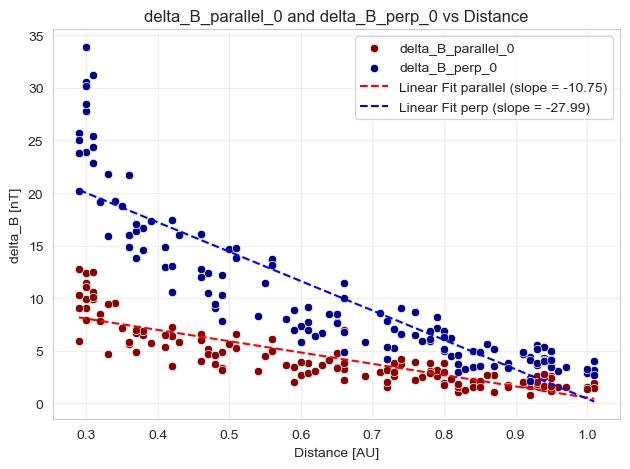

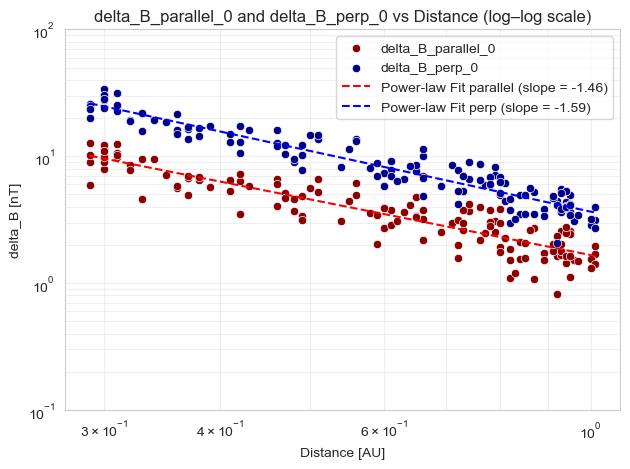

slope_parallel = -1.455839874121375 intercept_parallel = 0.22113296145330114
slope_perp = -1.5883474534757263 intercept_perp = 0.563382286659464


In [299]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import linregress

# ----------------- Units -----------------
UNITS_deltas = {
    'Distance': 'AU',
    'delta_B_parallel_0': 'nT',
    'delta_B_perp_0': 'nT'
}

# ----------------- Main plotting function -----------------
def redo_all_delta_means_plots(df):

    # ONLY these two columns, and they must be on ONE figure
    columns = ['delta_B_parallel_0', 'delta_B_perp_0']

    x = df['Distance'].values
    y1 = df[columns[0]].values
    y2 = df[columns[1]].values

    # ---------------- 1) Linear plot + linear fits (ONE FIGURE) ----------------
    mask_lin = np.isfinite(x) & np.isfinite(y1) & np.isfinite(y2)
    if mask_lin.sum() < 2:
        return

    x_lin = x[mask_lin]
    y1_lin = y1[mask_lin]
    y2_lin = y2[mask_lin]

    slope_1, intercept_1, _, _, _ = linregress(x_lin, y1_lin)
    slope_2, intercept_2, _, _, _ = linregress(x_lin, y2_lin)

    x_fit_lin = np.linspace(x_lin.min(), x_lin.max(), 200)
    y1_fit = slope_1 * x_fit_lin + intercept_1
    y2_fit = slope_2 * x_fit_lin + intercept_2

    plt.figure()

    sns.scatterplot(x=x_lin, y=y1_lin, color='darkred', label='delta_B_parallel_0')
    sns.scatterplot(x=x_lin, y=y2_lin, color='darkblue', label='delta_B_perp_0')

    plt.plot(x_fit_lin, y1_fit, 'r--',
             label=f'Linear Fit parallel (slope = {slope_1:.2f})')
    plt.plot(x_fit_lin, y2_fit, 'b--',
             label=f'Linear Fit perp (slope = {slope_2:.2f})')

    plt.title('delta_B_parallel_0 and delta_B_perp_0 vs Distance')
    plt.xlabel(f"Distance [{UNITS_deltas['Distance']}]")
    plt.ylabel("delta_B [nT]")

    plt.grid(True, which='both', alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # ---------------- 2) Log–log plot + power-law fits (ONE FIGURE) ----------------
    mask_log = (x > 0) & (y1 > 0) & (y2 > 0) & np.isfinite(x) & np.isfinite(y1) & np.isfinite(y2)
    if mask_log.sum() < 2:
        return

    x_log = x[mask_log]
    y1_log = y1[mask_log]
    y2_log = y2[mask_log]

    logx = np.log10(x_log)
    logy1 = np.log10(y1_log)
    logy2 = np.log10(y2_log)

    slope_1_pow, intercept_1_pow, _, _, _ = linregress(logx, logy1)
    slope_2_pow, intercept_2_pow, _, _, _ = linregress(logx, logy2)

    x_fit_log = np.logspace(np.log10(x_log.min()), np.log10(x_log.max()), 200)
    y1_fit_log = 10**intercept_1_pow * x_fit_log**slope_1_pow
    y2_fit_log = 10**intercept_2_pow * x_fit_log**slope_2_pow

    plt.figure()

    sns.scatterplot(x=x_log, y=y1_log, color='darkred', label='delta_B_parallel_0')
    sns.scatterplot(x=x_log, y=y2_log, color='darkblue', label='delta_B_perp_0')

    plt.plot(x_fit_log, y1_fit_log, 'r--',
             label=f'Power-law Fit parallel (slope = {slope_1_pow:.2f})')
    plt.plot(x_fit_log, y2_fit_log, 'b--',
             label=f'Power-law Fit perp (slope = {slope_2_pow:.2f})')

    plt.xscale('log')
    plt.yscale('log')

    # ---------   y-limits expansion ---------
    ymin = min(y1_log.min(), y2_log.min())
    ymax = max(y1_log.max(), y2_log.max())

    log_ymin = np.floor(np.log10(ymin))
    log_ymax = np.ceil(np.log10(ymax))

    # Expand if less than 2 digits (i.e. less than 2 decades)
    if (log_ymax - log_ymin) < 1:
        log_ymid = 0.5 * (log_ymin + log_ymax)
        log_ymin = np.floor(log_ymid - 1)
        log_ymax = np.ceil(log_ymid + 1)

    plt.ylim(10**log_ymin, 10**log_ymax)
    # --------------------------------------------------------------------

    plt.title('delta_B_parallel_0 and delta_B_perp_0 vs Distance (log–log scale)')
    plt.xlabel(f"Distance [{UNITS_deltas['Distance']}]")
    plt.ylabel("delta_B [nT]")

    plt.grid(True, which='both', alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

    print("slope_parallel =",slope_1_pow,"intercept_parallel =", intercept_1_pow)
    print("slope_perp =",slope_2_pow,"intercept_perp =", intercept_2_pow)


# Example call:
redo_all_delta_means_plots(all_delta_means_withmeans)


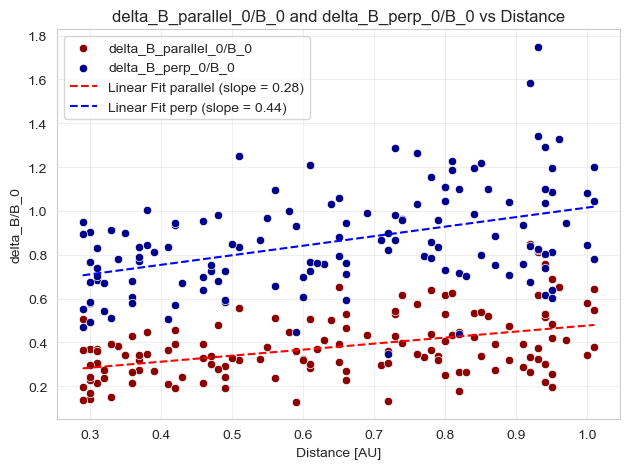

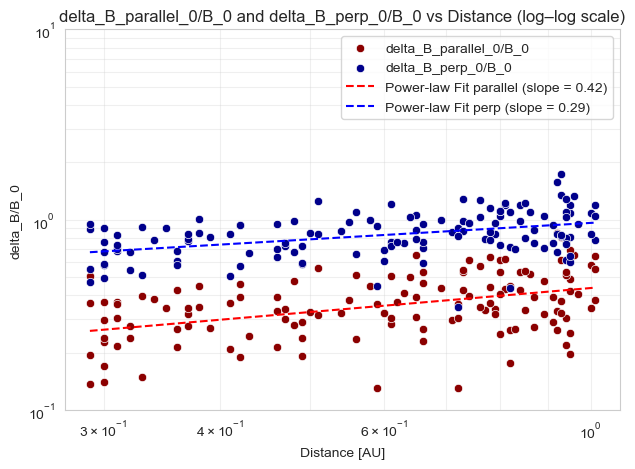

In [301]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import linregress

# ----------------- Units -----------------
UNITS_deltas = {
    'Distance': 'AU'
}

# ----------------- Main plotting function -----------------
def redo_all_delta_means_plots(df):

    # ONLY these two columns, and they must be on ONE figure
    columns = ['delta_B_parallel_0/B_0', 'delta_B_perp_0/B_0']

    x = df['Distance'].values
    y1 = df[columns[0]].values
    y2 = df[columns[1]].values

    # ---------------- 1) Linear plot + linear fits (ONE FIGURE) ----------------
    mask_lin = np.isfinite(x) & np.isfinite(y1) & np.isfinite(y2)
    if mask_lin.sum() < 2:
        return

    x_lin = x[mask_lin]
    y1_lin = y1[mask_lin]
    y2_lin = y2[mask_lin]

    slope_1, intercept_1, _, _, _ = linregress(x_lin, y1_lin)
    slope_2, intercept_2, _, _, _ = linregress(x_lin, y2_lin)

    x_fit_lin = np.linspace(x_lin.min(), x_lin.max(), 200)
    y1_fit = slope_1 * x_fit_lin + intercept_1
    y2_fit = slope_2 * x_fit_lin + intercept_2

    plt.figure()

    sns.scatterplot(x=x_lin, y=y1_lin, color='darkred', label='delta_B_parallel_0/B_0')
    sns.scatterplot(x=x_lin, y=y2_lin, color='darkblue', label='delta_B_perp_0/B_0')

    plt.plot(x_fit_lin, y1_fit, 'r--',
             label=f'Linear Fit parallel (slope = {slope_1:.2f})')
    plt.plot(x_fit_lin, y2_fit, 'b--',
             label=f'Linear Fit perp (slope = {slope_2:.2f})')

    plt.title('delta_B_parallel_0/B_0 and delta_B_perp_0/B_0 vs Distance')
    plt.xlabel(f"Distance [{UNITS_deltas['Distance']}]")
    plt.ylabel("delta_B/B_0")

    plt.grid(True, which='both', alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # ---------------- 2) Log–log plot + power-law fits (ONE FIGURE) ----------------
    mask_log = (x > 0) & (y1 > 0) & (y2 > 0) & np.isfinite(x) & np.isfinite(y1) & np.isfinite(y2)
    if mask_log.sum() < 2:
        return

    x_log = x[mask_log]
    y1_log = y1[mask_log]
    y2_log = y2[mask_log]

    logx = np.log10(x_log)
    logy1 = np.log10(y1_log)
    logy2 = np.log10(y2_log)

    slope_1_pow, intercept_1_pow, _, _, _ = linregress(logx, logy1)
    slope_2_pow, intercept_2_pow, _, _, _ = linregress(logx, logy2)

    x_fit_log = np.logspace(np.log10(x_log.min()), np.log10(x_log.max()), 200)
    y1_fit_log = 10**intercept_1_pow * x_fit_log**slope_1_pow
    y2_fit_log = 10**intercept_2_pow * x_fit_log**slope_2_pow

    plt.figure()

    sns.scatterplot(x=x_log, y=y1_log, color='darkred', label='delta_B_parallel_0/B_0')
    sns.scatterplot(x=x_log, y=y2_log, color='darkblue', label='delta_B_perp_0/B_0')

    plt.plot(x_fit_log, y1_fit_log, 'r--',
             label=f'Power-law Fit parallel (slope = {slope_1_pow:.2f})')
    plt.plot(x_fit_log, y2_fit_log, 'b--',
             label=f'Power-law Fit perp (slope = {slope_2_pow:.2f})')

    plt.xscale('log')
    plt.yscale('log')

    # --------- ADDED y-axis expansion block ---------
    ymin = min(y1_log.min(), y2_log.min())
    ymax = max(y1_log.max(), y2_log.max())

    log_ymin = np.floor(np.log10(ymin))
    log_ymax = np.ceil(np.log10(ymax))

    if (log_ymax - log_ymin) < 1:
        log_ymid = 0.5 * (log_ymin + log_ymax)
        log_ymin = np.floor(log_ymid - 1)
        log_ymax = np.ceil(log_ymid + 1)

    plt.ylim(10**log_ymin, 10**log_ymax)
    # -----------------------------------------------

    plt.title('delta_B_parallel_0/B_0 and delta_B_perp_0/B_0 vs Distance (log–log scale)')
    plt.xlabel(f"Distance [{UNITS_deltas['Distance']}]")
    plt.ylabel("delta_B/B_0")

    plt.grid(True, which='both', alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()


# Example call:
redo_all_delta_means_plots(all_delta_means_withmeans)


In [287]:
all_delta_means_withmeans

,mean_delta_|V|,mean_delta_VR,mean_delta_VN,mean_delta_VT,mean_delta_N,mean_squared_delta_|V|,mean_squared_delta_VR,mean_squared_delta_VN,mean_squared_delta_VT,mean_squared_delta_N,mean_delta_T_R,mean_delta_T_T,mean_delta_T_N,mean_delta_T,mean_delta_T_RR,mean_delta_T_RT,mean_delta_T_RN,mean_delta_T_TT,mean_delta_T_TN,mean_delta_T_NN,mean_delta_|B|,mean_squared_delta_BR,mean_squared_delta_BT,mean_squared_delta_BN,mean_squared_delta_|B|,mean_delta_|B_transv|,mean_squared_delta_|B_transv|,mean_squared_delta_B_parallel_0,mean_squared_delta_|B_perp_0|,mean_squared_|delta_B_vector|,root_mean_squared_delta_BR,root_mean_squared_delta_BT,root_mean_squared_delta_BN,root_mean_squared_delta_N,root_mean_squared_delta_|V|,root_mean_squared_delta_VR,root_mean_squared_delta_VN,root_mean_squared_delta_VT,root_mean_squared_delta_|B|,root_mean_squared_delta_|B_transv|,root_mean_squared_delta_B_parallel_0,root_mean_squared_delta_|B_perp_0|,root_mean_squared_|delta_B_vector|,Distance,VR_mean,VN_mean,VT_mean,|V|_mean,N_mean,Distance_mean,mass_flux_mean,T_R_mean,T_T_mean,T_N_mean,T_mean,P_RR_mean,P_RT_mean,P_RN_mean,P_TT_mean,P_TN_mean,P_NN_mean,P_RR_nPa_mean,P_RT_nPa_mean,P_RN_nPa_mean,P_TT_nPa_mean,P_TN_nPa_mean,P_NN_nPa_mean,T_RR_mean,T_RT_mean,T_RN_mean,T_TT_mean,T_TN_mean,T_NN_mean,BR_mean,BT_mean,BN_mean,|B|_mean,|B_transv|_mean,abs_BR_mean,abs_BT_mean,abs_BN_mean,theta,phi,|mean_B_vector|,root_mean_squared_delta_B_parallel,root_mean_squared_delta_B_perp,delta_parallel/delta_BT,delta_parallel/delta_BN,delta_parallel/perp,delta_perp/|B|,delta_parallel/|B|,delta_|B|/|B|,delta_perp/B_0,delta_parallel/B_0,delta_|B|/B_0,delta_B_parallel_0/B_0,delta_B_parallel_0,delta_B_perp_0,delta_B_perp_0/B_0,delta_B_parallel_0/delta_B_perp_0,deltas_RTN,deltas_RTN_check,deltas_//†,deltas_//†_check,deltas_difference_check,sphere_relation_RHS,sphere_relation_LHS,cos_theta_PS,theta_PS_observed,phi_PS,theta_PS_theory
name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Date_Range1,-8.303946e-07,0.000020,3.605661e-07,1.608171e-06,-3.935605e-07,616.675476,625.619080,474.038361,739.435059,30.827419,2.880329e-11,-8.983205e-12,2.060543e-11,-8.636601e-12,-0.014990,-0.000477,0.000014,0.003995,0.000246,0.016136,-2.769077e-07,17.421690,34.165417,30.573158,7.384876,1.897726e-07,8.330944,22.599514,59.560748,82.160263,4.173930,5.845119,5.529300,5.552245,24.832951,25.012379,21.772423,27.192554,2.717513,2.886338,4.753895,7.717561,9.064230,0.65,496.116516,-8.610609,-30.829149,498.375977,20.537035,0.65,1.603998e+08,257520.092613,247265.501825,248000.564108,250928.719429,7.637191e-17,-2.634947e-18,2.893411e-19,7.263337e-17,1.410537e-18,7.194673e-17,0.076372,-0.002635,0.000289,0.072633,0.001411,0.071947,257644.875000,-6109.813965,531.442688,247385.296875,2772.211914,248120.703125,-6.752596,2.362416,1.315146,11.299715,7.982371,6.752596,2.362416,1.315146,-19.282539,-49.770828,7.273800,4.173930,8.046029,0.714088,0.754875,0.518756,0.712056,0.369384,0.240494,1.106166,0.573831,0.373603,0.653564,4.753895,7.717561,1.061008,0.615984,82.160263,82.160278,82.160262,82.160263,-0.000015,4.753895,4.094197,0.928345,21.821720,68.178284,29.204881
Date_Range10,-3.373274e-05,-0.000013,5.695149e-07,3.605758e-08,-7.939977e-07,321.545074,299.106598,362.564728,641.024780,1.850509,2.205241e-12,3.182507e-11,1.162845e-12,-2.077655e-11,0.003865,0.000089,-0.000172,-0.015339,-0.000050,-0.018574,-5.635348e-08,5.673463,15.169092,7.751904,0.244240,-1.762853e-07,6.493843,4.835356,23.759102,28.594458,2.381903,3.894752,2.784224,1.360334,17.931679,17.294699,19.041132,25.318468,0.494207,2.548302,2.198944,4.874331,5.347379,0.66,536.230225,-18.924515,-15.096873,537.689575,8.857089,0.66,7.779941e+07,197220.701377,230159.770422,226642.377378,218007.616344,2.485079e-17,4.462695e-19,1.297913e-18,2.865244e-17,2.599186e-19,2.828052e-17,0.024851,0.000446,0.001298,0.028652,0.000260,0.028281,197316.250000,4139.970215,11054.771484,230271.296875,2219.331299,226752.203125,7